In [1]:
#Initial package import
%matplotlib inline
import pandas as pd
import numpy as np
import math as math
import sklearn
import sklearn.metrics
import matplotlib.pyplot as plt
import matplotlib
import xarray
import tqdm
import seaborn
import statsmodels
import shap
import pymint


In [2]:
#Load in data for model training and testing from csv using pandas
#Full dataset
complete = pd.read_csv('FULL_ML_DATA.csv', engine='python')

#Case study for operational implementation
case_study = pd.read_csv('CASE_STUDY_ML_DATA.csv', engine='python')

# **Simple Random Forest Classifier**

In [3]:
#Import more packages and explore a single train-test split of data.
import sklearn
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Data organization
#CHOOSE PREDICTORS TO USE IN ML PIPELINE

#Environmental Predictors
#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)', 'tr1meso', 'tr2meso', 'tr3meso', 'tr1dV', 'tr2dV', 'tr3dV', 'SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']

#Environmental Predictors
#predictor_cols = ['SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']

#1st iteration
predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)']

#2nd iteration
#predictor_cols = ['Avg_Meso_Distance_(Km)',	'Mode',	'Peak_(m/s)', 'tr3meso', 'tr2dV', 'tr3dV']

#3rd iteration
#predictor_cols = ['Avg_Meso_Distance_(Km)',	'Mode',	'Peak_(m/s)']

rng=np.random.RandomState(0)

target_col = ['Binary_EF']
X = complete[predictor_cols]
Y = complete[target_col]

training_predictor_x, test_predictor_x, training_target_y, test_target_y = train_test_split(X, Y, test_size=0.3, random_state=rng, stratify=Y)

#Robust Scaler
scaler = preprocessing.RobustScaler()
scaler.fit(training_predictor_x)
training_predictor = scaler.transform(training_predictor_x)
test_predictor = scaler.transform(test_predictor_x)

# **ML Pipeline Examples**

In [4]:
#Imports for pipeline
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier
from sklearn.pipeline import Pipeline
from matplotlib import pyplot

In [5]:
#import needed modules for nested CV ML
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import learning_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import permutation_test_score
import collections
from sklearn.calibration import calibration_curve
from sklearn.calibration import CalibratedClassifierCV

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [8]:
#Plot code for new calibration curves

import numpy
from descartes import PolygonPatch
import shapely.geometry
import matplotlib.colors
import matplotlib.pyplot as pyplot

DEFAULT_NUM_BINS = 20
RELIABILITY_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
RELIABILITY_LINE_WIDTH = 3
PERFECT_LINE_COLOUR = numpy.full(3, 152. / 255)
PERFECT_LINE_WIDTH = 2

NO_SKILL_LINE_COLOUR = numpy.array([31, 120, 180], dtype=float) / 255
NO_SKILL_LINE_WIDTH = 2
SKILL_AREA_TRANSPARENCY = 0.2
CLIMATOLOGY_LINE_COLOUR = numpy.full(3, 152. / 255)
CLIMATOLOGY_LINE_WIDTH = 2

HISTOGRAM_FACE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
HISTOGRAM_EDGE_COLOUR = numpy.full(3, 0.)
HISTOGRAM_EDGE_WIDTH = 2

HISTOGRAM_LEFT_EDGE_COORD = 0.575
HISTOGRAM_BOTTOM_EDGE_COORD = 0.175
HISTOGRAM_WIDTH = 0.3
HISTOGRAM_HEIGHT = 0.3

HIST_LEFT_EDGE_FOR_REGRESSION = 0.575
HIST_WIDTH_FOR_REGRESSION = 0.3
HIST_BOTTOM_EDGE_FOR_REGRESSION = 0.225
HIST_HEIGHT_FOR_REGRESSION = 0.25

HISTOGRAM_X_TICK_VALUES = numpy.linspace(0, 1, num=6, dtype=float)
HISTOGRAM_X_TICKS_FOR_REGRESSION = numpy.linspace(0, 0.02, num=11)
HISTOGRAM_Y_TICK_SPACING = 0.1

FIGURE_WIDTH_INCHES = 15
FIGURE_HEIGHT_INCHES = 15

FONT_SIZE = 20
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _vertices_to_polygon_object(x_vertices, y_vertices):
    """Converts two arrays of vertices to `shapely.geometry.Polygon` object.
    V = number of vertices
    This method allows for simple polygons only (no disjoint polygons, no
    holes).
    :param x_vertices: length-V numpy array of x-coordinates.
    :param y_vertices: length-V numpy array of y-coordinates.
    :return: polygon_object: Instance of `shapely.geometry.Polygon`.
    """

    list_of_vertices = []

    for i in range(len(x_vertices)):
        list_of_vertices.append(
            (x_vertices[i], y_vertices[i])
        )

    return shapely.geometry.Polygon(shell=list_of_vertices)


def _plot_background(axes_object, observed_labels):
    """Plots background of attributes diagram.
    E = number of examples
    :param axes_object: Instance of `matplotlib.axes._subplots.AxesSubplot`.
        Will plot on these axes.
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    """

    # Plot positive-skill area.
    climatology = numpy.mean(observed_labels)
    skill_area_colour = matplotlib.colors.to_rgba(
        NO_SKILL_LINE_COLOUR, SKILL_AREA_TRANSPARENCY)

    x_vertices_left = numpy.array([0, climatology, climatology, 0, 0])
    y_vertices_left = numpy.array([0, 0, climatology, climatology / 2, 0])

    left_polygon_object = _vertices_to_polygon_object(
        x_vertices=x_vertices_left, y_vertices=y_vertices_left)
    left_polygon_patch = PolygonPatch(
        left_polygon_object, lw=0, ec=skill_area_colour, fc=skill_area_colour)
    axes_object.add_patch(left_polygon_patch)

    x_vertices_right = numpy.array(
        [climatology, 1, 1, climatology, climatology]
    )
    y_vertices_right = numpy.array(
        [climatology, (1 + climatology) / 2, 1, 1, climatology]
    )

    right_polygon_object = _vertices_to_polygon_object(
        x_vertices=x_vertices_right, y_vertices=y_vertices_right)
    right_polygon_patch = PolygonPatch(
        right_polygon_object, lw=0, ec=skill_area_colour, fc=skill_area_colour)
    axes_object.add_patch(right_polygon_patch)

    # Plot no-skill line (at edge of positive-skill area).
    no_skill_x_coords = numpy.array([0, 1], dtype=float)
    no_skill_y_coords = numpy.array([climatology, 1 + climatology]) / 2
    axes_object.plot(
        no_skill_x_coords, no_skill_y_coords, color=NO_SKILL_LINE_COLOUR,
        linestyle='solid', linewidth=NO_SKILL_LINE_WIDTH)

    # Plot climatology line (vertical).
    climo_line_x_coords = numpy.full(2, climatology)
    climo_line_y_coords = numpy.array([0, 1], dtype=float)
    axes_object.plot(
        climo_line_x_coords, climo_line_y_coords, color=CLIMATOLOGY_LINE_COLOUR,
        linestyle='dashed', linewidth=CLIMATOLOGY_LINE_WIDTH)

    # Plot no-resolution line (horizontal).
    no_resolution_x_coords = climo_line_y_coords + 0.
    no_resolution_y_coords = climo_line_x_coords + 0.
    axes_object.plot(
        no_resolution_x_coords, no_resolution_y_coords,
        color=CLIMATOLOGY_LINE_COLOUR, linestyle='dashed',
        linewidth=CLIMATOLOGY_LINE_WIDTH)


def _floor_to_nearest(input_value_or_array, increment):
    """Rounds number(s) down to the nearest multiple of `increment`.
    :param input_value_or_array: Input (either scalar or numpy array).
    :param increment: Increment (or rounding base -- whatever you want to call
        it).
    :return: output_value_or_array: Rounded version of `input_value_or_array`.
    """

    return increment * numpy.floor(input_value_or_array / increment)


def _get_points_in_regression_relia_curve(observed_values, forecast_values,
                                          num_bins):
    """Creates points for regression-based reliability curve.
    E = number of examples
    B = number of bins
    :param observed_values: length-E numpy array of observed target values.
    :param forecast_values: length-E numpy array of forecast target values.
    :param num_bins: Number of bins for forecast value.
    :return: mean_forecast_by_bin: length-B numpy array of mean forecast values.
    :return: mean_observation_by_bin: length-B numpy array of mean observed
        values.
    :return: num_examples_by_bin: length-B numpy array with number of examples
        in each forecast bin.
    """

    inputs_to_bins = _get_histogram(
        input_values=forecast_values, num_bins=num_bins,
        min_value=numpy.min(forecast_values),
        max_value=numpy.max(forecast_values)
    )

    mean_forecast_by_bin = numpy.full(num_bins, numpy.nan)
    mean_observation_by_bin = numpy.full(num_bins, numpy.nan)
    num_examples_by_bin = numpy.full(num_bins, -1, dtype=int)

    for k in range(num_bins):
        these_example_indices = numpy.where(inputs_to_bins == k)[0]
        num_examples_by_bin[k] = len(these_example_indices)

        mean_forecast_by_bin[k] = numpy.mean(
            forecast_values[these_example_indices]
        )

        mean_observation_by_bin[k] = numpy.mean(
            observed_values[these_example_indices]
        )

    return mean_forecast_by_bin, mean_observation_by_bin, num_examples_by_bin


def get_points_in_relia_curve(
        observed_labels, forecast_probabilities, num_bins):
    """Creates points for reliability curve.
    The reliability curve is the main component of the attributes diagram.
    E = number of examples
    B = number of bins
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param num_bins: Number of bins for forecast probability.
    :return: mean_forecast_probs: length-B numpy array of mean forecast
        probabilities.
    :return: mean_event_frequencies: length-B numpy array of conditional mean
        event frequencies.  mean_event_frequencies[j] = frequency of label 1
        when forecast probability is in the [j]th bin.
    :return: num_examples_by_bin: length-B numpy array with number of examples
        in each forecast bin.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    assert num_bins > 1

    inputs_to_bins = _get_histogram(
        input_values=forecast_probabilities, num_bins=num_bins, min_value=0.,
        max_value=1.)

    mean_forecast_probs = numpy.full(num_bins, numpy.nan)
    mean_event_frequencies = numpy.full(num_bins, numpy.nan)
    num_examples_by_bin = numpy.full(num_bins, -1, dtype=int)

    for k in range(num_bins):
        these_example_indices = numpy.where(inputs_to_bins == k)[0]
        num_examples_by_bin[k] = len(these_example_indices)

        mean_forecast_probs[k] = numpy.mean(
            forecast_probabilities[these_example_indices])

        mean_event_frequencies[k] = numpy.mean(
            observed_labels[these_example_indices].astype(float)
        )

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin


def plot_reliability_curve(
        observed_labels, forecast_probabilities, num_bins=DEFAULT_NUM_BINS,
        axes_object=None):
    """Plots reliability curve.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param num_bins: Number of bins for forecast probability.
    :param axes_object: Will plot on these axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).  If `axes_object is None`,
        will create new axes.
    :return: mean_forecast_probs: See doc for `get_points_in_relia_curve`.
    :return: mean_event_frequencies: Same.
    :return: num_examples_by_bin: Same.
    """

    mean_forecast_probs, mean_event_frequencies, num_examples_by_bin = (
        get_points_in_relia_curve(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities, num_bins=num_bins)
    )

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    perfect_x_coords = numpy.array([0, 1], dtype=float)
    perfect_y_coords = perfect_x_coords + 0.
    axes_object.plot(
        perfect_x_coords, perfect_y_coords, color=PERFECT_LINE_COLOUR,
        linestyle='dashed', linewidth=PERFECT_LINE_WIDTH)

    real_indices = numpy.where(numpy.invert(numpy.logical_or(
        numpy.isnan(mean_forecast_probs), numpy.isnan(mean_event_frequencies)
    )))[0]

    axes_object.plot(
        mean_forecast_probs[real_indices], mean_event_frequencies[real_indices],
        color=RELIABILITY_LINE_COLOUR,
        linestyle='solid', linewidth=RELIABILITY_LINE_WIDTH)

    axes_object.set_xlabel('Forecast probability')
    axes_object.set_ylabel('Conditional event frequency')
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin


def plot_regression_relia_curve(
        observed_values, forecast_values, num_bins=DEFAULT_NUM_BINS,
        figure_object=None, axes_object=None):
    """Plots reliability curve for regression.
    :param observed_values: See doc for `get_points_in_regression_relia_curve`.
    :param forecast_values: Same.
    :param num_bins: Same.
    :param figure_object: See doc for `plot_attributes_diagram`.
    :param axes_object: Same.
    """

    mean_forecast_by_bin, mean_observation_by_bin, num_examples_by_bin = (
        _get_points_in_regression_relia_curve(
            observed_values=observed_values, forecast_values=forecast_values,
            num_bins=num_bins)
    )

    if figure_object is None or axes_object is None:
        figure_object, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    _plot_forecast_hist_for_regression(
        figure_object=figure_object, mean_forecast_by_bin=mean_forecast_by_bin,
        num_examples_by_bin=num_examples_by_bin)

    max_forecast_or_observed = max([
        numpy.max(forecast_values), numpy.max(observed_values)
    ])

    perfect_x_coords = numpy.array([0., max_forecast_or_observed])
    perfect_y_coords = perfect_x_coords + 0.
    axes_object.plot(
        perfect_x_coords, perfect_y_coords, color=PERFECT_LINE_COLOUR,
        linestyle='dashed', linewidth=PERFECT_LINE_WIDTH)

    real_indices = numpy.where(numpy.invert(numpy.logical_or(
        numpy.isnan(mean_forecast_by_bin), numpy.isnan(mean_observation_by_bin)
    )))[0]

    axes_object.plot(
        mean_forecast_by_bin[real_indices],
        mean_observation_by_bin[real_indices],
        color=RELIABILITY_LINE_COLOUR,
        linestyle='solid', linewidth=RELIABILITY_LINE_WIDTH)

    axes_object.set_xlabel('Forecast value')
    axes_object.set_ylabel('Conditional mean observation')
    axes_object.set_xlim(0., max_forecast_or_observed)
    axes_object.set_ylim(0., max_forecast_or_observed)


def plot_attributes_diagram(
        observed_labels, forecast_probabilities, num_bins=DEFAULT_NUM_BINS,
        figure_object=None, axes_object=None):
    """Plots attributes diagram.
    :param observed_labels: See doc for `plot_reliability_curve`.
    :param forecast_probabilities: Same.
    :param num_bins: Same.
    :param figure_object: Will plot on this figure (instance of
        `matplotlib.figure.Figure`).  If `figure_object is None`, will create a
        new one.
    :param axes_object: See doc for `plot_reliability_curve`.
    :return: mean_forecast_probs: See doc for `get_points_in_relia_curve`.
    :return: mean_event_frequencies: Same.
    :return: num_examples_by_bin: Same.
    """

    mean_forecast_probs, mean_event_frequencies, num_examples_by_bin = (
        get_points_in_relia_curve(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities, num_bins=num_bins)
    )

    if figure_object is None or axes_object is None:
        figure_object, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    _plot_background(axes_object=axes_object, observed_labels=observed_labels)

    plot_reliability_curve(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities, num_bins=num_bins,
        axes_object=axes_object)

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin

In [9]:
#Plot code for performance diagrams


DEFAULT_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
DEFAULT_LINE_WIDTH = 3
DEFAULT_BIAS_LINE_COLOUR = numpy.full(3, 152. / 255)
DEFAULT_BIAS_LINE_WIDTH = 2

LEVELS_FOR_CSI_CONTOURS = numpy.linspace(0, 1, num=11, dtype=float)
LEVELS_FOR_BIAS_CONTOURS = numpy.array(
    [0.25, 0.5, 0.75, 1., 1.5, 2., 3., 5.])

BIAS_STRING_FORMAT = '%.2f'
BIAS_LABEL_PADDING_PX = 10

FIGURE_WIDTH_INCHES = 10
FIGURE_HEIGHT_INCHES = 10

FONT_SIZE = 20
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _get_sr_pod_grid(success_ratio_spacing=0.01, pod_spacing=0.01):
    """Creates grid in SR-POD (success ratio / probability of detection) space.
    M = number of rows (unique POD values) in grid
    N = number of columns (unique success ratios) in grid
    :param success_ratio_spacing: Spacing between grid cells in adjacent
        columns.
    :param pod_spacing: Spacing between grid cells in adjacent rows.
    :return: success_ratio_matrix: M-by-N numpy array of success ratios.
        Success ratio increases with column index.
    :return: pod_matrix: M-by-N numpy array of POD values.  POD decreases with
        row index.
    """

    num_success_ratios = 1 + int(numpy.ceil(1. / success_ratio_spacing))
    num_pod_values = 1 + int(numpy.ceil(1. / pod_spacing))

    unique_success_ratios = numpy.linspace(0., 1., num=num_success_ratios)
    unique_pod_values = numpy.linspace(0., 1., num=num_pod_values)[::-1]
    return numpy.meshgrid(unique_success_ratios, unique_pod_values)


def _csi_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes CSI (critical success index) from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: csi_array: numpy array (same shape) of CSI values.
    """

    return (success_ratio_array ** -1 + pod_array ** -1 - 1.) ** -1


def _bias_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes frequency bias from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: frequency_bias_array: numpy array (same shape) of frequency biases.
    """

    return pod_array / success_ratio_array


def _get_csi_colour_scheme():
    """Returns colour scheme for CSI (critical success index).
    :return: colour_map_object: Colour scheme (instance of
        `matplotlib.colors.ListedColormap`).
    :return: colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.
    """

    this_colour_map_object = pyplot.cm.Blues
    this_colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, this_colour_map_object.N)

    rgba_matrix = this_colour_map_object(this_colour_norm_object(
        LEVELS_FOR_CSI_CONTOURS))
    colour_list = [
        rgba_matrix[i, ..., :-1] for i in range(rgba_matrix.shape[0])
    ]

    colour_map_object = matplotlib.colors.ListedColormap(colour_list)
    colour_map_object.set_under(numpy.array([1, 1, 1]))
    colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, colour_map_object.N)

    return colour_map_object, colour_norm_object


def _add_colour_bar(
        axes_object, colour_map_object, values_to_colour, min_colour_value,
        max_colour_value, colour_norm_object=None,
        orientation_string='vertical', extend_min=True, extend_max=True,
        fraction_of_axis_length=1., font_size=FONT_SIZE):
    """Adds colour bar to existing axes.
    :param axes_object: Existing axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).
    :param colour_map_object: Colour scheme (instance of
        `matplotlib.pyplot.cm`).
    :param values_to_colour: numpy array of values to colour.
    :param min_colour_value: Minimum value in colour map.
    :param max_colour_value: Max value in colour map.
    :param colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.  If `colour_norm_object is None`,
        will assume that scale is linear.
    :param orientation_string: Orientation of colour bar ("vertical" or
        "horizontal").
    :param extend_min: Boolean flag.  If True, the bottom of the colour bar will
        have an arrow.  If False, it will be a flat line, suggesting that lower
        values are not possible.
    :param extend_max: Same but for top of colour bar.
    :param fraction_of_axis_length: Fraction of axis length (y-axis if
        orientation is "vertical", x-axis if orientation is "horizontal")
        occupied by colour bar.
    :param font_size: Font size for labels on colour bar.
    :return: colour_bar_object: Colour bar (instance of
        `matplotlib.pyplot.colorbar`) created by this method.
    """

    if colour_norm_object is None:
        colour_norm_object = matplotlib.colors.Normalize(
            vmin=min_colour_value, vmax=max_colour_value, clip=False)

    scalar_mappable_object = pyplot.cm.ScalarMappable(
        cmap=colour_map_object, norm=colour_norm_object)
    scalar_mappable_object.set_array(values_to_colour)

    if extend_min and extend_max:
        extend_string = 'both'
    elif extend_min:
        extend_string = 'min'
    elif extend_max:
        extend_string = 'max'
    else:
        extend_string = 'neither'

    if orientation_string == 'horizontal':
        padding = 0.075
    else:
        padding = 0.05

    colour_bar_object = pyplot.colorbar(
        ax=axes_object, mappable=scalar_mappable_object,
        orientation=orientation_string, pad=padding, extend=extend_string,
        shrink=fraction_of_axis_length)

    colour_bar_object.ax.tick_params(labelsize=font_size)
    return colour_bar_object


def get_points_in_perf_diagram(observed_labels, forecast_probabilities):
    """Creates points for performance diagram.
    E = number of examples
    T = number of binarization thresholds
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :return: pod_by_threshold: length-T numpy array of POD (probability of
        detection) values.
    :return: success_ratio_by_threshold: length-T numpy array of success ratios.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    observed_labels = observed_labels.astype(int)
    binarization_thresholds = numpy.linspace(0, 1, num=1001, dtype=float)

    num_thresholds = len(binarization_thresholds)
    pod_by_threshold = numpy.full(num_thresholds, numpy.nan)
    success_ratio_by_threshold = numpy.full(num_thresholds, numpy.nan)

    for k in range(num_thresholds):
        these_forecast_labels = (
            forecast_probabilities >= binarization_thresholds[k]
        ).astype(int)

        this_num_hits = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 1
        ))

        this_num_false_alarms = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 0
        ))

        this_num_misses = numpy.sum(numpy.logical_and(
            these_forecast_labels == 0, observed_labels == 1
        ))

        try:
            pod_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_misses)
            )
        except ZeroDivisionError:
            pass

        try:
            success_ratio_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_false_alarms)
            )
        except ZeroDivisionError:
            pass

    pod_by_threshold = numpy.array([1.] + pod_by_threshold.tolist() + [0.])
    success_ratio_by_threshold = numpy.array(
        [0.] + success_ratio_by_threshold.tolist() + [1.]
    )

    return pod_by_threshold, success_ratio_by_threshold


def plot_performance_diagram(
        observed_labels, forecast_probabilities,
        line_colour=DEFAULT_LINE_COLOUR, line_width=DEFAULT_LINE_WIDTH,
        bias_line_colour=DEFAULT_BIAS_LINE_COLOUR,
        bias_line_width=DEFAULT_BIAS_LINE_WIDTH, axes_object=None):
    """Plots performance diagram.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param line_colour: Colour (in any format accepted by `matplotlib.colors`).
    :param line_width: Line width (real positive number).
    :param bias_line_colour: Colour of contour lines for frequency bias.
    :param bias_line_width: Width of contour lines for frequency bias.
    :param axes_object: Will plot on these axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).  If `axes_object is None`,
        will create new axes.
    :return: pod_by_threshold: See doc for `get_points_in_perf_diagram`.
        detection) values.
    :return: success_ratio_by_threshold: Same.
    """

    pod_by_threshold, success_ratio_by_threshold = get_points_in_perf_diagram(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities)

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    success_ratio_matrix, pod_matrix = _get_sr_pod_grid()
    csi_matrix = _csi_from_sr_and_pod(success_ratio_matrix, pod_matrix)
    frequency_bias_matrix = _bias_from_sr_and_pod(
        success_ratio_matrix, pod_matrix)

    this_colour_map_object, this_colour_norm_object = _get_csi_colour_scheme()

    pyplot.contourf(
        success_ratio_matrix, pod_matrix, csi_matrix, LEVELS_FOR_CSI_CONTOURS,
        cmap=this_colour_map_object, norm=this_colour_norm_object, vmin=0.,
        vmax=1., axes=axes_object)

    colour_bar_object = _add_colour_bar(
        axes_object=axes_object, colour_map_object=this_colour_map_object,
        colour_norm_object=this_colour_norm_object,
        values_to_colour=csi_matrix, min_colour_value=0.,
        max_colour_value=1., orientation_string='vertical',
        extend_min=False, extend_max=False)
    colour_bar_object.set_label('CSI (critical success index)')

    bias_colour_tuple = ()
    for _ in range(len(LEVELS_FOR_BIAS_CONTOURS)):
        bias_colour_tuple += (bias_line_colour,)

    bias_contour_object = pyplot.contour(
        success_ratio_matrix, pod_matrix, frequency_bias_matrix,
        LEVELS_FOR_BIAS_CONTOURS, colors=bias_colour_tuple,
        linewidths=bias_line_width, linestyles='dashed', axes=axes_object)
    pyplot.clabel(
        bias_contour_object, inline=True, inline_spacing=BIAS_LABEL_PADDING_PX,
        fmt=BIAS_STRING_FORMAT, fontsize=FONT_SIZE)

    nan_flags = numpy.logical_or(
        numpy.isnan(success_ratio_by_threshold), numpy.isnan(pod_by_threshold)
    )

    if not numpy.all(nan_flags):
        real_indices = numpy.where(numpy.invert(nan_flags))[0]
        axes_object.plot(
            success_ratio_by_threshold[real_indices],
            pod_by_threshold[real_indices], color=line_colour,
            linestyle='solid', linewidth=line_width)

    axes_object.set_xlabel('Success ratio (1 - FAR)')
    axes_object.set_ylabel('POD (probability of detection)')
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)

    return pod_by_threshold, success_ratio_by_threshold

In [10]:
#Set training event frequency
training_event_frequency = np.mean(
    train_y_cs['Binary_EF'].values)
training_event_frequency

0.35333333333333333

[1 5 4 6 2 3]
[[38  1]
 [ 7 14]]
>acc=0.867, est=0.888, cfg={'model__n_estimators': 8, 'model__min_samples_split': 8, 'model__min_samples_leaf': 4, 'model__max_depth': 10}
[1 4 3 5 2 6]
[[37  2]
 [ 5 16]]
>acc=0.883, est=0.888, cfg={'model__n_estimators': 200, 'model__min_samples_split': 4, 'model__min_samples_leaf': 1, 'model__max_depth': 1}
[1 1 1 1 1 1]
[[37  2]
 [ 6 15]]
>acc=0.867, est=0.887, cfg={'model__n_estimators': 8, 'model__min_samples_split': 7, 'model__min_samples_leaf': 5, 'model__max_depth': 4}
[1 5 3 6 2 4]
[[37  2]
 [ 6 15]]
>acc=0.867, est=0.896, cfg={'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__min_samples_leaf': 5, 'model__max_depth': 4}
[1 5 3 6 2 4]
[[36  2]
 [ 4 18]]
>acc=0.900, est=0.883, cfg={'model__n_estimators': 64, 'model__min_samples_split': 7, 'model__min_samples_leaf': 2, 'model__max_depth': 10}
[1 3 4 5 2 6]
[[37  2]
 [ 3 18]]
>acc=0.917, est=0.888, cfg={'model__n_estimators': 8, 'model__min_samples_split': 6, 'model__min_samples_

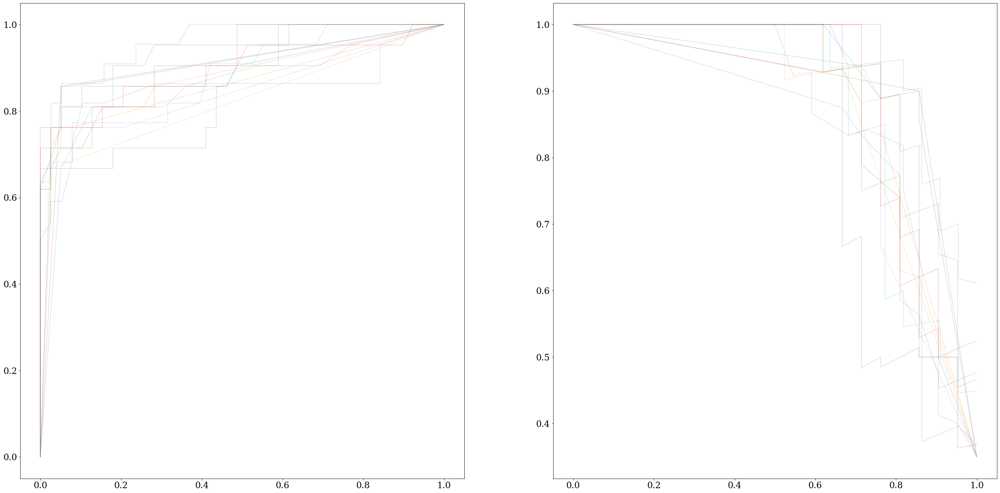

In [22]:
#ML Pipeline with RFE for all analyses except SHAP
train_sizes = [50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160]

training_event_frequency = np.mean(
    train_y_cs['Binary_EF'].values)

#Permutation Test 2
n_uncorrelated_features = 1000
rng = np.random.RandomState(seed=4)
# Use same number of samples as in iris and 1000 features
X_rand = rng.normal(size=(200, n_uncorrelated_features))

ran=4
# configure the cross-validation procedure
outer_cv = RepeatedStratifiedKFold(n_splits=5,n_repeats=3, random_state=ran)
# enumerate splits
outer_acc = list()
outer_jac = list()
outer_brier = list()
outer_ll = list()
outer_mas = list()
outer_mse = list()
outer_prec = list()
outer_recall = list()
outer_auc = list()
outer_f1 = list()
outer_f2 = list()
outer_TP = list()
outer_FP = list()
outer_FN = list()
outer_TN = list()
outer_FPR = list()
outer_FNR = list()
outer_TNR = list()
outer_NPV = list()
outer_FDR = list()
outer_cohen_kappa = list()
outer_matt_cc = list()
outer_avg_prec_auc = list()

outer_train_scores_LC_ac = list()
outer_val_scores_LC_ac = list()
outer_train_scores_LC_ll = list()
outer_val_scores_LC_ll = list()

#ROC Curve Initialization
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i=0

#PR Curve Initialization
y_real = []
y_proba = []
j=0

#Initialize plots for ROC and P-R Curves
fig, (ax1,ax2) = plt.subplots(1,2, figsize=[40,20])

#Permutation Tests
score = []
perm_scores = []
pvalue = []

score_rand = []
perm_scores_rand = []
pvalue_rand = []

#Initiate incorrect counts
FN_EF_total = []
FP_EF_total = []

FN_mode_total = []
FP_mode_total = []

#Calibration Curve
fop_ = []
mpv_ = []

yprobs = []

for train_ix, test_ix in outer_cv.split(X,Y.values.ravel()):
	  # split data
    X_train, X_test = X.iloc[train_ix, :], X.iloc[test_ix, :]
    y_train, y_test = Y.values.ravel()[train_ix], Y.values.ravel()[test_ix]
    # configure the cross-validation procedure
    inner_cv = StratifiedKFold(3, shuffle=True, random_state=ran)
    # define the model
    scaler = preprocessing.RobustScaler()
    #rfe = RFE(estimator=LogisticRegression(solver='liblinear', max_iter=1000000), n_features_to_select=2)
    rfe = RFECV(estimator=LogisticRegression(solver='liblinear', max_iter=100000),cv=inner_cv, min_features_to_select=1)
    model = RandomForestClassifier(max_features='sqrt', random_state=ran)
    calibrated = CalibratedClassifierCV(model, method='sigmoid', cv=inner_cv)
    pipeline = Pipeline(steps=[('scaler', scaler), ('feature_selection', rfe), ('model', model)])
    # define search space
    n_estimators = [4, 8, 16, 32, 64, 100, 200]
    # Maximum number of levels in tree
    max_depth = range(1,13,3)
    # Minimum number of samples required to split a node
    min_samples_split = [2,3,4,5,6,7,8]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1,2,3,4,5]
    grid = dict(model__n_estimators=n_estimators, model__max_depth=max_depth, model__min_samples_split=min_samples_split, model__min_samples_leaf=min_samples_leaf)
    # define search
    search = RandomizedSearchCV(estimator=pipeline, param_distributions=grid, n_iter=600, cv=inner_cv, n_jobs=-1, scoring='accuracy', refit=True)
    # execute search
    result = search.fit(X_train, y_train)
    #rfe_ob = rfe.fit(X_train, y_train)
    #print(rfe_ob.support_)
    #print(rfe_ob.ranking_)
    # get the best performing model fit on the whole training set
    best_model = result.best_estimator_
    print(best_model['feature_selection'].ranking_)
    # evaluate model on the hold out dataset
    yhat = best_model.predict(X_test)
    yprob = best_model.predict_proba(X_test)
    cnf_matrix = sklearn.metrics.confusion_matrix(y_test, yhat)
    TP = cnf_matrix[1,1]
    FP = cnf_matrix[0,1]
    FN = cnf_matrix[1,0]
    TN = cnf_matrix[0,0]
    print(cnf_matrix)
    
    #Calibration Curve
    fop, mpv = calibration_curve(y_test, yprob[:,1], n_bins=5)
    
    #Plot ROC curve
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_test, yprob[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
        
    tprs[-1][0] = 0.0
    roc_auc = sklearn.metrics.roc_auc_score(y_test, yprob[:,1])
    aucs.append(roc_auc)
    ax1.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1
    
    #Precision-recall curve
    precision, recall, _ = precision_recall_curve(y_test, yprob[:, 1])
        
    #Plotting each individual PR Curve
    ax2.plot(recall, precision, lw=1, alpha=0.3, label='PR fold %d (AUC = %0.2f)' % (j, sklearn.metrics.average_precision_score(y_test, yprob[:, 1])))
    y_real.append(y_test)
    y_proba.append(yprob[:, 1])
    j += 1
    
    #Learning Curves
    #accuracy
    train_sizes, train_scores1, validation_scores1 = learning_curve(estimator = best_model, X = X_train, y = y_train, train_sizes = train_sizes, cv = inner_cv, scoring = 'accuracy')
    #Log loss
    train_sizes, train_scores2, validation_scores2 = learning_curve(estimator = best_model, X = X_train, y = y_train, train_sizes = train_sizes, cv = inner_cv, scoring = 'neg_log_loss')

    #Permutation Tests
    #Permutation Test 1
    #score1, perm_scores1, pvalue1 = permutation_test_score(best_model, X = X_train, y = y_train, scoring="accuracy", cv=inner_cv, n_permutations=675)
    
    #Permutation Test 2
    #score_rand1, perm_scores_rand1, pvalue_rand1 = permutation_test_score(best_model, X = X_train, y = y_train, scoring="accuracy", cv=inner_cv, n_permutations=675)
    
    #Incorrect Counts
    #pred_delta=y_test-yhat
    #FN_loc = np.where(pred_delta==1)[0]
    #FP_loc = np.where(pred_delta==-1)[0]
    #locations=X_test.index
    #EF_ratings = complete['EF_Rating'][locations]
    #F_ratings_loc = EF_ratings.reset_index()
    #FN_EF = EF_ratings_loc['EF_Rating'][FN_loc]
    #FP_EF = EF_ratings_loc['EF_Rating'][FP_loc]
    pred_delta=y_test-yhat
    FN_loc = np.where(pred_delta==1)[0]
    FP_loc = np.where(pred_delta==-1)[0]
    locations=X_test.index
    Modes = complete['Mode'][locations]
    Modes_loc = Modes.reset_index()
    FN_modes = Modes_loc['Mode'][FN_loc]
    FP_modes = Modes_loc['Mode'][FP_loc]

    
    # evaluate the model
    acc = sklearn.metrics.accuracy_score(y_test, yhat)
    jac = sklearn.metrics.jaccard_score(y_test, yhat)
    brier = sklearn.metrics.brier_score_loss(y_test, yprob[:,1])
    ll = sklearn.metrics.log_loss(y_test, yprob[:,1])
    mas = sklearn.metrics.mean_absolute_error(y_test, yhat)
    mse = sklearn.metrics.mean_squared_error(y_test, yhat)
    prec = sklearn.metrics.precision_score(y_test, yhat)
    recall = sklearn.metrics.recall_score(y_test, yhat)
    auc = sklearn.metrics.roc_auc_score(y_test, yprob[:,1])
    f1 = sklearn.metrics.f1_score(y_test, yhat)
    f2 = sklearn.metrics.fbeta_score(y_test, yhat, beta=2)
    FPR = FP/(FP+TN)
    FNR = FN/(TP+FN)
    TNR = TN/(TN+FP)
    NPV = TN/(TN+FN)
    FDR = FP/(TP+FP)
    cohen_kappa = sklearn.metrics.cohen_kappa_score(y_test, yhat)
    matt_cc = sklearn.metrics.matthews_corrcoef(y_test, yhat)
    avg_prec_auc = sklearn.metrics.average_precision_score(y_test, yprob[:,1])
    # store the result
    outer_acc.append(acc)
    outer_jac.append(jac)
    outer_brier.append(brier)
    outer_ll.append(ll)
    outer_mas.append(mas)
    outer_mse.append(mse)
    outer_prec.append(prec)
    outer_recall.append(recall)
    outer_auc.append(auc)
    outer_f1.append(f1)
    outer_f2.append(f2)
    outer_TP.append(TP)
    outer_FP.append(FP)
    outer_FN.append(FN)
    outer_TN.append(TN)
    outer_FPR.append(FPR)
    outer_FNR.append(FNR)
    outer_TNR.append(TNR)
    outer_NPV.append(NPV)
    outer_FDR.append(FDR)
    outer_cohen_kappa.append(cohen_kappa)
    outer_matt_cc.append(matt_cc)
    outer_avg_prec_auc.append(avg_prec_auc)
    
    outer_train_scores_LC_ac.append(train_scores1)
    outer_train_scores_LC_ll.append(train_scores2)
    outer_val_scores_LC_ac.append(validation_scores1)
    outer_val_scores_LC_ll.append(validation_scores2)
    
    #score.append(score1)
    #perm_scores.append(perm_scores1)
    #pvalue.append(pvalue1)
    
    #score_rand.append(score_rand1)
    #perm_scores_rand.append(perm_scores_rand1)
    #pvalue_rand.append(pvalue_rand1)
    
    #FN_EF_total.append(FN_EF.values)
    #FP_EF_total.append(FP_EF.values)
    
    FN_mode_total.append(FN_modes.values)
    FP_mode_total.append(FP_modes.values)
    
    fop_.append(fop)
    mpv_.append(mpv)
    
    yprobs.append(yprob)
    
    # report progress
    print('>acc=%.3f, est=%.3f, cfg=%s' % (acc, result.best_score_, result.best_params_))
    
# summarize the estimated performance of the model
print('Accuracy: %.3f (%.3f)' % (np.mean(outer_acc), np.std(outer_acc)))
print(np.mean(outer_acc))
print(np.mean(outer_jac))
print(np.mean(outer_brier))
print(np.mean(outer_ll))
print(np.mean(outer_mas))
print(np.mean(outer_mse))
print(np.mean(outer_prec))
print(np.mean(outer_recall))
print(np.mean(outer_auc))
print(np.mean(outer_f1))
print(np.mean(outer_f2))
print(np.mean(outer_FPR))
print(np.mean(outer_FNR))
print(np.mean(outer_TNR))
print(np.mean(outer_NPV))
print(np.mean(outer_FDR))
print(np.mean(outer_cohen_kappa))
print(np.mean(outer_matt_cc))
print(np.mean(outer_avg_prec_auc))

print(np.std(outer_acc))
print(np.std(outer_jac))
print(np.std(outer_brier))
print(np.std(outer_ll))
print(np.std(outer_mas))
print(np.std(outer_mse))
print(np.std(outer_prec))
print(np.std(outer_recall))
print(np.std(outer_auc))
print(np.std(outer_f1))
print(np.std(outer_f2))
print(np.std(outer_FPR))
print(np.std(outer_FNR))
print(np.std(outer_TNR))
print(np.std(outer_NPV))
print(np.std(outer_FDR))
print(np.std(outer_cohen_kappa))
print(np.std(outer_matt_cc))
print(np.std(outer_avg_prec_auc))

print('Confusion Matrix')
print(np.sum(outer_TP))
print(np.sum(outer_TN))
print(np.sum(outer_FP))
print(np.sum(outer_FN))

#Mean Learning Curves
mean_train_ac = np.mean(np.mean(outer_train_scores_LC_ac, axis=2), axis=0)
mean_train_ll = np.mean(np.mean(outer_train_scores_LC_ll, axis=2),axis=0)
mean_val_ac = np.mean(np.mean(outer_val_scores_LC_ac, axis=2),axis=0)
mean_val_ll = np.mean(np.mean(outer_val_scores_LC_ll, axis=2),axis=0)

#Mean Permutation Tests
#Test 1
#mean_score_perm = np.mean(score)
#mean_perm_scores_in = np.mean(perm_scores)
#mean_pvalue_perm = np.mean(pvalue)


#Test 2
#mean_score_rand_perm = np.mean(score_rand)
#mean_perm_scores_rand_in = np.mean(perm_scores_rand, axis=0)
#mean_pvalue_rand_perm = np.mean(pvalue_rand)

#Incorrect Counts
#print('EF2s:',(np.concatenate(FN_EF_total)==2).sum())
#print('EF3s:',(np.concatenate(FN_EF_total)==3).sum())
#print('EF4s:',(np.concatenate(FN_EF_total)==4).sum())
#print('EF5s:',(np.concatenate(FN_EF_total)==5).sum())
#print('EF0s:',(np.concatenate(FP_EF_total)==0).sum())
#print('EF1s:',(np.concatenate(FP_EF_total)==1).sum())

print('FN QLCSs:',(np.concatenate(FN_mode_total)==0).sum())
print('FP QLCSs:',(np.concatenate(FP_mode_total)==0).sum())
print('FN Discrete:',(np.concatenate(FN_mode_total)==1).sum())
print('FP Discrete:',(np.concatenate(FP_mode_total)==1).sum())
print('FN Multicell:',(np.concatenate(FN_mode_total)==2).sum())
print('FP Multicell:',(np.concatenate(FP_mode_total)==2).sum())

In [37]:
#Define data separations for later analyses
violent_loc = np.where((complete['EF_Rating'][train_ix]==4) | (complete['EF_Rating'][train_ix]==5))
EF1_loc  = np.where((complete['EF_Rating'][train_ix]==1))
EF2_loc  = np.where((complete['EF_Rating'][train_ix]==2))
dsc_loc = np.where((complete['Mode'][train_ix]==1))
qlcs_loc = np.where((complete['Mode'][train_ix]==0))
mul_loc = np.where((complete['Mode'][train_ix]==2))

[[37  2]
 [ 6 15]]
>acc=0.867, est=0.883, cfg={'model__n_estimators': 32, 'model__min_samples_split': 8, 'model__min_samples_leaf': 4, 'model__max_depth': 10}
[[37  2]
 [ 4 17]]
>acc=0.900, est=0.875, cfg={'model__n_estimators': 32, 'model__min_samples_split': 8, 'model__min_samples_leaf': 1, 'model__max_depth': 10}
[[38  1]
 [ 6 15]]
>acc=0.883, est=0.887, cfg={'model__n_estimators': 32, 'model__min_samples_split': 3, 'model__min_samples_leaf': 1, 'model__max_depth': 10}
[[35  4]
 [ 7 14]]
>acc=0.817, est=0.892, cfg={'model__n_estimators': 100, 'model__min_samples_split': 3, 'model__min_samples_leaf': 2, 'model__max_depth': 7}
[[37  1]
 [ 4 18]]
>acc=0.917, est=0.871, cfg={'model__n_estimators': 100, 'model__min_samples_split': 8, 'model__min_samples_leaf': 1, 'model__max_depth': 7}
[[38  1]
 [ 4 17]]
>acc=0.917, est=0.879, cfg={'model__n_estimators': 32, 'model__min_samples_split': 8, 'model__min_samples_leaf': 4, 'model__max_depth': 10}
[[39  0]
 [10 11]]
>acc=0.833, est=0.879, cfg=

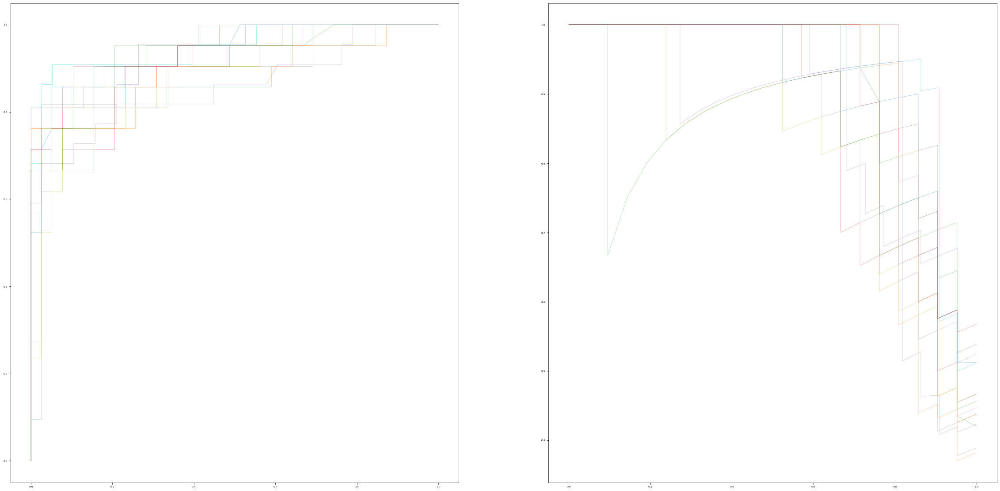

In [15]:
#ML Pipeline without RFE for focus on SHAP Analyses

#SET PREDICTORS
#Environmental Predictors
#predictor_cols = ['SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)', 'SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#names = ['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)', 'SBCAPE_MEAN (J/kg)', 'SBCIN_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', '03CAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_top_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'srwind_02_MEAN (m/s)', 'srwind_46_MEAN (m/s)', 'srwind_911_MEAN (m/s)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LCL_h_MEAN (m)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN (°)']
#names = ['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)']

#predictor_cols = ['SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#names = ['SBCAPE_MEAN (J/kg)', 'SBCIN_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', '03CAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_top_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'srwind_02_MEAN (m/s)', 'srwind_46_MEAN (m/s)', 'srwind_911_MEAN (m/s)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LCL_h_MEAN (m)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN (°)']


#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)', 'SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#names = ['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)', 'SBCAPE_MEAN (J/kg)', 'SBCIN_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', '03CAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_top_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'srwind_02_MEAN (m/s)', 'srwind_46_MEAN (m/s)', 'srwind_911_MEAN (m/s)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LCL_h_MEAN (m)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN (°)']

predictor_cols = ['Avg_Meso_Distance_(Km)','Peak_(m/s)', 'Distance(km)', 'SBCAPE_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN']
names = ['Average Pretornadic Mesocyclone Width (km)', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)', 'SBCAPE_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN']


#predictor_cols = ['MLCAPE_MEAN', '06bulk_MEAN', '01bulk_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']
#predictor_cols = ['SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'critang_MEAN']
#predictor_cols = ['MLCAPE_MEAN', 'eff_layer_depth_ma_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN']
#predictor_cols = ['06bulk_MEAN', 'EBS_MEAN', 'ESRH_MEAN']
#predictor_cols = ['SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']
#predictor_cols = ['SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN', 'EBS_MEAN', 'ESRH_MEAN', '06bulk_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN', 'MLCAPE_MEAN']


target_col = ['Binary_EF']
X = complete[predictor_cols]
Y = complete[target_col]
#Long code version
train_sizes = [50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160]

#Permutation Test 2
n_uncorrelated_features = 1000
rng = np.random.RandomState(seed=4)
# Use same number of samples as in iris and 1000 features
X_rand = rng.normal(size=(200, n_uncorrelated_features))

ran=4
# configure the cross-validation procedure
outer_cv = RepeatedStratifiedKFold(n_splits=5,n_repeats=3, random_state=ran)
# enumerate splits
outer_acc = list()
outer_jac = list()
outer_brier = list()
outer_ll = list()
outer_mas = list()
outer_mse = list()
outer_prec = list()
outer_recall = list()
outer_auc = list()
outer_f1 = list()
outer_f2 = list()
outer_TP = list()
outer_FP = list()
outer_FN = list()
outer_TN = list()
outer_FPR = list()
outer_FNR = list()
outer_TNR = list()
outer_NPV = list()
outer_FDR = list()
outer_cohen_kappa = list()
outer_matt_cc = list()
outer_avg_prec_auc = list()

outer_train_scores_LC_ac = list()
outer_val_scores_LC_ac = list()
outer_train_scores_LC_ll = list()
outer_val_scores_LC_ll = list()

#ROC Curve Initialization
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)
i=0

#PR Curve Initialization
y_real = []
y_proba = []
j=0

#Initialize plots for ROC and P-R Curves
fig, (ax1,ax2) = plt.subplots(1,2, figsize=[40,20])

#Permutation Tests
score = []
perm_scores = []
pvalue = []

score_rand = []
perm_scores_rand = []
pvalue_rand = []

#Initiate incorrect counts
FN_EF_total = []
FP_EF_total = []

FN_mode_total = []
FP_mode_total = []

#Calibration Curve
fop_ = []
mpv_ = []

yprobs = []

#SHAP
shap_values = []
test_sets = []

values_shap = []
base_shap = []
pred_shap = []

values_shap_EF3 = []
base_shap_EF3 = []
pred_shap_EF3 = []
X_EF3 = []

values_shap_EF4 = []
base_shap_EF4 = []
pred_shap_EF4 = []
X_EF4 = []

values_shap_EF5 = []
base_shap_EF5 = []
pred_shap_EF5 = []
X_EF5 = []

values_shap_nonsig = []
base_shap_nonsig = []
pred_shap_nonsig = []

values_shap_sig = []
base_shap_sig = []
pred_shap_sig = []

values_shap_vio = []
base_shap_vio = []
pred_shap_vio = []
X_vio = []

values_shap_EF0 = []
base_shap_EF0 = []
pred_shap_EF0 = []
X_EF0 = []

values_shap_EF1 = []
base_shap_EF1 = []
pred_shap_EF1 = []
X_EF1 = []

values_shap_EF2 = []
base_shap_EF2 = []
pred_shap_EF2 = []
X_EF2 = []

values_shap_cor = []
base_shap_cor = []
pred_shap_cor = []
X_cor = []

values_shap_cor_EF0 = []
base_shap_cor_EF0 = []
pred_shap_cor_EF0 = []
X_cor_EF0 = []

values_shap_cor_EF1 = []
base_shap_cor_EF1 = []
pred_shap_cor_EF1 = []
X_cor_EF1 = []

values_shap_cor_EF2 = []
base_shap_cor_EF2 = []
pred_shap_cor_EF2 = []
X_cor_EF2 = []

values_shap_cor_EF3 = []
base_shap_cor_EF3 = []
pred_shap_cor_EF3 = []
X_cor_EF3 = []

values_shap_cor_EF4 = []
base_shap_cor_EF4 = []
pred_shap_cor_EF4 = []
X_cor_EF4 = []

values_shap_cor_EF5 = []
base_shap_cor_EF5 = []
pred_shap_cor_EF5 = []
X_cor_EF5 = []

values_shap_incor = []
base_shap_incor = []
pred_shap_incor = []
X_incor = []

values_shap_incor_EF0 = []
base_shap_incor_EF0 = []
pred_shap_incor_EF0 = []
X_incor_EF0 = []

values_shap_incor_EF1 = []
base_shap_incor_EF1 = []
pred_shap_incor_EF1 = []
X_incor_EF1 = []

values_shap_incor_EF2 = []
base_shap_incor_EF2 = []
pred_shap_incor_EF2 = []
X_incor_EF2 = []

values_shap_incor_EF3 = []
base_shap_incor_EF3 = []
pred_shap_incor_EF3 = []
X_incor_EF3 = []

values_shap_incor_EF4 = []
base_shap_incor_EF4 = []
pred_shap_incor_EF4 = []
X_incor_EF4 = []

values_shap_incor_EF5 = []
base_shap_incor_EF5 = []
pred_shap_incor_EF5 = []
X_incor_EF5 = []

values_shap_dsc = []
base_shap_dsc = []
pred_shap_dsc = []
X_dsc = []

values_shap_dsc_EF0 = []
base_shap_dsc_EF0 = []
pred_shap_dsc_EF0 = []
X_dsc_EF0 = []

values_shap_dsc_EF1 = []
base_shap_dsc_EF1 = []
pred_shap_dsc_EF1 = []
X_dsc_EF1 = []

values_shap_dsc_EF2 = []
base_shap_dsc_EF2 = []
pred_shap_dsc_EF2 = []
X_dsc_EF2 = []

values_shap_dsc_EF3 = []
base_shap_dsc_EF3 = []
pred_shap_dsc_EF3 = []
X_dsc_EF3 = []

values_shap_dsc_EF4 = []
base_shap_dsc_EF4 = []
pred_shap_dsc_EF4 = []
X_dsc_EF4 = []

values_shap_dsc_EF5 = []
base_shap_dsc_EF5 = []
pred_shap_dsc_EF5 = []
X_dsc_EF5 = []

values_shap_qlcs = []
base_shap_qlcs = []
pred_shap_qlcs = []
X_qlcs = []

values_shap_qlcs_EF0 = []
base_shap_qlcs_EF0 = []
pred_shap_qlcs_EF0 = []
X_qlcs_EF0 = []

values_shap_qlcs_EF1 = []
base_shap_qlcs_EF1 = []
pred_shap_qlcs_EF1 = []
X_qlcs_EF1 = []

values_shap_qlcs_EF2 = []
base_shap_qlcs_EF2 = []
pred_shap_qlcs_EF2 = []
X_qlcs_EF2 = []

values_shap_qlcs_EF3 = []
base_shap_qlcs_EF3 = []
pred_shap_qlcs_EF3 = []
X_qlcs_EF3 = []

values_shap_qlcs_EF4 = []
base_shap_qlcs_EF4 = []
pred_shap_qlcs_EF4 = []
X_qlcs_EF4 = []

values_shap_qlcs_EF5 = []
base_shap_qlcs_EF5 = []
pred_shap_qlcs_EF5 = []
X_qlcs_EF5 = []

values_shap_mul = []
base_shap_mul = []
pred_shap_mul = []
X_mul = []

values_shap_mul_EF0 = []
base_shap_mul_EF0 = []
pred_shap_mul_EF0 = []
X_mul_EF0 = []

values_shap_mul_EF1 = []
base_shap_mul_EF1 = []
pred_shap_mul_EF1 = []
X_mul_EF1 = []

values_shap_mul_EF2 = []
base_shap_mul_EF2 = []
pred_shap_mul_EF2 = []
X_mul_EF2 = []

values_shap_mul_EF3 = []
base_shap_mul_EF3 = []
pred_shap_mul_EF3 = []
X_mul_EF3 = []

values_shap_mul_EF4 = []
base_shap_mul_EF4 = []
pred_shap_mul_EF4 = []
X_mul_EF4 = []

values_shap_mul_EF5 = []
base_shap_mul_EF5 = []
pred_shap_mul_EF5 = []
X_mul_EF5 = []

values_shap_FN = []
base_shap_FN = []
pred_shap_FN = []
X_FN = []

values_shap_FP = []
base_shap_FP = []
pred_shap_FP = []
X_FP = []

values_shap_FP_EF1 = []
base_shap_FP_EF1 = []
pred_shap_FP_EF1 = []
X_FP_EF1 = []

values_shap_TP = []
base_shap_TP = []
pred_shap_TP = []
X_TP = []

values_shap_TN = []
base_shap_TN = []
pred_shap_TN = []
X_TN = []

values_shap_FN_EF2 = []
base_shap_FN_EF2 = []
pred_shap_FN_EF2 = []
X_FN_EF2 = []

X_nonsig = []
X_sig = []

dict_shap = {'Explanation'}

#FI coefficients
Coef = []

all_data = []


for train_ix, test_ix in outer_cv.split(X,Y.values.ravel()):
	  # split data
    X_train, X_test = X.iloc[train_ix, :], X.iloc[test_ix, :]
    y_train, y_test = Y.values.ravel()[train_ix], Y.values.ravel()[test_ix]
    #Data separations for additional SHAP analysis
    complete_train, complete_test = complete.iloc[train_ix, :], complete.iloc[test_ix, :]
    violent_loc = np.where((complete_test['EF_Rating']==4) | (complete_test['EF_Rating']==5))
    EF0_loc  = np.where((complete_test['EF_Rating']==0))
    EF1_loc  = np.where((complete_test['EF_Rating']==1))
    EF2_loc  = np.where((complete_test['EF_Rating']==2))
    EF3_loc  = np.where((complete_test['EF_Rating']==3))
    EF4_loc  = np.where((complete_test['EF_Rating']==4))
    EF5_loc  = np.where((complete_test['EF_Rating']==5))
    dsc_loc = np.where((complete_test['Mode']==1))
    dsc_EF0_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==0))
    dsc_EF1_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==1))
    dsc_EF2_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==2))
    dsc_EF3_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==3))
    dsc_EF4_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==4))
    dsc_EF5_loc = np.where((complete_test['Mode']==1) & (complete_test['EF_Rating']==5))
    qlcs_loc = np.where((complete_test['Mode']==0))
    qlcs_EF0_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==0))
    qlcs_EF1_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==1))
    qlcs_EF2_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==2))
    qlcs_EF3_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==3))
    qlcs_EF4_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==4))
    qlcs_EF5_loc = np.where((complete_test['Mode']==0) & (complete_test['EF_Rating']==5))
    mul_loc = np.where((complete_test['Mode']==2))
    mul_EF0_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==0))
    mul_EF1_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==1))
    mul_EF2_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==2))
    mul_EF3_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==3))
    mul_EF4_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==4))
    mul_EF5_loc = np.where((complete_test['Mode']==2) & (complete_test['EF_Rating']==5))
    
    
    non_sig_loc=np.where(y_test==0)
    sig_loc=np.where(y_test==1)
    #violent_loc
    scaler = preprocessing.RobustScaler()
    scaler.fit(X_train)
    training_predictor = scaler.transform(X_train)
    test_predictor = scaler.transform(X_test)
    # configure the cross-validation procedure
    inner_cv = StratifiedKFold(3, shuffle=True, random_state=ran)
    # define the model
    scaler = preprocessing.RobustScaler()
    #rfe = RFE(estimator=LogisticRegression(solver='liblinear', max_iter=1000000), n_features_to_select=2)
    rfe = RFECV(estimator=LogisticRegression(solver='liblinear', max_iter=100000),cv=inner_cv, min_features_to_select=1)
    model = RandomForestClassifier(max_features='sqrt', random_state=ran)
    calibrated = CalibratedClassifierCV(model, method='sigmoid', cv=inner_cv)
    pipeline = Pipeline(steps=[('scaler', scaler), ('model', model)])
    # define search space
    n_estimators = [4, 8, 16, 32, 64, 100, 200]
    # Maximum number of levels in tree
    max_depth = range(1,13,3)
    # Minimum number of samples required to split a node
    min_samples_split = [2,3,4,5,6,7,8]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1,2,3,4,5]
    grid = dict(model__n_estimators=n_estimators, model__max_depth=max_depth, model__min_samples_split=min_samples_split, model__min_samples_leaf=min_samples_leaf)
    # define search
    search = RandomizedSearchCV(estimator=pipeline, param_distributions=grid, n_iter=600, cv=inner_cv, n_jobs=-1, scoring='accuracy', refit=True, random_state=ran)
    # execute search
    result = search.fit(X_train, y_train)
    #rfe_ob = rfe.fit(X_train, y_train)
    #print(rfe_ob.support_)
    #print(rfe_ob.ranking_)
    # get the best performing model fit on the whole training set
    best_model = result.best_estimator_
    #print(best_model['feature_selection'].ranking_)
    # evaluate model on the hold out dataset
    yhat = best_model.predict(X_test)
    yprob = best_model.predict_proba(X_test)
    cnf_matrix = sklearn.metrics.confusion_matrix(y_test, yhat)
    TP = cnf_matrix[1,1]
    FP = cnf_matrix[0,1]
    FN = cnf_matrix[1,0]
    TN = cnf_matrix[0,0]
    print(cnf_matrix)
    
    #Calibration Curve
    fop, mpv = calibration_curve(y_test, yprob[:,1], n_bins=5)
    
    #Plot ROC curve
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_test, yprob[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
        
    tprs[-1][0] = 0.0
    roc_auc = sklearn.metrics.roc_auc_score(y_test, yprob[:,1])
    aucs.append(roc_auc)
    ax1.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1
    
    #Precision-recall curve
    precision, recall, _ = precision_recall_curve(y_test, yprob[:, 1])
        
    #Plotting each individual PR Curve
    ax2.plot(recall, precision, lw=1, alpha=0.3, label='PR fold %d (AUC = %0.2f)' % (j, sklearn.metrics.average_precision_score(y_test, yprob[:, 1])))
    y_real.append(y_test)
    y_proba.append(yprob[:, 1])
    j += 1
    
    #Learning Curves
    #accuracy
    train_sizes, train_scores1, validation_scores1 = learning_curve(estimator = best_model, X = X_train, y = y_train, train_sizes = train_sizes, cv = inner_cv, scoring = 'accuracy')
    #Log loss
    train_sizes, train_scores2, validation_scores2 = learning_curve(estimator = best_model, X = X_train, y = y_train, train_sizes = train_sizes, cv = inner_cv, scoring = 'neg_log_loss')

    #Permutation Tests
    #Permutation Test 1
    #score1, perm_scores1, pvalue1 = permutation_test_score(best_model, X = X_train, y = y_train, scoring="accuracy", cv=inner_cv, n_permutations=675)
    
    #Permutation Test 2
    #score_rand1, perm_scores_rand1, pvalue_rand1 = permutation_test_score(best_model, X = X_train, y = y_train, scoring="accuracy", cv=inner_cv, n_permutations=675)
    
    #Incorrect Counts
    #pred_delta=y_test-yhat
    #FN_loc = np.where(pred_delta==1)[0]
    #FP_loc = np.where(pred_delta==-1)[0]
    #locations=X_test.index

    pred_delta=y_test-yhat
    FN_loc = np.where(pred_delta==1)[0]
    FN_EF2_loc = np.where((complete_test['EF_Rating']==2) & (pred_delta==1))[0]
    FP_loc = np.where(pred_delta==-1)[0]
    FP_EF1_loc = np.where((complete_test['EF_Rating']==1) & (pred_delta==-1))[0]
    TN_loc = np.where((y_test==0) & (yhat==0))
    TP_loc = np.where((y_test==1) & (yhat==1))
    correct_EF0 = np.where((y_test==yhat) & (complete_test['EF_Rating']==0))
    correct_EF1 = np.where((y_test==yhat) & (complete_test['EF_Rating']==1))
    correct_EF2 = np.where((y_test==yhat) & (complete_test['EF_Rating']==2))
    correct_EF3 = np.where((y_test==yhat) & (complete_test['EF_Rating']==3))
    correct_EF4 = np.where((y_test==yhat) & (complete_test['EF_Rating']==4))
    correct_EF5 = np.where((y_test==yhat) & (complete_test['EF_Rating']==5))
    correct = np.where(y_test==yhat)
    incorr_EF0 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==0))
    incorr_EF1 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==1))
    incorr_EF2 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==2))
    incorr_EF3 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==3))
    incorr_EF4 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==4))
    incorr_EF5 = np.where((y_test!=yhat) & (complete_test['EF_Rating']==5))
    incorr = np.where(y_test!=yhat)
    locations=X_test.index
    EF_ratings = complete['EF_Rating'][locations]
    EF_ratings_loc = EF_ratings.reset_index()
    FN_EF = EF_ratings_loc['EF_Rating'][FN_loc]
    FP_EF = EF_ratings_loc['EF_Rating'][FP_loc]
    Modes = complete['Mode'][locations]
    Modes_loc = Modes.reset_index()
    FN_modes = Modes_loc['Mode'][FN_loc]
    FP_modes = Modes_loc['Mode'][FP_loc]

    #SHAP
    explainer = shap.TreeExplainer(best_model['model'], training_predictor, model_output='probability', feature_names=names)
    shaps = explainer(test_predictor)
    values_s = shaps.values
    base_s = shaps.base_values
    pred_s = shaps.data
    values_s_nonsig = values_s[non_sig_loc,:,:]
    base_s_nonsig = base_s[non_sig_loc,:]
    pred_s_nonsig = pred_s[non_sig_loc,:]
    values_s_sig = values_s[sig_loc,:,:]
    base_s_sig = base_s[sig_loc,:]
    pred_s_sig = pred_s[sig_loc,:]
    
    values_s_vio = values_s[violent_loc,:,:]
    base_s_vio = base_s[violent_loc,:]
    pred_s_vio = pred_s[violent_loc,:]
    values_s_EF0 = values_s[EF0_loc,:,:]
    base_s_EF0 = base_s[EF0_loc,:]
    pred_s_EF0 = pred_s[EF0_loc,:]
    values_s_EF1 = values_s[EF1_loc,:,:]
    base_s_EF1 = base_s[EF1_loc,:]
    pred_s_EF1 = pred_s[EF1_loc,:]
    values_s_EF2 = values_s[EF2_loc,:,:]
    base_s_EF2 = base_s[EF2_loc,:]
    pred_s_EF2 = pred_s[EF2_loc,:]
    values_s_EF3 = values_s[EF3_loc,:,:]
    base_s_EF3 = base_s[EF3_loc,:]
    pred_s_EF3 = pred_s[EF3_loc,:]
    values_s_EF4 = values_s[EF4_loc,:,:]
    base_s_EF4 = base_s[EF4_loc,:]
    pred_s_EF4 = pred_s[EF4_loc,:]
    values_s_EF5 = values_s[EF5_loc,:,:]
    base_s_EF5 = base_s[EF5_loc,:]
    pred_s_EF5 = pred_s[EF5_loc,:]
    values_s_cor = values_s[correct,:,:]
    base_s_cor = base_s[correct,:]
    pred_s_cor = pred_s[correct,:]
    values_s_cor_EF0 = values_s[correct_EF0,:,:]
    base_s_cor_EF0 = base_s[correct_EF0,:]
    pred_s_cor_EF0 = pred_s[correct_EF0,:]
    values_s_cor_EF1 = values_s[correct_EF1,:,:]
    base_s_cor_EF1 = base_s[correct_EF1,:]
    pred_s_cor_EF1 = pred_s[correct_EF1,:]
    values_s_cor_EF2 = values_s[correct_EF2,:,:]
    base_s_cor_EF2 = base_s[correct_EF2,:]
    pred_s_cor_EF2 = pred_s[correct_EF2,:]
    values_s_cor_EF3 = values_s[correct_EF3,:,:]
    base_s_cor_EF3 = base_s[correct_EF3,:]
    pred_s_cor_EF3 = pred_s[correct_EF3,:]
    values_s_cor_EF4 = values_s[correct_EF4,:,:]
    base_s_cor_EF4 = base_s[correct_EF4,:]
    pred_s_cor_EF4 = pred_s[correct_EF4,:]
    values_s_cor_EF5 = values_s[correct_EF5,:,:]
    base_s_cor_EF5 = base_s[correct_EF5,:]
    pred_s_cor_EF5 = pred_s[correct_EF5,:]
    values_s_incor = values_s[incorr,:,:]
    base_s_incor = base_s[incorr,:]
    pred_s_incor = pred_s[incorr,:]
    values_s_incor_EF0 = values_s[incorr_EF0,:,:]
    base_s_incor_EF0 = base_s[incorr_EF0,:]
    pred_s_incor_EF0 = pred_s[incorr_EF0,:]
    values_s_incor_EF1 = values_s[incorr_EF1,:,:]
    base_s_incor_EF1 = base_s[incorr_EF1,:]
    pred_s_incor_EF1 = pred_s[incorr_EF1,:]
    values_s_incor_EF2 = values_s[incorr_EF2,:,:]
    base_s_incor_EF2 = base_s[incorr_EF2,:]
    pred_s_incor_EF2 = pred_s[incorr_EF2,:]
    values_s_incor_EF3 = values_s[incorr_EF3,:,:]
    base_s_incor_EF3 = base_s[incorr_EF3,:]
    pred_s_incor_EF3 = pred_s[incorr_EF3,:]
    values_s_incor_EF4 = values_s[incorr_EF4,:,:]
    base_s_incor_EF4 = base_s[incorr_EF4,:]
    pred_s_incor_EF4 = pred_s[incorr_EF4,:]
    values_s_incor_EF5 = values_s[incorr_EF5,:,:]
    base_s_incor_EF5 = base_s[incorr_EF5,:]
    pred_s_incor_EF5 = pred_s[incorr_EF5,:]
    values_s_dsc = values_s[dsc_loc,:,:]
    base_s_dsc = base_s[dsc_loc,:]
    pred_s_dsc = pred_s[dsc_loc,:]
    values_s_dsc_EF0 = values_s[dsc_EF0_loc,:,:]
    base_s_dsc_EF0 = base_s[dsc_EF0_loc,:]
    pred_s_dsc_EF0 = pred_s[dsc_EF0_loc,:]
    values_s_dsc_EF1 = values_s[dsc_EF1_loc,:,:]
    base_s_dsc_EF1 = base_s[dsc_EF1_loc,:]
    pred_s_dsc_EF1 = pred_s[dsc_EF1_loc,:]
    values_s_dsc_EF2 = values_s[dsc_EF2_loc,:,:]
    base_s_dsc_EF2 = base_s[dsc_EF2_loc,:]
    pred_s_dsc_EF2 = pred_s[dsc_EF2_loc,:]
    values_s_dsc_EF3 = values_s[dsc_EF3_loc,:,:]
    base_s_dsc_EF3 = base_s[dsc_EF3_loc,:]
    pred_s_dsc_EF3 = pred_s[dsc_EF3_loc,:]
    values_s_dsc_EF4 = values_s[dsc_EF4_loc,:,:]
    base_s_dsc_EF4 = base_s[dsc_EF4_loc,:]
    pred_s_dsc_EF4 = pred_s[dsc_EF4_loc,:]
    values_s_dsc_EF5 = values_s[dsc_EF5_loc,:,:]
    base_s_dsc_EF5 = base_s[dsc_EF5_loc,:]
    pred_s_dsc_EF5 = pred_s[dsc_EF5_loc,:]
    values_s_qlcs = values_s[qlcs_loc,:,:]
    base_s_qlcs = base_s[qlcs_loc,:]
    pred_s_qlcs = pred_s[qlcs_loc,:]
    values_s_qlcs_EF0 = values_s[qlcs_EF0_loc,:,:]
    base_s_qlcs_EF0 = base_s[qlcs_EF0_loc,:]
    pred_s_qlcs_EF0 = pred_s[qlcs_EF0_loc,:]
    values_s_qlcs_EF1 = values_s[qlcs_EF1_loc,:,:]
    base_s_qlcs_EF1 = base_s[qlcs_EF1_loc,:]
    pred_s_qlcs_EF1 = pred_s[qlcs_EF1_loc,:]
    values_s_qlcs_EF2 = values_s[qlcs_EF2_loc,:,:]
    base_s_qlcs_EF2 = base_s[qlcs_EF2_loc,:]
    pred_s_qlcs_EF2 = pred_s[qlcs_EF2_loc,:]
    values_s_qlcs_EF3 = values_s[qlcs_EF3_loc,:,:]
    base_s_qlcs_EF3 = base_s[qlcs_EF3_loc,:]
    pred_s_qlcs_EF3 = pred_s[qlcs_EF3_loc,:]
    values_s_qlcs_EF4 = values_s[qlcs_EF4_loc,:,:]
    base_s_qlcs_EF4 = base_s[qlcs_EF4_loc,:]
    pred_s_qlcs_EF4 = pred_s[qlcs_EF4_loc,:]
    values_s_qlcs_EF5 = values_s[qlcs_EF5_loc,:,:]
    base_s_qlcs_EF5 = base_s[qlcs_EF5_loc,:]
    pred_s_qlcs_EF5 = pred_s[qlcs_EF5_loc,:]
    values_s_mul = values_s[mul_loc,:,:]
    base_s_mul = base_s[mul_loc,:]
    pred_s_mul = pred_s[mul_loc,:]
    values_s_mul_EF0 = values_s[mul_EF0_loc,:,:]
    base_s_mul_EF0 = base_s[mul_EF0_loc,:]
    pred_s_mul_EF0 = pred_s[mul_EF0_loc,:]
    values_s_mul_EF1 = values_s[mul_EF1_loc,:,:]
    base_s_mul_EF1 = base_s[mul_EF1_loc,:]
    pred_s_mul_EF1 = pred_s[mul_EF1_loc,:]
    values_s_mul_EF2 = values_s[mul_EF2_loc,:,:]
    base_s_mul_EF2 = base_s[mul_EF2_loc,:]
    pred_s_mul_EF2 = pred_s[mul_EF2_loc,:]
    values_s_mul_EF3 = values_s[mul_EF3_loc,:,:]
    base_s_mul_EF3 = base_s[mul_EF3_loc,:]
    pred_s_mul_EF3 = pred_s[mul_EF3_loc,:]
    values_s_mul_EF4 = values_s[mul_EF4_loc,:,:]
    base_s_mul_EF4 = base_s[mul_EF4_loc,:]
    pred_s_mul_EF4 = pred_s[mul_EF4_loc,:]
    values_s_mul_EF5 = values_s[mul_EF5_loc,:,:]
    base_s_mul_EF5 = base_s[mul_EF5_loc,:]
    pred_s_mul_EF5 = pred_s[mul_EF5_loc,:]
    values_s_FN = values_s[FN_loc,:,:]
    base_s_FN = base_s[FN_loc,:]
    pred_s_FN = pred_s[FN_loc,:]
    values_s_FN_EF2 = values_s[FN_EF2_loc,:,:]
    base_s_FN_EF2 = base_s[FN_EF2_loc,:]
    pred_s_FN_EF2 = pred_s[FN_EF2_loc,:]
    values_s_FP = values_s[FP_loc,:,:]
    base_s_FP = base_s[FP_loc,:]
    pred_s_FP = pred_s[FP_loc,:]
    values_s_FP_EF1 = values_s[FP_EF1_loc,:,:]
    base_s_FP_EF1 = base_s[FP_EF1_loc,:]
    pred_s_FP_EF1 = pred_s[FP_EF1_loc,:]
    values_s_TN = values_s[TN_loc,:,:]
    base_s_TN = base_s[TN_loc,:]
    pred_s_TN = pred_s[TN_loc,:]
    values_s_TP = values_s[TP_loc,:,:]
    base_s_TP = base_s[TP_loc,:]
    pred_s_TP = pred_s[TP_loc,:]
    
    x_nonsig = X_test.values[non_sig_loc,:]
    x_sig = X_test.values[sig_loc,:]
    x_vio = X_test.values[violent_loc,:]
    x_EF0 = X_test.values[EF0_loc,:]
    x_EF1 = X_test.values[EF1_loc,:]
    x_EF2 = X_test.values[EF2_loc,:]
    x_EF3 = X_test.values[EF3_loc,:]
    x_EF4 = X_test.values[EF4_loc,:]
    x_EF5 = X_test.values[EF5_loc,:]
    x_cor = X_test.values[correct,:]
    x_cor_EF0 = X_test.values[correct_EF0,:]
    x_cor_EF1 = X_test.values[correct_EF1,:]
    x_cor_EF2 = X_test.values[correct_EF2,:]
    x_cor_EF3 = X_test.values[correct_EF3,:]
    x_cor_EF4 = X_test.values[correct_EF4,:]
    x_cor_EF5 = X_test.values[correct_EF5,:]
    x_incor = X_test.values[incorr,:]
    x_incor_EF0 = X_test.values[incorr_EF0,:]
    x_incor_EF1 = X_test.values[incorr_EF1,:]
    x_incor_EF2 = X_test.values[incorr_EF2,:]
    x_incor_EF3 = X_test.values[incorr_EF3,:]
    x_incor_EF4 = X_test.values[incorr_EF4,:]
    x_incor_EF5 = X_test.values[incorr_EF5,:]
    x_dsc = X_test.values[dsc_loc,:]
    x_dsc_EF0 = X_test.values[dsc_EF0_loc,:]
    x_dsc_EF1 = X_test.values[dsc_EF1_loc,:]
    x_dsc_EF2 = X_test.values[dsc_EF2_loc,:]
    x_dsc_EF3 = X_test.values[dsc_EF3_loc,:]
    x_dsc_EF4 = X_test.values[dsc_EF4_loc,:]
    x_dsc_EF5 = X_test.values[dsc_EF5_loc,:]
    x_qlcs = X_test.values[qlcs_loc,:]
    x_qlcs_EF0 = X_test.values[qlcs_EF0_loc,:]
    x_qlcs_EF1 = X_test.values[qlcs_EF1_loc,:]
    x_qlcs_EF2 = X_test.values[qlcs_EF2_loc,:]
    x_qlcs_EF3 = X_test.values[qlcs_EF3_loc,:]
    x_qlcs_EF4 = X_test.values[qlcs_EF4_loc,:]
    x_qlcs_EF5 = X_test.values[qlcs_EF5_loc,:]
    x_mul = X_test.values[mul_loc,:]
    x_mul_EF0 = X_test.values[mul_EF0_loc,:]
    x_mul_EF1 = X_test.values[mul_EF1_loc,:]
    x_mul_EF2 = X_test.values[mul_EF2_loc,:]
    x_mul_EF3 = X_test.values[mul_EF3_loc,:]
    x_mul_EF4 = X_test.values[mul_EF4_loc,:]
    x_mul_EF5 = X_test.values[mul_EF5_loc,:]
    x_FN = X_test.values[FN_loc,:]
    x_FN_EF2 = X_test.values[FN_EF2_loc,:]
    x_FP = X_test.values[FP_loc,:]
    x_FP_EF1 = X_test.values[FP_EF1_loc,:]
    x_TN = X_test.values[TN_loc,:]
    x_TP = X_test.values[TP_loc,:]
    #shap.plots.bar(shaps[:,:,1], max_display=25)
    
    # evaluate the model
    acc = sklearn.metrics.accuracy_score(y_test, yhat)
    jac = sklearn.metrics.jaccard_score(y_test, yhat)
    brier = sklearn.metrics.brier_score_loss(y_test, yprob[:,1])
    ll = sklearn.metrics.log_loss(y_test, yprob[:,1])
    mas = sklearn.metrics.mean_absolute_error(y_test, yhat)
    mse = sklearn.metrics.mean_squared_error(y_test, yhat)
    prec = sklearn.metrics.precision_score(y_test, yhat)
    recall = sklearn.metrics.recall_score(y_test, yhat)
    auc = sklearn.metrics.roc_auc_score(y_test, yprob[:,1])
    f1 = sklearn.metrics.f1_score(y_test, yhat)
    f2 = sklearn.metrics.fbeta_score(y_test, yhat, beta=2)
    FPR = FP/(FP+TN)
    FNR = FN/(TP+FN)
    TNR = TN/(TN+FP)
    NPV = TN/(TN+FN)
    FDR = FP/(TP+FP)
    cohen_kappa = sklearn.metrics.cohen_kappa_score(y_test, yhat)
    matt_cc = sklearn.metrics.matthews_corrcoef(y_test, yhat)
    avg_prec_auc = sklearn.metrics.average_precision_score(y_test, yprob[:,1])
    # store the result
    outer_acc.append(acc)
    outer_jac.append(jac)
    outer_brier.append(brier)
    outer_ll.append(ll)
    outer_mas.append(mas)
    outer_mse.append(mse)
    outer_prec.append(prec)
    outer_recall.append(recall)
    outer_auc.append(auc)
    outer_f1.append(f1)
    outer_f2.append(f2)
    outer_TP.append(TP)
    outer_FP.append(FP)
    outer_FN.append(FN)
    outer_TN.append(TN)
    outer_FPR.append(FPR)
    outer_FNR.append(FNR)
    outer_TNR.append(TNR)
    outer_NPV.append(NPV)
    outer_FDR.append(FDR)
    outer_cohen_kappa.append(cohen_kappa)
    outer_matt_cc.append(matt_cc)
    outer_avg_prec_auc.append(avg_prec_auc)
    
    outer_train_scores_LC_ac.append(train_scores1)
    outer_train_scores_LC_ll.append(train_scores2)
    outer_val_scores_LC_ac.append(validation_scores1)
    outer_val_scores_LC_ll.append(validation_scores2)
    
    #score.append(score1)
    #perm_scores.append(perm_scores1)
    #pvalue.append(pvalue1)
    
    #score_rand.append(score_rand1)
    #perm_scores_rand.append(perm_scores_rand1)
    #pvalue_rand.append(pvalue_rand1)
    
    FN_EF_total.append(FN_EF.values)
    FP_EF_total.append(FP_EF.values)
    
    FN_mode_total.append(FN_modes.values)
    FP_mode_total.append(FP_modes.values)
    
    fop_.append(fop)
    mpv_.append(mpv)
    
    yprobs.append(yprob)
    
    shap_values.append(shaps)
    test_sets.append(test_ix)
    values_shap.append(values_s)
    base_shap.append(base_s)
    pred_shap.append(pred_s)
    
    values_shap_nonsig.append(values_s_nonsig[0])
    base_shap_nonsig.append(base_s_nonsig[0])
    pred_shap_nonsig.append(pred_s_nonsig[0])

    values_shap_sig.append(values_s_sig[0])
    base_shap_sig.append(base_s_sig[0])
    pred_shap_sig.append(pred_s_sig[0])
    
    values_shap_vio.append(values_s_vio[0])
    base_shap_vio.append(base_s_vio[0])
    pred_shap_vio.append(pred_s_vio[0])
    
    values_shap_EF0.append(values_s_EF0[0])
    base_shap_EF0.append(base_s_EF0[0])
    pred_shap_EF0.append(pred_s_EF0[0])
    
    values_shap_EF1.append(values_s_EF1[0])
    base_shap_EF1.append(base_s_EF1[0])
    pred_shap_EF1.append(pred_s_EF1[0])
    
    values_shap_EF2.append(values_s_EF2[0])
    base_shap_EF2.append(base_s_EF2[0])
    pred_shap_EF2.append(pred_s_EF2[0])
    
    values_shap_EF3.append(values_s_EF3[0])
    base_shap_EF3.append(base_s_EF3[0])
    pred_shap_EF3.append(pred_s_EF3[0])
    
    values_shap_EF4.append(values_s_EF4[0])
    base_shap_EF4.append(base_s_EF4[0])
    pred_shap_EF4.append(pred_s_EF4[0])
    
    values_shap_EF5.append(values_s_EF5[0])
    base_shap_EF5.append(base_s_EF5[0])
    pred_shap_EF5.append(pred_s_EF5[0])
    
    values_shap_cor.append(values_s_cor[0])
    base_shap_cor.append(base_s_cor[0])
    pred_shap_cor.append(pred_s_cor[0])
    
    values_shap_cor_EF0.append(values_s_cor_EF0[0])
    base_shap_cor_EF0.append(base_s_cor_EF0[0])
    pred_shap_cor_EF0.append(pred_s_cor_EF0[0])
    
    values_shap_cor_EF1.append(values_s_cor_EF1[0])
    base_shap_cor_EF1.append(base_s_cor_EF1[0])
    pred_shap_cor_EF1.append(pred_s_cor_EF1[0])
    
    values_shap_cor_EF2.append(values_s_cor_EF2[0])
    base_shap_cor_EF2.append(base_s_cor_EF2[0])
    pred_shap_cor_EF2.append(pred_s_cor_EF2[0])
    
    values_shap_cor_EF3.append(values_s_cor_EF3[0])
    base_shap_cor_EF3.append(base_s_cor_EF3[0])
    pred_shap_cor_EF3.append(pred_s_cor_EF3[0])
    
    values_shap_cor_EF4.append(values_s_cor_EF4[0])
    base_shap_cor_EF4.append(base_s_cor_EF4[0])
    pred_shap_cor_EF4.append(pred_s_cor_EF4[0])
    
    values_shap_cor_EF5.append(values_s_cor_EF5[0])
    base_shap_cor_EF5.append(base_s_cor_EF5[0])
    pred_shap_cor_EF5.append(pred_s_cor_EF5[0])
    
    values_shap_incor.append(values_s_incor[0])
    base_shap_incor.append(base_s_incor[0])
    pred_shap_incor.append(pred_s_incor[0])
    
    values_shap_incor_EF0.append(values_s_incor_EF0[0])
    base_shap_incor_EF0.append(base_s_incor_EF0[0])
    pred_shap_incor_EF0.append(pred_s_incor_EF0[0])
    
    values_shap_incor_EF1.append(values_s_incor_EF1[0])
    base_shap_incor_EF1.append(base_s_incor_EF1[0])
    pred_shap_incor_EF1.append(pred_s_incor_EF1[0])
    
    values_shap_incor_EF2.append(values_s_incor_EF2[0])
    base_shap_incor_EF2.append(base_s_incor_EF2[0])
    pred_shap_incor_EF2.append(pred_s_incor_EF2[0])
    
    values_shap_incor_EF3.append(values_s_incor_EF3[0])
    base_shap_incor_EF3.append(base_s_incor_EF3[0])
    pred_shap_incor_EF3.append(pred_s_incor_EF3[0])
    
    values_shap_incor_EF4.append(values_s_incor_EF4[0])
    base_shap_incor_EF4.append(base_s_incor_EF4[0])
    pred_shap_incor_EF4.append(pred_s_incor_EF4[0])
    
    values_shap_incor_EF5.append(values_s_incor_EF5[0])
    base_shap_incor_EF5.append(base_s_incor_EF5[0])
    pred_shap_incor_EF5.append(pred_s_incor_EF5[0])
    
    values_shap_dsc.append(values_s_dsc[0])
    base_shap_dsc.append(base_s_dsc[0])
    pred_shap_dsc.append(pred_s_dsc[0])
    
    values_shap_dsc_EF0.append(values_s_dsc_EF0[0])
    base_shap_dsc_EF0.append(base_s_dsc_EF0[0])
    pred_shap_dsc_EF0.append(pred_s_dsc_EF0[0])
    
    values_shap_dsc_EF1.append(values_s_dsc_EF1[0])
    base_shap_dsc_EF1.append(base_s_dsc_EF1[0])
    pred_shap_dsc_EF1.append(pred_s_dsc_EF1[0])
    
    values_shap_dsc_EF2.append(values_s_dsc_EF2[0])
    base_shap_dsc_EF2.append(base_s_dsc_EF2[0])
    pred_shap_dsc_EF2.append(pred_s_dsc_EF2[0])
    
    values_shap_dsc_EF3.append(values_s_dsc_EF3[0])
    base_shap_dsc_EF3.append(base_s_dsc_EF3[0])
    pred_shap_dsc_EF3.append(pred_s_dsc_EF3[0])
    
    values_shap_dsc_EF4.append(values_s_dsc_EF4[0])
    base_shap_dsc_EF4.append(base_s_dsc_EF4[0])
    pred_shap_dsc_EF4.append(pred_s_dsc_EF4[0])
    
    values_shap_dsc_EF5.append(values_s_dsc_EF5[0])
    base_shap_dsc_EF5.append(base_s_dsc_EF5[0])
    pred_shap_dsc_EF5.append(pred_s_dsc_EF5[0])
    
    values_shap_qlcs.append(values_s_qlcs[0])
    base_shap_qlcs.append(base_s_qlcs[0])
    pred_shap_qlcs.append(pred_s_qlcs[0])
    
    values_shap_qlcs_EF0.append(values_s_qlcs_EF0[0])
    base_shap_qlcs_EF0.append(base_s_qlcs_EF0[0])
    pred_shap_qlcs_EF0.append(pred_s_qlcs_EF0[0])
    
    values_shap_qlcs_EF1.append(values_s_qlcs_EF1[0])
    base_shap_qlcs_EF1.append(base_s_qlcs_EF1[0])
    pred_shap_qlcs_EF1.append(pred_s_qlcs_EF1[0])
    
    values_shap_qlcs_EF2.append(values_s_qlcs_EF2[0])
    base_shap_qlcs_EF2.append(base_s_qlcs_EF2[0])
    pred_shap_qlcs_EF2.append(pred_s_qlcs_EF2[0])
    
    values_shap_qlcs_EF3.append(values_s_qlcs_EF3[0])
    base_shap_qlcs_EF3.append(base_s_qlcs_EF3[0])
    pred_shap_qlcs_EF3.append(pred_s_qlcs_EF3[0])
    
    values_shap_qlcs_EF4.append(values_s_qlcs_EF4[0])
    base_shap_qlcs_EF4.append(base_s_qlcs_EF4[0])
    pred_shap_qlcs_EF4.append(pred_s_qlcs_EF4[0])
    
    values_shap_qlcs_EF5.append(values_s_qlcs_EF5[0])
    base_shap_qlcs_EF5.append(base_s_qlcs_EF5[0])
    pred_shap_qlcs_EF5.append(pred_s_qlcs_EF5[0])
    
    values_shap_mul.append(values_s_mul[0])
    base_shap_mul.append(base_s_mul[0])
    pred_shap_mul.append(pred_s_mul[0])
    
    values_shap_mul_EF0.append(values_s_mul_EF0[0])
    base_shap_mul_EF0.append(base_s_mul_EF0[0])
    pred_shap_mul_EF0.append(pred_s_mul_EF0[0])
    
    values_shap_mul_EF1.append(values_s_mul_EF1[0])
    base_shap_mul_EF1.append(base_s_mul_EF1[0])
    pred_shap_mul_EF1.append(pred_s_mul_EF1[0])
    
    values_shap_mul_EF2.append(values_s_mul_EF2[0])
    base_shap_mul_EF2.append(base_s_mul_EF2[0])
    pred_shap_mul_EF2.append(pred_s_mul_EF2[0])
    
    values_shap_mul_EF3.append(values_s_mul_EF3[0])
    base_shap_mul_EF3.append(base_s_mul_EF3[0])
    pred_shap_mul_EF3.append(pred_s_mul_EF3[0])
    
    values_shap_mul_EF4.append(values_s_mul_EF4[0])
    base_shap_mul_EF4.append(base_s_mul_EF4[0])
    pred_shap_mul_EF4.append(pred_s_mul_EF4[0])
    
    values_shap_mul_EF5.append(values_s_mul_EF5[0])
    base_shap_mul_EF5.append(base_s_mul_EF5[0])
    pred_shap_mul_EF5.append(pred_s_mul_EF5[0])
    
    if (len(values_s_FP)>0):
        values_shap_FP.append(values_s_FP)
        base_shap_FP.append(base_s_FP)
        pred_shap_FP.append(pred_s_FP)
    else:
        values_shap_FP=values_shap_FP
        base_shap_FP=base_shap_FP
        pred_shap_FP=pred_shap_FP
        
    if (len(values_s_FP_EF1)>0):
        values_shap_FP_EF1.append(values_s_FP_EF1)
        base_shap_FP_EF1.append(base_s_FP_EF1)
        pred_shap_FP_EF1.append(pred_s_FP_EF1)
    else:
        values_shap_FP_EF1=values_shap_FP_EF1
        base_shap_FP_EF1=base_shap_FP_EF1
        pred_shap_FP_EF1=pred_shap_FP_EF1
        
    values_shap_FN.append(values_s_FN)
    base_shap_FN.append(base_s_FN)
    pred_shap_FN.append(pred_s_FN)
    
    values_shap_FN_EF2.append(values_s_FN_EF2)
    base_shap_FN_EF2.append(base_s_FN_EF2)
    pred_shap_FN_EF2.append(pred_s_FN_EF2)
    
    values_shap_TP.append(values_s_TP[0])
    base_shap_TP.append(base_s_TP[0])
    pred_shap_TP.append(pred_s_TP[0])
    
    values_shap_TN.append(values_s_TN[0])
    base_shap_TN.append(base_s_TN[0])
    pred_shap_TN.append(pred_s_TN[0])
    
    #dict_shap["Explanation"].append(shaps)
    
    all_data.append(X_test.values)
    X_nonsig.append(x_nonsig[0])
    X_sig.append(x_sig[0])
    X_vio.append(x_vio[0])
    X_EF0.append(x_EF0[0])
    X_EF1.append(x_EF1[0])
    X_EF2.append(x_EF2[0])
    X_EF3.append(x_EF3[0])
    X_EF4.append(x_EF4[0])
    X_EF5.append(x_EF5[0])
    X_cor.append(x_cor[0])
    X_cor_EF0.append(x_cor_EF0[0])
    X_cor_EF1.append(x_cor_EF1[0])
    X_cor_EF2.append(x_cor_EF2[0])
    X_cor_EF3.append(x_cor_EF3[0])
    X_cor_EF4.append(x_cor_EF4[0])
    X_cor_EF5.append(x_cor_EF5[0])
    X_incor.append(x_incor[0])
    X_incor_EF0.append(x_incor_EF0[0])
    X_incor_EF1.append(x_incor_EF1[0])
    X_incor_EF2.append(x_incor_EF2[0])
    X_incor_EF3.append(x_incor_EF3[0])
    X_incor_EF4.append(x_incor_EF4[0])
    X_incor_EF5.append(x_incor_EF5[0])
    X_dsc.append(x_dsc[0])
    X_dsc_EF0.append(x_dsc_EF0[0])
    X_dsc_EF1.append(x_dsc_EF1[0])
    X_dsc_EF2.append(x_dsc_EF2[0])
    X_dsc_EF3.append(x_dsc_EF3[0])
    X_dsc_EF4.append(x_dsc_EF4[0])
    X_dsc_EF5.append(x_dsc_EF5[0])
    X_qlcs.append(x_qlcs[0])
    X_qlcs_EF0.append(x_qlcs_EF0[0])
    X_qlcs_EF1.append(x_qlcs_EF1[0])
    X_qlcs_EF2.append(x_qlcs_EF2[0])
    X_qlcs_EF3.append(x_qlcs_EF3[0])
    X_qlcs_EF4.append(x_qlcs_EF4[0])
    X_qlcs_EF5.append(x_qlcs_EF5[0])
    X_mul.append(x_mul[0])
    X_mul_EF0.append(x_mul_EF0[0])
    X_mul_EF1.append(x_mul_EF1[0])
    X_mul_EF2.append(x_mul_EF2[0])
    X_mul_EF3.append(x_mul_EF3[0])
    X_mul_EF4.append(x_mul_EF4[0])
    X_mul_EF5.append(x_mul_EF5[0])
    if (len(x_FP>0)):
        X_FP.append(x_FP)
    else:
        X_FP=X_FP
    if (len(x_FP_EF1>0)):
        X_FP_EF1.append(x_FP_EF1)
    else:
        X_FP_EF1=X_FP_EF1
    X_FN.append(x_FN)
    X_FN_EF2.append(x_FN_EF2)
    X_TP.append(x_TP[0])
    X_TN.append(x_TN[0])
    
    
    # report progress
    print('>acc=%.3f, est=%.3f, cfg=%s' % (acc, result.best_score_, result.best_params_))
    
# summarize the estimated performance of the model
print('Accuracy: %.3f (%.3f)' % (np.mean(outer_acc), np.std(outer_acc)))
print(np.mean(outer_acc))
print(np.mean(outer_jac))
print(np.mean(outer_brier))
print(np.mean(outer_ll))
print(np.mean(outer_mas))
print(np.mean(outer_mse))
print(np.mean(outer_prec))
print(np.mean(outer_recall))
print(np.mean(outer_auc))
print(np.mean(outer_f1))
print(np.mean(outer_f2))
print(np.mean(outer_FPR))
print(np.mean(outer_FNR))
print(np.mean(outer_TNR))
print(np.mean(outer_NPV))
print(np.mean(outer_FDR))
print(np.mean(outer_cohen_kappa))
print(np.mean(outer_matt_cc))
print(np.mean(outer_avg_prec_auc))

print(np.std(outer_acc))
print(np.std(outer_jac))
print(np.std(outer_brier))
print(np.std(outer_ll))
print(np.std(outer_mas))
print(np.std(outer_mse))
print(np.std(outer_prec))
print(np.std(outer_recall))
print(np.std(outer_auc))
print(np.std(outer_f1))
print(np.std(outer_f2))
print(np.std(outer_FPR))
print(np.std(outer_FNR))
print(np.std(outer_TNR))
print(np.std(outer_NPV))
print(np.std(outer_FDR))
print(np.std(outer_cohen_kappa))
print(np.std(outer_matt_cc))
print(np.std(outer_avg_prec_auc))

print('Confusion Matrix')
print(np.sum(outer_TP))
print(np.sum(outer_TN))
print(np.sum(outer_FP))
print(np.sum(outer_FN))

#Mean Learning Curves
mean_train_ac = np.mean(np.mean(outer_train_scores_LC_ac, axis=2), axis=0)
mean_train_ll = np.mean(np.mean(outer_train_scores_LC_ll, axis=2),axis=0)
mean_val_ac = np.mean(np.mean(outer_val_scores_LC_ac, axis=2),axis=0)
mean_val_ll = np.mean(np.mean(outer_val_scores_LC_ll, axis=2),axis=0)

#Mean Permutation Tests
#Test 1
#mean_score_perm = np.mean(score)
#mean_perm_scores_in = np.mean(perm_scores)
#mean_pvalue_perm = np.mean(pvalue)


#Test 2
#mean_score_rand_perm = np.mean(score_rand)
#mean_perm_scores_rand_in = np.mean(perm_scores_rand, axis=0)
#mean_pvalue_rand_perm = np.mean(pvalue_rand)

#Incorrect Counts
print('EF2s:',(np.concatenate(FN_EF_total)==2).sum())
print('EF3s:',(np.concatenate(FN_EF_total)==3).sum())
print('EF4s:',(np.concatenate(FN_EF_total)==4).sum())
print('EF5s:',(np.concatenate(FN_EF_total)==5).sum())
print('EF0s:',(np.concatenate(FP_EF_total)==0).sum())
print('EF1s:',(np.concatenate(FP_EF_total)==1).sum())

print('FN QLCSs:',(np.concatenate(FN_mode_total)==0).sum())
print('FP QLCSs:',(np.concatenate(FP_mode_total)==0).sum())
print('FN Discrete:',(np.concatenate(FN_mode_total)==1).sum())
print('FP Discrete:',(np.concatenate(FP_mode_total)==1).sum())
print('FN Multicell:',(np.concatenate(FN_mode_total)==2).sum())
print('FP Multicell:',(np.concatenate(FP_mode_total)==2).sum())

In [16]:
#Customized SHAP plotting code

import warnings
try:
    import matplotlib.pyplot as pl
except ImportError:
    warnings.warn("matplotlib could not be loaded!")
    pass
from shap.plots import _labels
from shap.utils import format_value, ordinal_str
from shap.plots._utils import convert_ordering, convert_color, merge_nodes, get_sort_order, sort_inds, dendrogram_coords
from shap.plots import colors
import numpy as np
import scipy
import copy
from shap._explanation import Explanation, Cohorts


# TODO: improve the bar chart to look better like the waterfall plot with numbers inside the bars when they fit
# TODO: Have the Explanation object track enough data so that we can tell (and so show) how many instances are in each cohort
def bar(shap_valuess, max_display=10, order=Explanation.abs, clustering=None, clustering_cutoff=0.5,
        merge_cohorts=False, show_data="auto", show=True):
    """ Create a bar plot of a set of SHAP values.
    If a single sample is passed then we plot the SHAP values as a bar chart. If an
    Explanation with many samples is passed then we plot the mean absolute value for
    each feature column as a bar chart.
    Parameters
    ----------
    shap_values : shap.Explanation or shap.Cohorts or dictionary of shap.Explanation objects
        A single row of a SHAP Explanation object (i.e. shap_values[0]) or a multi-row Explanation
        object that we want to summarize.
    max_display : int
        The maximum number of bars to display.
    show : bool
        If show is set to False then we don't call the matplotlib.pyplot.show() function. This allows
        further customization of the plot by the caller after the bar() function is finished. 
    """

    # assert str(type(shap_values)).endswith("Explanation'>"), "The shap_values paramemter must be a shap.Explanation object!"

    # convert Explanation objects to dictionaries
    #if isinstance(shap_valuess, dict):
    #    cohorts = {"": shap_valuess}
    #elif isinstance(shap_valuess, Cohorts):
    #    cohorts = shap_valuess.cohorts
    #else:
    #    assert isinstance(shap_values, dict), "You must pass an Explanation object, Cohorts object, or dictionary to bar plot!"
    cohorts = shap_valuess
    # unpack our list of Explanation objects we need to plot
    cohort_labels = list(cohorts.keys())
    cohort_exps = list(cohorts.values())
    for i in range(len(cohort_exps)):
        if len(cohort_exps[i].shape) == 2:
            cohort_exps[0][i] = np.mean(np.abs(cohort_exps[0][i]))
    #    assert isinstance(cohort_exps[i], Explanation), "The shap_values paramemter must be a Explanation object, Cohorts object, or dictionary of Explanation objects!"
        assert cohort_exps[0][i].shape == cohort_exps[0][0].shape, "When passing several Explanation objects they must all have the same shape!"
        # TODO: check other attributes for equality? like feature names perhaps? probably clustering as well.

    # unpack the Explanation object
    features = cohort_exps[0]
    feature_names = predictor_cols
    if clustering is None:
        partition_tree = getattr(cohort_exps[0], "clustering", None)
    elif clustering is False:
        partition_tree = None
    else:
        partition_tree = clustering
    if partition_tree is not None:
        assert partition_tree.shape[1] == 4, "The clustering provided by the Explanation object does not seem to be a partition tree (which is all shap.plots.bar supports)!"
    #op_history = cohort_exps[0].op_history
    values = np.array([cohort_exps[2][i] for i in range(len(cohort_exps))])

    if len(values[0]) == 0:
        raise Exception("The passed Explanation is empty! (so there is nothing to plot)")

    # we show the data on auto only when there are no transforms
    #if show_data == "auto":
    #    show_data = len(op_history) == 0

    # TODO: Rather than just show the "1st token", "2nd token", etc. it would be better to show the "Instance 0's 1st but", etc
    if issubclass(type(feature_names), str):
        feature_names = [ordinal_str(i)+" "+feature_names for i in range(len(values[0]))]

    # build our auto xlabel based on the transform history of the Explanation object
    #xlabel = "SHAP value"
    #for op in op_history:
    #    if op["name"] == "abs":
    #        xlabel = "|"+xlabel+"|"
    #    elif op["name"] == "__getitem__":
    #        pass # no need for slicing to effect our label, it will be used later to find the sizes of cohorts
    #    else:
    #        xlabel = str(op["name"])+"("+xlabel+")"

    # find how many instances are in each cohort (if they were created from an Explanation object)
    #cohort_sizes = []
    #for exp in cohort_exps:
    #    for op in exp.op_history:
    #        if op.get("collapsed_instances", False): # see if this if the first op to collapse the instances
    #            cohort_sizes.append(op["prev_shape"][0])
    #            break


    # unwrap any pandas series
    if str(type(features)) == "<class 'pandas.core.series.Series'>":
        if feature_names is None:
            feature_names = list(features.index)
        features = features.values

    # ensure we at least have default feature names
    if feature_names is None:
        feature_names = np.array([labels['FEATURE'] % str(i) for i in range(len(values[0]))])

    # determine how many top features we will plot
    if max_display is None:
        max_display = len(feature_names)
    num_features = min(max_display, len(values[0]))
    max_display = min(max_display, num_features)

    # iteratively merge nodes until we can cut off the smallest feature values to stay within
    # num_features without breaking a cluster tree
    orig_inds = [[i] for i in range(len(values[0]))]
    orig_values = values.copy()
    while True:
        feature_order = np.argsort(np.mean([np.argsort(convert_ordering(order, Explanation(values[i]))) for i in range(values.shape[0])], 0))
        if partition_tree is not None:

            # compute the leaf order if we were to show (and so have the ordering respect) the whole partition tree
            clust_order = sort_inds(partition_tree, np.abs(values).mean(0))

            # now relax the requirement to match the parition tree ordering for connections above clustering_cutoff
            dist = scipy.spatial.distance.squareform(scipy.cluster.hierarchy.cophenet(partition_tree))
            feature_order = get_sort_order(dist, clust_order, clustering_cutoff, feature_order)

            # if the last feature we can display is connected in a tree the next feature then we can't just cut
            # off the feature ordering, so we need to merge some tree nodes and then try again.
            if max_display < len(feature_order) and dist[feature_order[max_display-1],feature_order[max_display-2]] <= clustering_cutoff:
                #values, partition_tree, orig_inds = merge_nodes(values, partition_tree, orig_inds)
                partition_tree, ind1, ind2 = merge_nodes(np.abs(values).mean(0), partition_tree)
                for i in range(len(values)):
                    values[:,ind1] += values[:,ind2]
                    values = np.delete(values, ind2, 1)
                    orig_inds[ind1] += orig_inds[ind2]
                    del orig_inds[ind2]
            else:
                break
        else:
            break

    # here we build our feature names, accounting for the fact that some features might be merged together
    feature_inds = feature_order[:max_display]
    y_pos = np.arange(len(feature_inds), 0, -1)
    feature_names_new = []
    for pos,inds in enumerate(orig_inds):
        if len(inds) == 1:
            feature_names_new.append(feature_names[inds[0]])
        else:
            full_print = " + ".join([feature_names[i] for i in inds])
            if len(full_print) <= 40:
                feature_names_new.append(full_print)
            else:
                max_ind = np.argmax(np.abs(orig_values).mean(0)[inds])
                feature_names_new.append(feature_names[inds[max_ind]] + " + %d other features" % (len(inds)-1))
    feature_names = feature_names_new

    # see how many individual (vs. grouped at the end) features we are plotting
    if num_features < len(values[0]):
        num_cut = np.sum([len(orig_inds[feature_order[i]]) for i in range(num_features-1, len(values[0]))])
        values[:,feature_order[num_features-1]] = np.sum([values[:,feature_order[i]] for i in range(num_features-1, len(values[0]))], 0)
    
    # build our y-tick labels
    yticklabels = []
    for i in feature_inds:
        if features is not None and show_data:
            yticklabels.append(format_value(features[i], "%0.03f") + " = " + feature_names[i])
        else:
            yticklabels.append(feature_names[i])
    if num_features < len(values[0]):
        yticklabels[-1] = "Sum of %d other features" % num_cut

    # compute our figure size based on how many features we are showing
    row_height = 0.5
    pl.gcf().set_size_inches(8, num_features * row_height * np.sqrt(len(values)) + 1.5)

    # if negative values are present then we draw a vertical line to mark 0, otherwise the axis does this for us...
    negative_values_present = np.sum(values[:,feature_order[:num_features]] < 0) > 0
    if negative_values_present:
        pl.axvline(0, 0, 1, color="#000000", linestyle="-", linewidth=1, zorder=1)

    # draw the bars
    patterns = (None, '\\\\', '++', 'xx', '////', '*', 'o', 'O', '.', '-')
    total_width = 0.7
    bar_width = total_width / len(values)
    for i in range(len(values)):
        ypos_offset = - ((i - len(values) / 2) * bar_width + bar_width / 2)
        pl.barh(
            y_pos + ypos_offset, values[i,feature_inds],
            bar_width, align='center',
            color=[colors.blue_rgb if values[i,feature_inds[j]] <= 0 else colors.red_rgb for j in range(len(y_pos))],
            hatch=patterns[i], edgecolor=(1,1,1,0.8), label=f"{cohort_labels[i]} [{cohort_sizes[i] if i < len(cohort_sizes) else None}]"
        )

    # draw the yticks (the 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks)
    pl.yticks(list(y_pos) + list(y_pos + 1e-8), yticklabels + [l.split('=')[-1] for l in yticklabels], fontsize=13)

    xlen = pl.xlim()[1] - pl.xlim()[0]
    fig = pl.gcf()
    ax = pl.gca()
    #xticks = ax.get_xticks()
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    width, height = bbox.width, bbox.height
    bbox_to_xscale = xlen/width

    for i in range(len(values)):
        ypos_offset = - ((i - len(values) / 2) * bar_width + bar_width / 2)
        for j in range(len(y_pos)):
            ind = feature_order[j]
            if values[i,ind] < 0:
                pl.text(
                    values[i,ind] - (5/72)*bbox_to_xscale, y_pos[j] + ypos_offset, format_value(values[i,ind], '%+0.02f'),
                    horizontalalignment='right', verticalalignment='center', color=colors.blue_rgb,
                    fontsize=12
                )
            else:
                pl.text(
                    values[i,ind] + (5/72)*bbox_to_xscale, y_pos[j] + ypos_offset, format_value(values[i,ind], '%+0.02f'),
                    horizontalalignment='left', verticalalignment='center', color=colors.red_rgb,
                    fontsize=12
                )

    # put horizontal lines for each feature row
    for i in range(num_features):
        pl.axhline(i+1, color="#888888", lw=0.5, dashes=(1, 5), zorder=-1)
    
    if features is not None:
        features = list(features)

        # try and round off any trailing zeros after the decimal point in the feature values
        for i in range(len(features)):
            try:
                if round(features[i]) == features[i]:
                    features[i] = int(features[i])
            except:
                pass # features[i] must not be a number
    
    pl.gca().xaxis.set_ticks_position('bottom')
    pl.gca().yaxis.set_ticks_position('none')
    pl.gca().spines['right'].set_visible(False)
    pl.gca().spines['top'].set_visible(False)
    if negative_values_present:
        pl.gca().spines['left'].set_visible(False)
    pl.gca().tick_params('x', labelsize=11)

    xmin,xmax = pl.gca().get_xlim()
    ymin,ymax = pl.gca().get_ylim()
    
    if negative_values_present:
        pl.gca().set_xlim(xmin - (xmax-xmin)*0.05, xmax + (xmax-xmin)*0.05)
    else:
        pl.gca().set_xlim(xmin, xmax + (xmax-xmin)*0.05)
    
    # if features is None:
    #     pl.xlabel(labels["GLOBAL_VALUE"], fontsize=13)
    # else:
    pl.xlabel(xlabel, fontsize=13)

    if len(values) > 1:
        pl.legend(fontsize=12)

    # color the y tick labels that have the feature values as gray
    # (these fall behind the black ones with just the feature name)
    tick_labels = pl.gca().yaxis.get_majorticklabels()
    for i in range(num_features):
        tick_labels[i].set_color("#999999")

    # draw a dendrogram if we are given a partition tree
    if partition_tree is not None:
        
        # compute the dendrogram line positions based on our current feature order
        feature_pos = np.argsort(feature_order)
        ylines,xlines = dendrogram_coords(feature_pos, partition_tree)
        
        # plot the distance cut line above which we don't show tree edges
        xmin,xmax = pl.xlim()
        xlines_min,xlines_max = np.min(xlines),np.max(xlines)
        ct_line_pos = (clustering_cutoff / (xlines_max - xlines_min)) * 0.1 * (xmax - xmin) + xmax
        pl.text(
            ct_line_pos + 0.005 * (xmax - xmin), (ymax - ymin)/2, "Clustering cutoff = " + format_value(clustering_cutoff, '%0.02f'),
            horizontalalignment='left', verticalalignment='center', color="#999999",
            fontsize=12, rotation=-90
        )
        l = pl.axvline(ct_line_pos, color="#dddddd", dashes=(1, 1))
        l.set_clip_on(False)
        
        for (xline, yline) in zip(xlines, ylines):
            
            # normalize the x values to fall between 0 and 1
            xv = (np.array(xline) / (xlines_max - xlines_min))

            # only draw if we are not going past distance threshold
            if np.array(xline).max() <= clustering_cutoff:

                # only draw if we are not going past the bottom of the plot
                if yline.max() < max_display:
                    l = pl.plot(
                        xv * 0.1 * (xmax - xmin) + xmax,
                        max_display - np.array(yline),
                        color="#999999"
                    )
                    for v in l:
                        v.set_clip_on(False)
    
    if show:
        pl.show()



# def compute_sort_counts(partition_tree, leaf_values, pos=None):
#     if pos is None:
#         pos = partition_tree.shape[0]-1
    
#     M = partition_tree.shape[0] + 1
        
#     if pos < 0:
#         return 1,leaf_values[pos + M]
    
#     left = int(partition_tree[pos, 0]) - M
#     right = int(partition_tree[pos, 1]) - M
    
#     left_val,left_sum = compute_sort_counts(partition_tree, leaf_values, left)
#     right_val,right_sum = compute_sort_counts(partition_tree, leaf_values, right)
    
#     if left_sum > right_sum:
#         left_val = right_val + 1
#     else:
#         right_val = left_val + 1

#     if left >= 0:
#         partition_tree[left,3] = left_val
#     if right >= 0:
#         partition_tree[right,3] = right_val

    
#     return max(left_val, right_val) + 1, max(left_sum, right_sum)

def bar_legacy(shap_values, features=None, feature_names=None, max_display=None, show=True):

    # unwrap pandas series
    if str(type(features)) == "<class 'pandas.core.series.Series'>":
        if feature_names is None:
            feature_names = list(features.index)
        features = features.values

    if feature_names is None:
        feature_names = np.array([labels['FEATURE'] % str(i) for i in range(len(shap_values))])

    if max_display is None:
        max_display = 7
    else:
        max_display = min(len(feature_names), max_display)


    feature_order = np.argsort(-np.abs(shap_values))
    
    # 
    feature_inds = feature_order[:max_display]
    y_pos = np.arange(len(feature_inds), 0, -1)
    pl.barh(
        y_pos, shap_values[feature_inds],
        0.7, align='center',
        color=[colors.red_rgb if shap_values[feature_inds[i]] > 0 else colors.blue_rgb for i in range(len(y_pos))]
    )
    row_height = 0.1
    pl.gcf().set_size_inches(8, 12)
    pl.yticks(y_pos, fontsize=23)
    pl.xticks(fontsize=13)
    if features is not None:
        features = list(features)

        # try and round off any trailing zeros after the decimal point in the feature values
        for i in range(len(features)):
            try:
                if round(features[i]) == features[i]:
                    features[i] = int(features[i])
            except TypeError:
                pass # features[i] must not be a number
    yticklabels = []
    for i in feature_inds:
        if features is not None:
            yticklabels.append(feature_names[i])
        else:
            yticklabels.append(feature_names[i])
    pl.gca().set_yticklabels(yticklabels, fontsize=13)
    pl.gca().xaxis.set_ticks_position('bottom')
    pl.gca().yaxis.set_ticks_position('none')
    pl.gca().spines['right'].set_visible(False)
    pl.gca().spines['top'].set_visible(False)
    #pl.gca().spines['left'].set_visible(False)
    
    pl.xlabel("SHAP value (impact on model output)")
    pl.ylabel("Predictor")
    pl.title("Impact on Model Prediction", fontsize=20)
    
    
    if show:
        #pl.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/'+str(name), bbox_inches='tight')
        pl.show()

In [17]:
#Save SHAP output by different separations and take mean across CV folds
nonsig_shap = np.concatenate(values_shap_nonsig, axis=0)
nonsig_base = np.concatenate(base_shap_nonsig, axis=0)
nonsig_pred = np.concatenate(pred_shap_nonsig, axis=0)

sig_shap = np.concatenate(values_shap_sig, axis=0)
sig_base = np.concatenate(base_shap_sig, axis=0)
sig_pred = np.concatenate(pred_shap_sig, axis=0)

nonsig_no_scale = np.concatenate(X_nonsig, axis=0)
sig_no_scale = np.concatenate(X_sig, axis=0)
sig_lob = np.mean(np.abs(sig_shap[:,:,1]), axis=0)
nonsig_lob = np.mean(np.abs(nonsig_shap[:,:,1]), axis=0)

#Subset data for additional SHAP analysis
vio_shap = np.concatenate(values_shap_vio, axis=0)
vio_base = np.concatenate(base_shap_vio, axis=0)
vio_pred = np.concatenate(pred_shap_vio, axis=0)
vio_no_scale = np.concatenate(X_vio, axis=0)
vio_lob = np.mean(np.abs(vio_shap[:,:,1]), axis=0)
vio_lob_no_abs=np.mean(vio_shap[:,:,1], axis=0)

EF0_shap = np.concatenate(values_shap_EF0, axis=0)
EF0_base = np.concatenate(base_shap_EF0, axis=0)
EF0_pred = np.concatenate(pred_shap_EF0, axis=0)
EF0_no_scale = np.concatenate(X_EF0, axis=0)
EF0_lob = np.mean(np.abs(EF0_shap[:,:,1]), axis=0)
EF0_lob_no_abs=np.mean(EF0_shap[:,:,1], axis=0)

EF1_shap = np.concatenate(values_shap_EF1, axis=0)
EF1_base = np.concatenate(base_shap_EF1, axis=0)
EF1_pred = np.concatenate(pred_shap_EF1, axis=0)
EF1_no_scale = np.concatenate(X_EF1, axis=0)
EF1_lob = np.mean(np.abs(EF1_shap[:,:,1]), axis=0)
EF1_lob_no_abs=np.mean(EF1_shap[:,:,1], axis=0)

EF2_shap = np.concatenate(values_shap_EF2, axis=0)
EF2_base = np.concatenate(base_shap_EF2, axis=0)
EF2_pred = np.concatenate(pred_shap_EF2, axis=0)
EF2_no_scale = np.concatenate(X_EF2, axis=0)
EF2_lob = np.mean(np.abs(EF2_shap[:,:,1]), axis=0)
EF2_lob_no_abs=np.mean(EF2_shap[:,:,1], axis=0)

EF3_shap = np.concatenate(values_shap_EF3, axis=0)
EF3_base = np.concatenate(base_shap_EF3, axis=0)
EF3_pred = np.concatenate(pred_shap_EF3, axis=0)
EF3_no_scale = np.concatenate(X_EF3, axis=0)
EF3_lob = np.mean(np.abs(EF3_shap[:,:,1]), axis=0)
EF3_lob_no_abs=np.mean(EF3_shap[:,:,1], axis=0)

EF4_shap = np.concatenate(values_shap_EF4, axis=0)
EF4_base = np.concatenate(base_shap_EF4, axis=0)
EF4_pred = np.concatenate(pred_shap_EF4, axis=0)
EF4_no_scale = np.concatenate(X_EF4, axis=0)
EF4_lob = np.mean(np.abs(EF4_shap[:,:,1]), axis=0)
EF4_lob_no_abs=np.mean(EF4_shap[:,:,1], axis=0)

EF5_shap = np.concatenate(values_shap_EF5, axis=0)
EF5_base = np.concatenate(base_shap_EF5, axis=0)
EF5_pred = np.concatenate(pred_shap_EF5, axis=0)
EF5_no_scale = np.concatenate(X_EF5, axis=0)
EF5_lob = np.mean(np.abs(EF5_shap[:,:,1]), axis=0)
EF5_lob_no_abs=np.mean(EF5_shap[:,:,1], axis=0)

cor_shap = np.concatenate(values_shap_cor, axis=0)
cor_base = np.concatenate(base_shap_cor, axis=0)
cor_pred = np.concatenate(pred_shap_cor, axis=0)
cor_no_scale = np.concatenate(X_cor, axis=0)
cor_lob = np.mean(np.abs(cor_shap[:,:,1]), axis=0)
cor_lob_no_abs=np.mean(cor_shap[:,:,1], axis=0)

EF0_cor_shap = np.concatenate(values_shap_cor_EF0, axis=0)
EF0_cor_base = np.concatenate(base_shap_cor_EF0, axis=0)
EF0_cor_pred = np.concatenate(pred_shap_cor_EF0, axis=0)
EF0_cor_no_scale = np.concatenate(X_cor_EF0, axis=0)
EF0_cor_lob = np.mean(np.abs(EF0_cor_shap[:,:,1]), axis=0)
EF0_cor_lob_no_abs=np.mean(EF0_cor_shap[:,:,1], axis=0)

EF1_cor_shap = np.concatenate(values_shap_cor_EF1, axis=0)
EF1_cor_base = np.concatenate(base_shap_cor_EF1, axis=0)
EF1_cor_pred = np.concatenate(pred_shap_cor_EF1, axis=0)
EF1_cor_no_scale = np.concatenate(X_cor_EF1, axis=0)
EF1_cor_lob = np.mean(np.abs(EF1_cor_shap[:,:,1]), axis=0)
EF1_cor_lob_no_abs=np.mean(EF1_cor_shap[:,:,1], axis=0)

EF2_cor_shap = np.concatenate(values_shap_cor_EF2, axis=0)
EF2_cor_base = np.concatenate(base_shap_cor_EF2, axis=0)
EF2_cor_pred = np.concatenate(pred_shap_cor_EF2, axis=0)
EF2_cor_no_scale = np.concatenate(X_cor_EF2, axis=0)
EF2_cor_lob = np.mean(np.abs(EF2_cor_shap[:,:,1]), axis=0)
EF2_cor_lob_no_abs=np.mean(EF2_cor_shap[:,:,1], axis=0)

EF3_cor_shap = np.concatenate(values_shap_cor_EF3, axis=0)
EF3_cor_base = np.concatenate(base_shap_cor_EF3, axis=0)
EF3_cor_pred = np.concatenate(pred_shap_cor_EF3, axis=0)
EF3_cor_no_scale = np.concatenate(X_cor_EF3, axis=0)
EF3_cor_lob = np.mean(np.abs(EF3_cor_shap[:,:,1]), axis=0)
EF3_cor_lob_no_abs=np.mean(EF3_cor_shap[:,:,1], axis=0)

EF4_cor_shap = np.concatenate(values_shap_cor_EF4, axis=0)
EF4_cor_base = np.concatenate(base_shap_cor_EF4, axis=0)
EF4_cor_pred = np.concatenate(pred_shap_cor_EF4, axis=0)
EF4_cor_no_scale = np.concatenate(X_cor_EF4, axis=0)
EF4_cor_lob = np.mean(np.abs(EF4_cor_shap[:,:,1]), axis=0)
EF4_cor_lob_no_abs=np.mean(EF4_cor_shap[:,:,1], axis=0)

EF5_cor_shap = np.concatenate(values_shap_cor_EF5, axis=0)
EF5_cor_base = np.concatenate(base_shap_cor_EF5, axis=0)
EF5_cor_pred = np.concatenate(pred_shap_cor_EF5, axis=0)
EF5_cor_no_scale = np.concatenate(X_cor_EF5, axis=0)
EF5_cor_lob = np.mean(np.abs(EF5_cor_shap[:,:,1]), axis=0)
EF5_cor_lob_no_abs=np.mean(EF5_cor_shap[:,:,1], axis=0)

incor_shap = np.concatenate(values_shap_incor, axis=0)
incor_base = np.concatenate(base_shap_incor, axis=0)
incor_pred = np.concatenate(pred_shap_incor, axis=0)
incor_no_scale = np.concatenate(X_incor, axis=0)
incor_lob = np.mean(np.abs(incor_shap[:,:,1]), axis=0)
incor_lob_no_abs=np.mean(incor_shap[:,:,1], axis=0)

EF0_incor_shap = np.concatenate(values_shap_incor_EF0, axis=0)
EF0_incor_base = np.concatenate(base_shap_incor_EF0, axis=0)
EF0_incor_pred = np.concatenate(pred_shap_incor_EF0, axis=0)
EF0_incor_no_scale = np.concatenate(X_incor_EF0, axis=0)
EF0_incor_lob = np.mean(np.abs(EF0_incor_shap[:,:,1]), axis=0)
EF0_incor_lob_no_abs=np.mean(EF0_incor_shap[:,:,1], axis=0)

EF1_incor_shap = np.concatenate(values_shap_incor_EF1, axis=0)
EF1_incor_base = np.concatenate(base_shap_incor_EF1, axis=0)
EF1_incor_pred = np.concatenate(pred_shap_incor_EF1, axis=0)
EF1_incor_no_scale = np.concatenate(X_incor_EF1, axis=0)
EF1_incor_lob = np.mean(np.abs(EF1_incor_shap[:,:,1]), axis=0)
EF1_incor_lob_no_abs=np.mean(EF1_incor_shap[:,:,1], axis=0)

EF2_incor_shap = np.concatenate(values_shap_incor_EF2, axis=0)
EF2_incor_base = np.concatenate(base_shap_incor_EF2, axis=0)
EF2_incor_pred = np.concatenate(pred_shap_incor_EF2, axis=0)
EF2_incor_no_scale = np.concatenate(X_incor_EF2, axis=0)
EF2_incor_lob = np.mean(np.abs(EF2_incor_shap[:,:,1]), axis=0)
EF2_incor_lob_no_abs=np.mean(EF2_incor_shap[:,:,1], axis=0)

EF3_incor_shap = np.concatenate(values_shap_incor_EF3, axis=0)
EF3_incor_base = np.concatenate(base_shap_incor_EF3, axis=0)
EF3_incor_pred = np.concatenate(pred_shap_incor_EF3, axis=0)
EF3_incor_no_scale = np.concatenate(X_incor_EF3, axis=0)
EF3_incor_lob = np.mean(np.abs(EF3_incor_shap[:,:,1]), axis=0)
EF3_incor_lob_no_abs=np.mean(EF3_incor_shap[:,:,1], axis=0)

EF4_incor_shap = np.concatenate(values_shap_incor_EF4, axis=0)
EF4_incor_base = np.concatenate(base_shap_incor_EF4, axis=0)
EF4_incor_pred = np.concatenate(pred_shap_incor_EF4, axis=0)
EF4_incor_no_scale = np.concatenate(X_incor_EF4, axis=0)
EF4_incor_lob = np.mean(np.abs(EF4_incor_shap[:,:,1]), axis=0)
EF4_incor_lob_no_abs=np.mean(EF4_incor_shap[:,:,1], axis=0)

EF5_incor_shap = np.concatenate(values_shap_incor_EF5, axis=0)
EF5_incor_base = np.concatenate(base_shap_incor_EF5, axis=0)
EF5_incor_pred = np.concatenate(pred_shap_incor_EF5, axis=0)
EF5_incor_no_scale = np.concatenate(X_incor_EF5, axis=0)
EF5_incor_lob = np.mean(np.abs(EF5_incor_shap[:,:,1]), axis=0)
EF5_incor_lob_no_abs=np.mean(EF5_incor_shap[:,:,1], axis=0)

dsc_shap = np.concatenate(values_shap_dsc, axis=0)
dsc_base = np.concatenate(base_shap_dsc, axis=0)
dsc_pred = np.concatenate(pred_shap_dsc, axis=0)
dsc_no_scale = np.concatenate(X_dsc, axis=0)
dsc_lob = np.mean(np.abs(dsc_shap[:,:,1]), axis=0)
dsc_lob_no_abs=np.mean(dsc_shap[:,:,1], axis=0)

EF0_dsc_shap = np.concatenate(values_shap_dsc_EF0, axis=0)
EF0_dsc_base = np.concatenate(base_shap_dsc_EF0, axis=0)
EF0_dsc_pred = np.concatenate(pred_shap_dsc_EF0, axis=0)
EF0_dsc_no_scale = np.concatenate(X_dsc_EF0, axis=0)
EF0_dsc_lob = np.mean(np.abs(EF0_dsc_shap[:,:,1]), axis=0)
EF0_dsc_lob_no_abs=np.mean(EF0_dsc_shap[:,:,1], axis=0)

EF1_dsc_shap = np.concatenate(values_shap_dsc_EF1, axis=0)
EF1_dsc_base = np.concatenate(base_shap_dsc_EF1, axis=0)
EF1_dsc_pred = np.concatenate(pred_shap_dsc_EF1, axis=0)
EF1_dsc_no_scale = np.concatenate(X_dsc_EF1, axis=0)
EF1_dsc_lob = np.mean(np.abs(EF1_dsc_shap[:,:,1]), axis=0)
EF1_dsc_lob_no_abs=np.mean(EF1_dsc_shap[:,:,1], axis=0)

EF2_dsc_shap = np.concatenate(values_shap_dsc_EF2, axis=0)
EF2_dsc_base = np.concatenate(base_shap_dsc_EF2, axis=0)
EF2_dsc_pred = np.concatenate(pred_shap_dsc_EF2, axis=0)
EF2_dsc_no_scale = np.concatenate(X_dsc_EF2, axis=0)
EF2_dsc_lob = np.mean(np.abs(EF2_dsc_shap[:,:,1]), axis=0)
EF2_dsc_lob_no_abs=np.mean(EF2_dsc_shap[:,:,1], axis=0)

EF3_dsc_shap = np.concatenate(values_shap_dsc_EF3, axis=0)
EF3_dsc_base = np.concatenate(base_shap_dsc_EF3, axis=0)
EF3_dsc_pred = np.concatenate(pred_shap_dsc_EF3, axis=0)
EF3_dsc_no_scale = np.concatenate(X_dsc_EF3, axis=0)
EF3_dsc_lob = np.mean(np.abs(EF3_dsc_shap[:,:,1]), axis=0)
EF3_dsc_lob_no_abs=np.mean(EF3_dsc_shap[:,:,1], axis=0)

EF4_dsc_shap = np.concatenate(values_shap_dsc_EF4, axis=0)
EF4_dsc_base = np.concatenate(base_shap_dsc_EF4, axis=0)
EF4_dsc_pred = np.concatenate(pred_shap_dsc_EF4, axis=0)
EF4_dsc_no_scale = np.concatenate(X_dsc_EF4, axis=0)
EF4_dsc_lob = np.mean(np.abs(EF4_dsc_shap[:,:,1]), axis=0)
EF4_dsc_lob_no_abs=np.mean(EF4_dsc_shap[:,:,1], axis=0)

EF5_dsc_shap = np.concatenate(values_shap_dsc_EF5, axis=0)
EF5_dsc_base = np.concatenate(base_shap_dsc_EF5, axis=0)
EF5_dsc_pred = np.concatenate(pred_shap_dsc_EF5, axis=0)
EF5_dsc_no_scale = np.concatenate(X_dsc_EF5, axis=0)
EF5_dsc_lob = np.mean(np.abs(EF5_dsc_shap[:,:,1]), axis=0)
EF5_dsc_lob_no_abs=np.mean(EF5_dsc_shap[:,:,1], axis=0)

qlcs_shap = np.concatenate(values_shap_qlcs, axis=0)
qlcs_base = np.concatenate(base_shap_qlcs, axis=0)
qlcs_pred = np.concatenate(pred_shap_qlcs, axis=0)
qlcs_no_scale = np.concatenate(X_qlcs, axis=0)
qlcs_lob = np.mean(np.abs(qlcs_shap[:,:,1]), axis=0)
qlcs_lob_no_abs=np.mean(qlcs_shap[:,:,1], axis=0)

EF0_qlcs_shap = np.concatenate(values_shap_qlcs_EF0, axis=0)
EF0_qlcs_base = np.concatenate(base_shap_qlcs_EF0, axis=0)
EF0_qlcs_pred = np.concatenate(pred_shap_qlcs_EF0, axis=0)
EF0_qlcs_no_scale = np.concatenate(X_qlcs_EF0, axis=0)
EF0_qlcs_lob = np.mean(np.abs(EF0_qlcs_shap[:,:,1]), axis=0)
EF0_qlcs_lob_no_abs=np.mean(EF0_qlcs_shap[:,:,1], axis=0)

EF1_qlcs_shap = np.concatenate(values_shap_qlcs_EF1, axis=0)
EF1_qlcs_base = np.concatenate(base_shap_qlcs_EF1, axis=0)
EF1_qlcs_pred = np.concatenate(pred_shap_qlcs_EF1, axis=0)
EF1_qlcs_no_scale = np.concatenate(X_qlcs_EF1, axis=0)
EF1_qlcs_lob = np.mean(np.abs(EF1_qlcs_shap[:,:,1]), axis=0)
EF1_qlcs_lob_no_abs=np.mean(EF1_qlcs_shap[:,:,1], axis=0)

EF2_qlcs_shap = np.concatenate(values_shap_qlcs_EF2, axis=0)
EF2_qlcs_base = np.concatenate(base_shap_qlcs_EF2, axis=0)
EF2_qlcs_pred = np.concatenate(pred_shap_qlcs_EF2, axis=0)
EF2_qlcs_no_scale = np.concatenate(X_qlcs_EF2, axis=0)
EF2_qlcs_lob = np.mean(np.abs(EF2_qlcs_shap[:,:,1]), axis=0)
EF2_qlcs_lob_no_abs=np.mean(EF2_qlcs_shap[:,:,1], axis=0)

EF3_qlcs_shap = np.concatenate(values_shap_qlcs_EF3, axis=0)
EF3_qlcs_base = np.concatenate(base_shap_qlcs_EF3, axis=0)
EF3_qlcs_pred = np.concatenate(pred_shap_qlcs_EF3, axis=0)
EF3_qlcs_no_scale = np.concatenate(X_qlcs_EF3, axis=0)
EF3_qlcs_lob = np.mean(np.abs(EF3_qlcs_shap[:,:,1]), axis=0)
EF3_qlcs_lob_no_abs=np.mean(EF3_qlcs_shap[:,:,1], axis=0)

EF4_qlcs_shap = np.concatenate(values_shap_qlcs_EF4, axis=0)
EF4_qlcs_base = np.concatenate(base_shap_qlcs_EF4, axis=0)
EF4_qlcs_pred = np.concatenate(pred_shap_qlcs_EF4, axis=0)
EF4_qlcs_no_scale = np.concatenate(X_qlcs_EF4, axis=0)
EF4_qlcs_lob = np.mean(np.abs(EF4_qlcs_shap[:,:,1]), axis=0)
EF4_qlcs_lob_no_abs=np.mean(EF4_qlcs_shap[:,:,1], axis=0)

#EF5_qlcs_shap = np.concatenate(values_shap_qlcs_EF5, axis=0)
#EF5_qlcs_base = np.concatenate(base_shap_qlcs_EF5, axis=0)
#EF5_qlcs_pred = np.concatenate(pred_shap_qlcs_EF5, axis=0)
#EF5_qlcs_no_scale = np.concatenate(X_qlcs_EF5, axis=0)
#EF5_qlcs_lob = np.mean(np.abs(EF5_qlcs_shap[:,:,1]), axis=0)
#EF5_qlcs_lob_no_abs=np.mean(EF5_qlcs_shap[:,:,1], axis=0)

mul_shap = np.concatenate(values_shap_mul, axis=0)
mul_base = np.concatenate(base_shap_mul, axis=0)
mul_pred = np.concatenate(pred_shap_mul, axis=0)
mul_no_scale = np.concatenate(X_mul, axis=0)
mul_lob = np.mean(np.abs(mul_shap[:,:,1]), axis=0)
mul_lob_no_abs=np.mean(mul_shap[:,:,1], axis=0)

EF0_mul_shap = np.concatenate(values_shap_mul_EF0, axis=0)
EF0_mul_base = np.concatenate(base_shap_mul_EF0, axis=0)
EF0_mul_pred = np.concatenate(pred_shap_mul_EF0, axis=0)
EF0_mul_no_scale = np.concatenate(X_mul_EF0, axis=0)
EF0_mul_lob = np.mean(np.abs(EF0_mul_shap[:,:,1]), axis=0)
EF0_mul_lob_no_abs=np.mean(EF0_mul_shap[:,:,1], axis=0)

EF1_mul_shap = np.concatenate(values_shap_mul_EF1, axis=0)
EF1_mul_base = np.concatenate(base_shap_mul_EF1, axis=0)
EF1_mul_pred = np.concatenate(pred_shap_mul_EF1, axis=0)
EF1_mul_no_scale = np.concatenate(X_mul_EF1, axis=0)
EF1_mul_lob = np.mean(np.abs(EF1_mul_shap[:,:,1]), axis=0)
EF1_mul_lob_no_abs=np.mean(EF1_mul_shap[:,:,1], axis=0)

EF2_mul_shap = np.concatenate(values_shap_mul_EF2, axis=0)
EF2_mul_base = np.concatenate(base_shap_mul_EF2, axis=0)
EF2_mul_pred = np.concatenate(pred_shap_mul_EF2, axis=0)
EF2_mul_no_scale = np.concatenate(X_mul_EF2, axis=0)
EF2_mul_lob = np.mean(np.abs(EF2_mul_shap[:,:,1]), axis=0)
EF2_mul_lob_no_abs=np.mean(EF2_mul_shap[:,:,1], axis=0)

EF3_mul_shap = np.concatenate(values_shap_mul_EF3, axis=0)
EF3_mul_base = np.concatenate(base_shap_mul_EF3, axis=0)
EF3_mul_pred = np.concatenate(pred_shap_mul_EF3, axis=0)
EF3_mul_no_scale = np.concatenate(X_mul_EF3, axis=0)
EF3_mul_lob = np.mean(np.abs(EF3_mul_shap[:,:,1]), axis=0)
EF3_mul_lob_no_abs=np.mean(EF3_mul_shap[:,:,1], axis=0)

#EF4_mul_shap = np.concatenate(values_shap_mul_EF4, axis=0)
#EF4_mul_base = np.concatenate(base_shap_mul_EF4, axis=0)
#EF4_mul_pred = np.concatenate(pred_shap_mul_EF4, axis=0)
#EF4_mul_no_scale = np.concatenate(X_mul_EF4, axis=0)
#EF4_mul_lob = np.mean(np.abs(EF4_mul_shap[:,:,1]), axis=0)
#EF4_mul_lob_no_abs=np.mean(EF4_mul_shap[:,:,1], axis=0)

#EF5_mul_shap = np.concatenate(values_shap_mul_EF5, axis=0)
#EF5_mul_base = np.concatenate(base_shap_mul_EF5, axis=0)
#EF5_mul_pred = np.concatenate(pred_shap_mul_EF5, axis=0)
#EF5_mul_no_scale = np.concatenate(X_mul_EF5, axis=0)
#EF5_mul_lob = np.mean(np.abs(EF5_mul_shap[:,:,1]), axis=0)
#EF5_mul_lob_no_abs=np.mean(EF5_mul_shap[:,:,1], axis=0)

FP_shap = np.concatenate(values_shap_FP, axis=0)
FP_base = np.concatenate(base_shap_FP, axis=0)
FP_pred = np.concatenate(pred_shap_FP, axis=0)
FP_no_scale = np.concatenate(X_FP, axis=0)
FP_lob = np.mean(np.abs(FP_shap[:,:,1]), axis=0)
FP_lob_no_abs=np.mean(FP_shap[:,:,1], axis=0)

FP_EF1_shap = np.concatenate(values_shap_FP_EF1, axis=0)
FP_EF1_base = np.concatenate(base_shap_FP_EF1, axis=0)
FP_EF1_pred = np.concatenate(pred_shap_FP_EF1, axis=0)
FP_EF1_no_scale = np.concatenate(X_FP_EF1, axis=0)
FP_EF1_lob = np.mean(np.abs(FP_EF1_shap[:,:,1]), axis=0)
FP_EF1_lob_no_abs=np.mean(FP_EF1_shap[:,:,1], axis=0)

FN_shap = np.concatenate(values_shap_FN, axis=0)
FN_base = np.concatenate(base_shap_FN, axis=0)
FN_pred = np.concatenate(pred_shap_FN, axis=0)
FN_no_scale = np.concatenate(X_FN, axis=0)
FN_lob = np.mean(np.abs(FN_shap[:,:,1]), axis=0)
FN_lob_no_abs=np.mean(FN_shap[:,:,1], axis=0)

FN_EF2_shap = np.concatenate(values_shap_FN_EF2, axis=0)
FN_EF2_base = np.concatenate(base_shap_FN_EF2, axis=0)
FN_EF2_pred = np.concatenate(pred_shap_FN_EF2, axis=0)
FN_EF2_no_scale = np.concatenate(X_FN_EF2, axis=0)
FN_EF2_lob = np.mean(np.abs(FN_EF2_shap[:,:,1]), axis=0)
FN_EF2_lob_no_abs=np.mean(FN_EF2_shap[:,:,1], axis=0)

TP_shap = np.concatenate(values_shap_TP, axis=0)
TP_base = np.concatenate(base_shap_TP, axis=0)
TP_pred = np.concatenate(pred_shap_TP, axis=0)
TP_no_scale = np.concatenate(X_TP, axis=0)
TP_lob = np.mean(np.abs(TP_shap[:,:,1]), axis=0)
TP_lob_no_abs=np.mean(TP_shap[:,:,1], axis=0)

TN_shap = np.concatenate(values_shap_TN, axis=0)
TN_base = np.concatenate(base_shap_TN, axis=0)
TN_pred = np.concatenate(pred_shap_TN, axis=0)
TN_no_scale = np.concatenate(X_TN, axis=0)
TN_lob = np.mean(np.abs(TN_shap[:,:,1]), axis=0)
TN_lob_no_abs=np.mean(TN_shap[:,:,1], axis=0)

Mean of empty slice.
invalid value encountered in true_divide


In [19]:
#Full data SHAP separations
wyt = np.concatenate(values_shap, axis=0)
print(wyt.shape)
no_scale = np.concatenate(all_data, axis=0)

nyt = np.concatenate(base_shap, axis=0)
cyt = np.concatenate(pred_shap, axis=0)

(900, 36, 2)


In [20]:
#Mean of full SHAP analysis
lob=np.mean(np.abs(wyt[:,:,1]), axis=0)

lob_no_abs=np.mean(wyt[:,:,1], axis=0)
lob.shape

(36,)

Text(0, 0.5, 'Predictors')

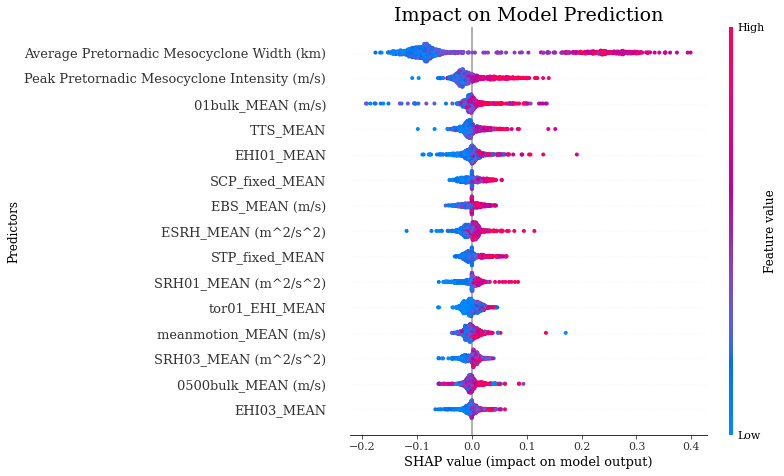

In [51]:
#all predictors
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=names, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

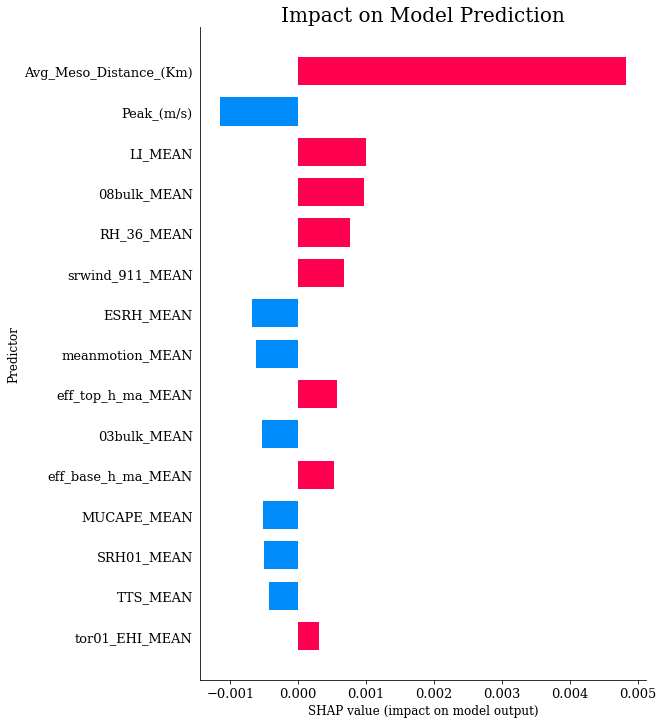

In [26]:
#all predictors
name='radar_lob_no_abs'
bar_legacy(lob_no_abs, no_scale, predictor_cols, 15)
#pl.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/all_lob_abs')

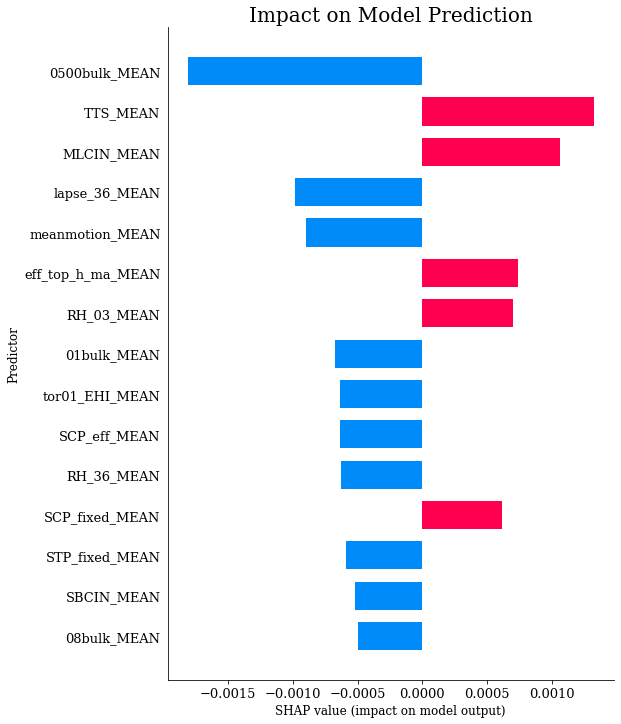

In [19]:
#all predictors
bar_legacy(lob_no_abs, no_scale, predictor_cols, 15)

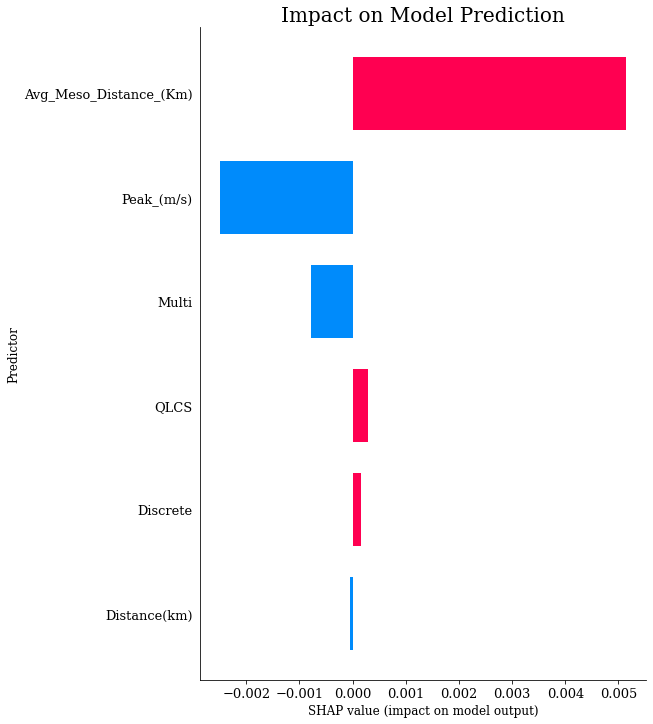

In [26]:
#all predictors
bar_legacy(lob_no_abs, no_scale, predictor_cols, 15)

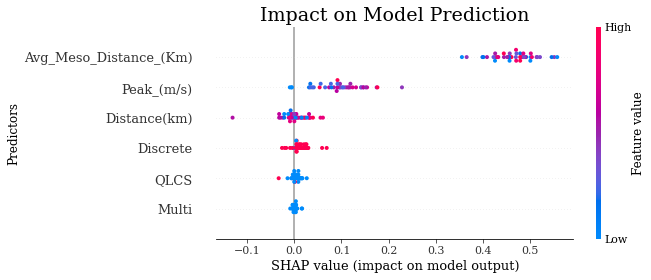

In [126]:
#Violent Cases
shap.summary_plot(shap_values=vio_shap[:,:,1], features=vio_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_vio_shap', bbox_inches='tight')

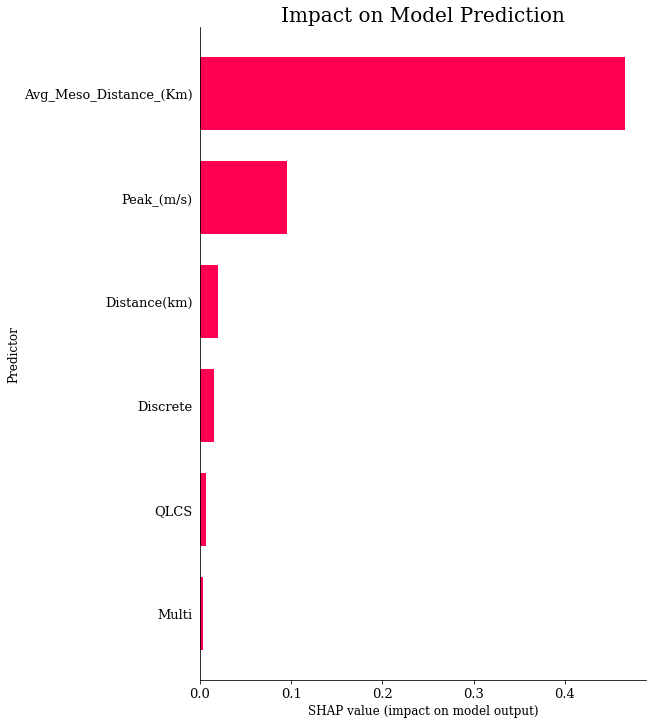

In [127]:
#Violent cases
name='radar_vio_abs'
bar_legacy(vio_lob, vio_no_scale, predictor_cols, 15)

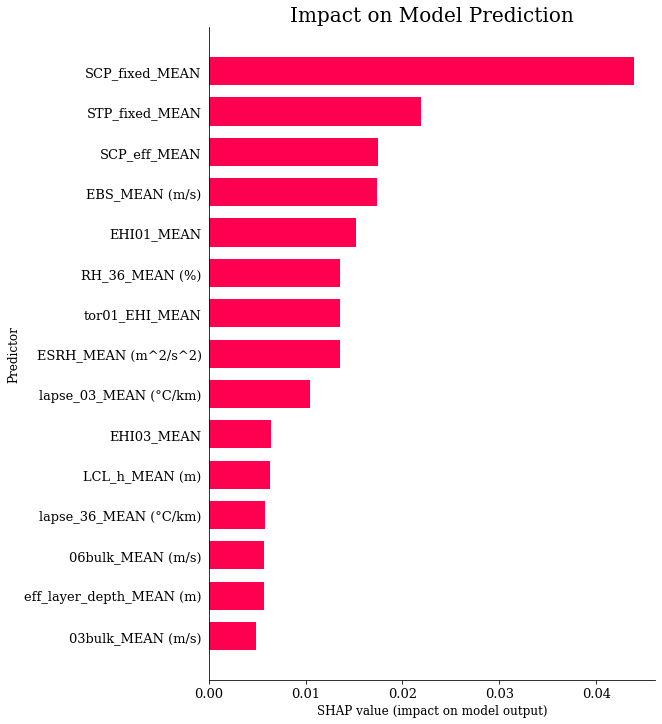

In [76]:
#Violent cases, no abs
name='radar_vio_no_abs'
bar_legacy(vio_lob_no_abs, vio_no_scale, names, 15)

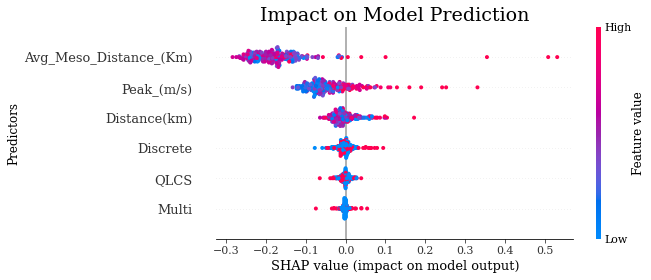

In [129]:
#EF0 cases
shap.summary_plot(shap_values=EF0_shap[:,:,1], features=EF0_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_EF0_shap', bbox_inches='tight')

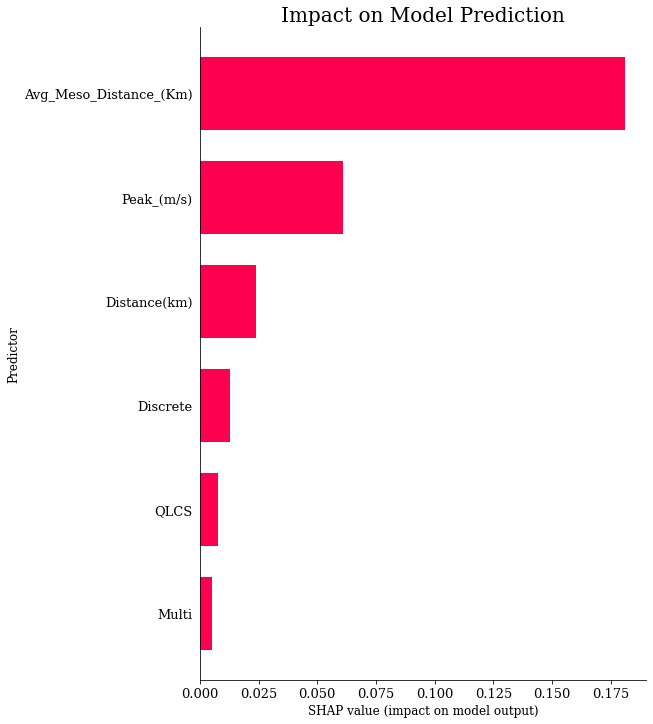

In [130]:
#EF0 cases
name='radar_EF0_abs'
bar_legacy(EF0_lob, EF0_no_scale, predictor_cols, 15)

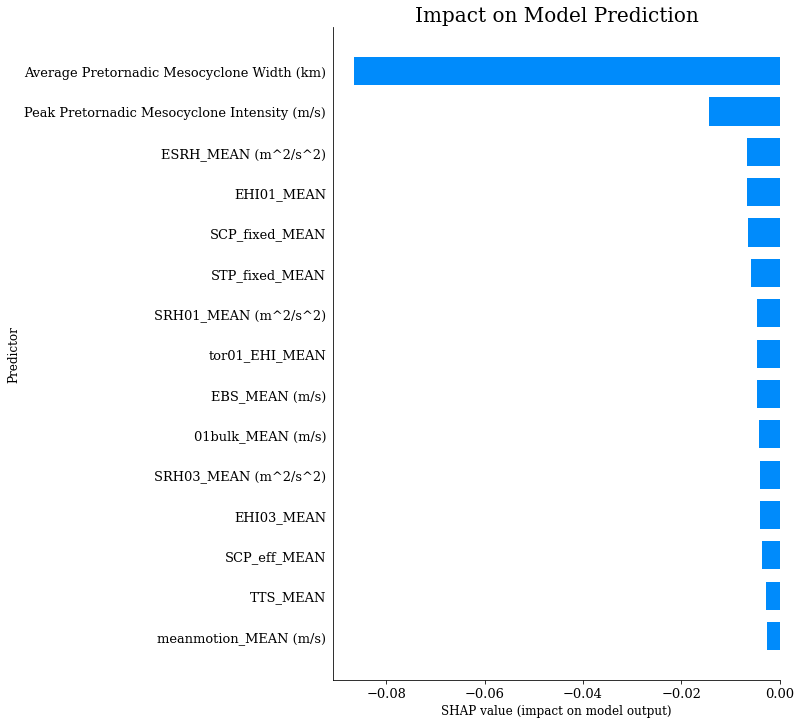

In [59]:
#EF0 cases, no abs
name='radar_EF0_no_abs'
bar_legacy(EF0_lob_no_abs, EF0_no_scale, names, 15)

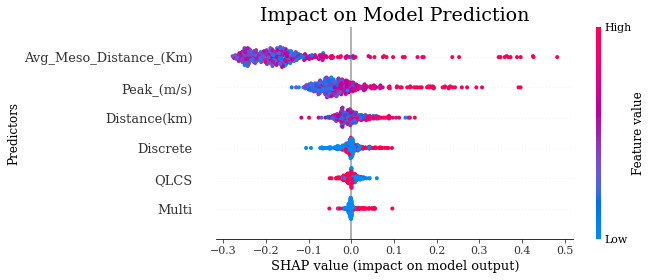

In [132]:
#EF1 cases
shap.summary_plot(shap_values=EF1_shap[:,:,1], features=EF1_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_EF1_shap', bbox_inches='tight')

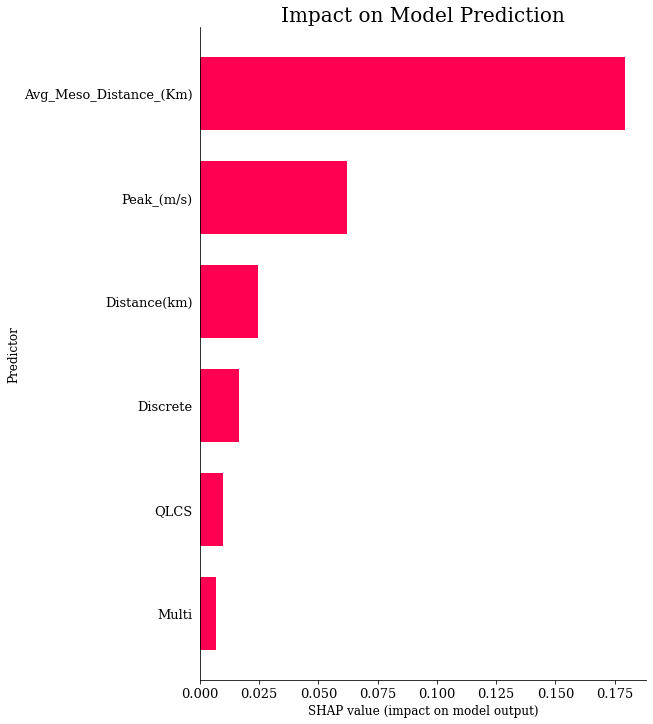

In [133]:
#EF1 cases
name='radar_EF1_abs'
bar_legacy(EF1_lob, EF1_no_scale, predictor_cols, 15)

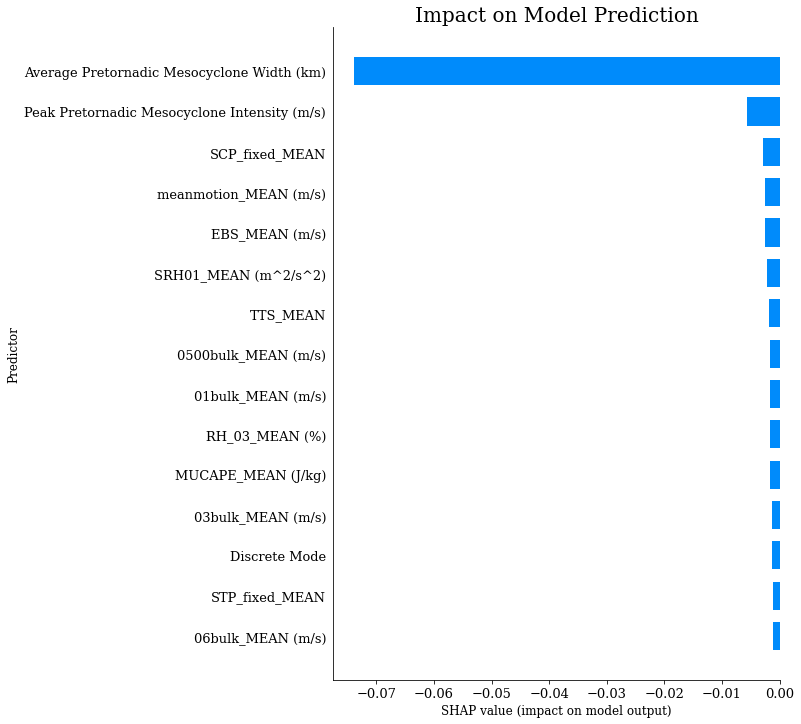

In [60]:
#EF1 cases, no abs
name='radar_EF1_no_abs'
bar_legacy(EF1_lob_no_abs, EF1_no_scale, names, 15)

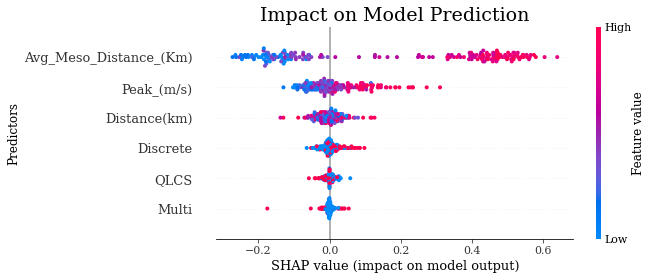

In [135]:
#EF2 cases
shap.summary_plot(shap_values=EF2_shap[:,:,1], features=EF2_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_EF2_shap', bbox_inches='tight')

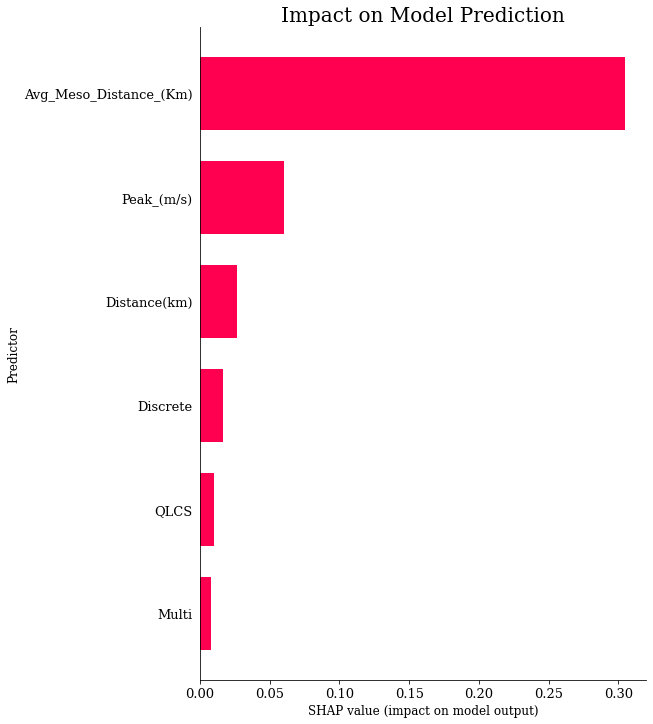

In [136]:
#EF2 cases
name='radar_EF2_abs'
bar_legacy(EF2_lob, EF2_no_scale, predictor_cols, 15)

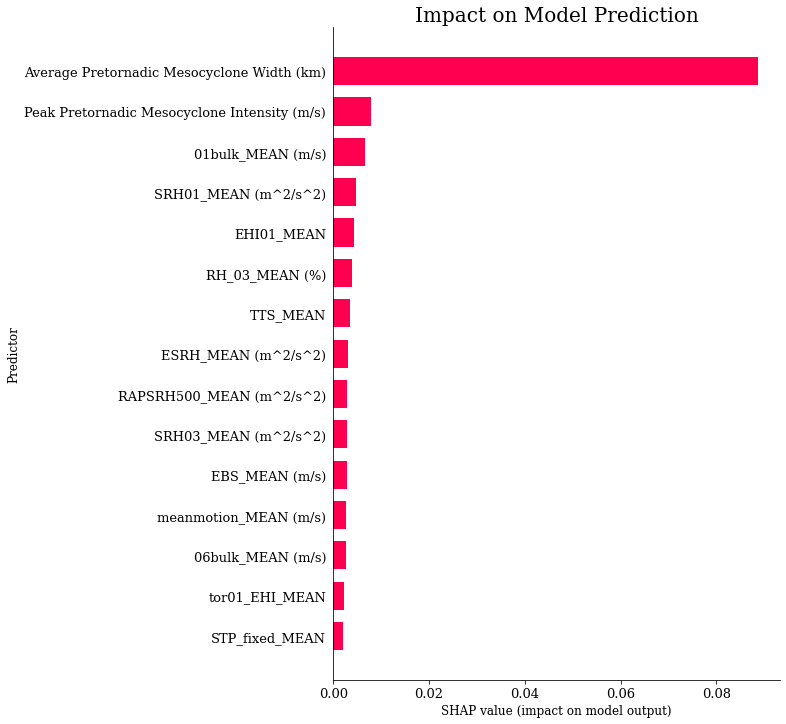

In [61]:
#EF2 cases, no abs
name='radar_EF2_no_abs'
bar_legacy(EF2_lob_no_abs, EF2_no_scale, names, 15)

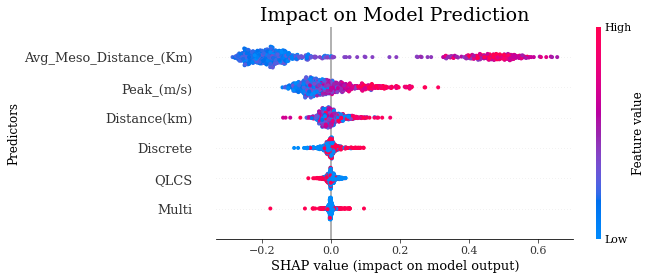

In [138]:
#correct cases
shap.summary_plot(shap_values=cor_shap[:,:,1], features=cor_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_cor_shap', bbox_inches='tight')

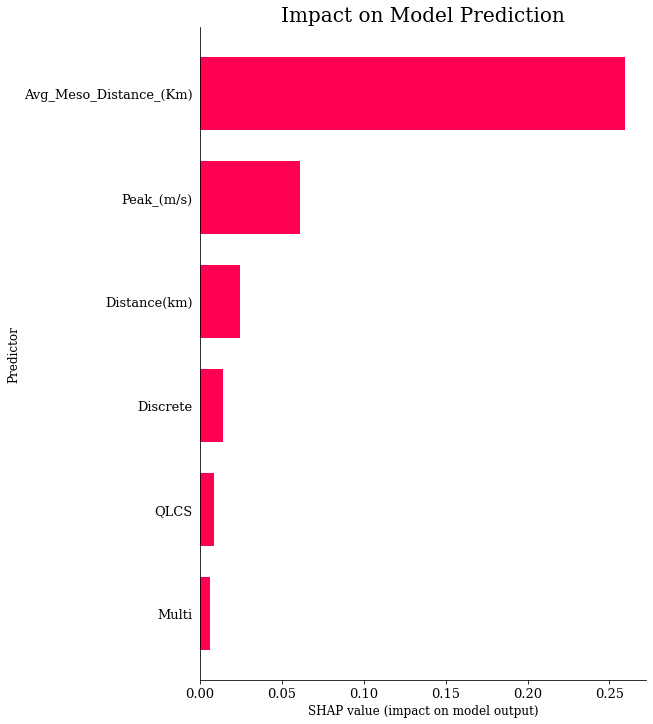

In [139]:
#correct cases
name='radar_cor_abs'
bar_legacy(cor_lob, cor_no_scale, predictor_cols, 15)

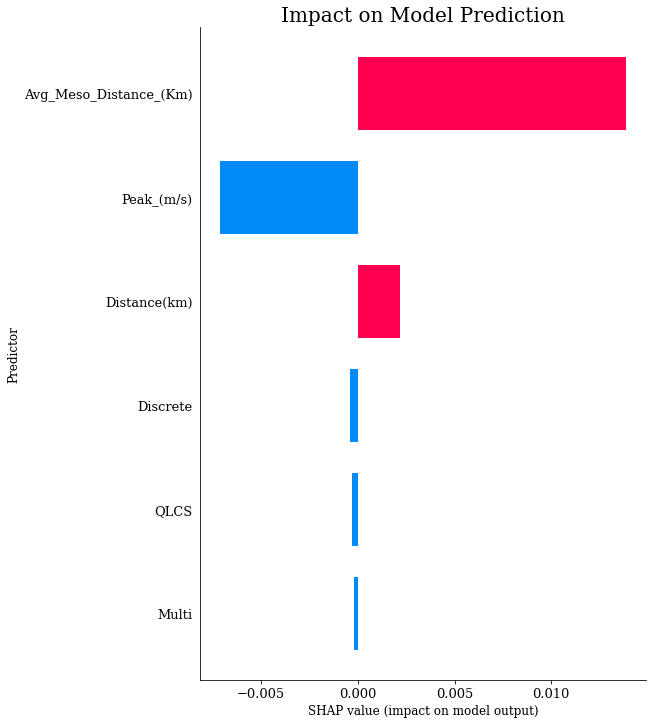

In [140]:
#correct cases, no abs
name='radar_cor_no_abs'
bar_legacy(cor_lob_no_abs, cor_no_scale, predictor_cols, 15)

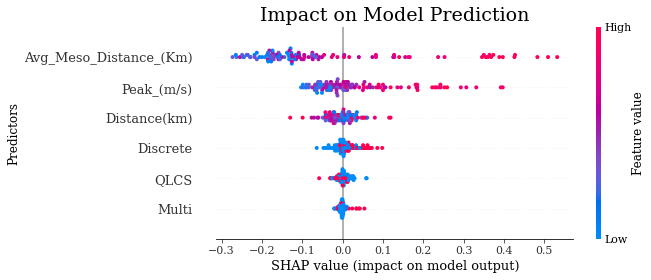

In [141]:
#incorrect cases
shap.summary_plot(shap_values=incor_shap[:,:,1], features=incor_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_incor_shap', bbox_inches='tight')

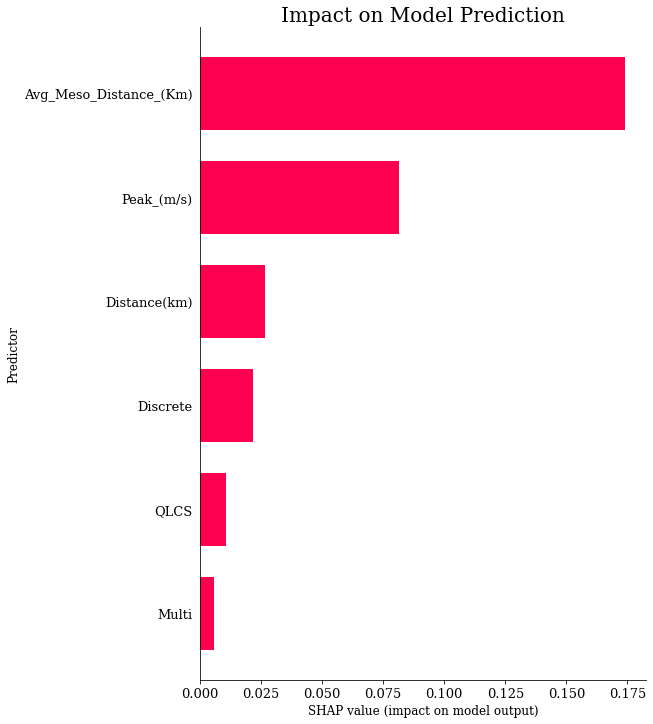

In [142]:
#incorrect cases
name='radar_incor_abs'
bar_legacy(incor_lob, incor_no_scale, predictor_cols, 15)

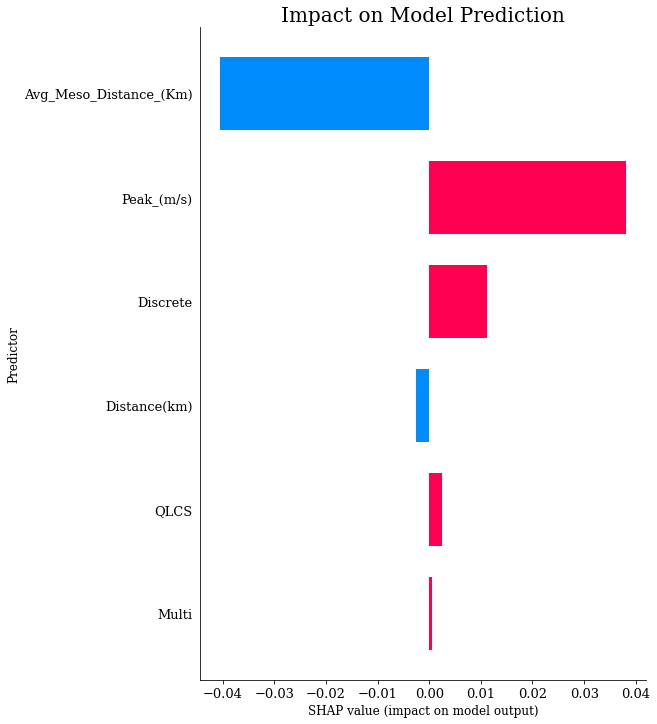

In [143]:
#incorrect cases, no abs
name='radar_incor_no_abs'
bar_legacy(incor_lob_no_abs, incor_no_scale, predictor_cols, 15)

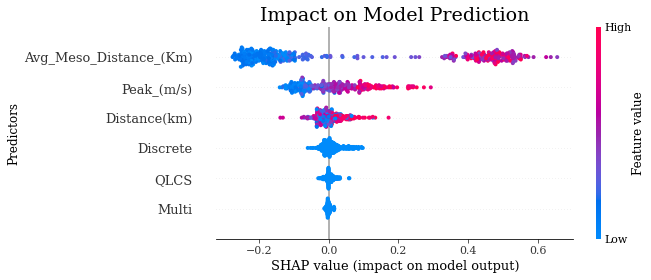

In [144]:
#DSC cases
shap.summary_plot(shap_values=dsc_shap[:,:,1], features=dsc_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_dsc_shap', bbox_inches='tight')

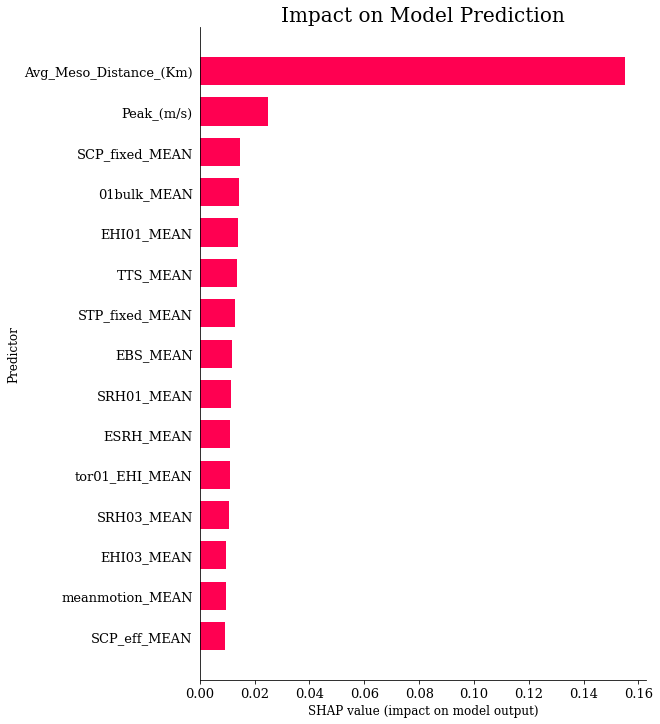

In [52]:
#DSC cases
name='radar_dsc_abs'
bar_legacy(dsc_lob, dsc_no_scale, predictor_cols, 15)

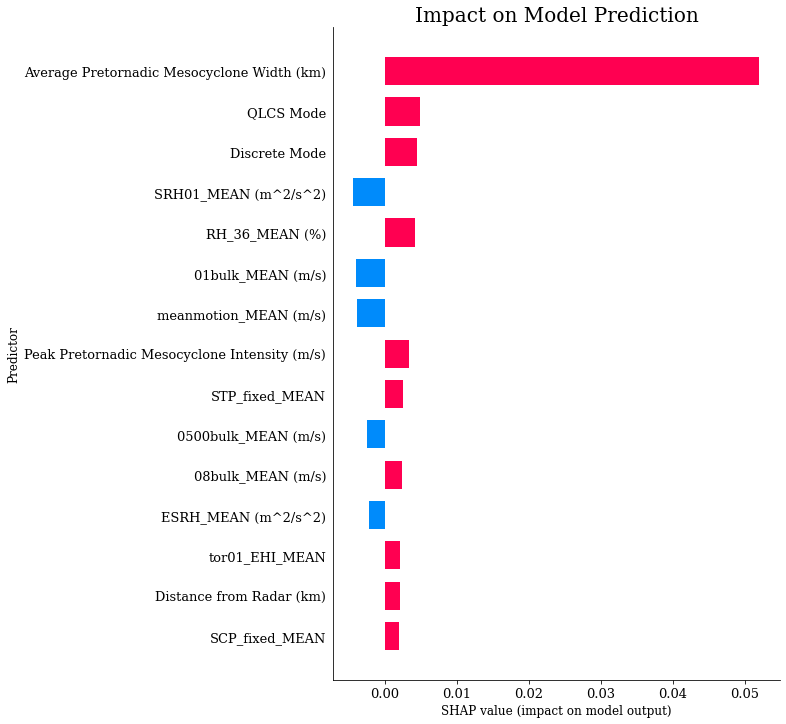

In [54]:
#DSC cases, no abs
name='radar_dsc_no_abs'
bar_legacy(dsc_lob_no_abs, dsc_no_scale, names, 15)

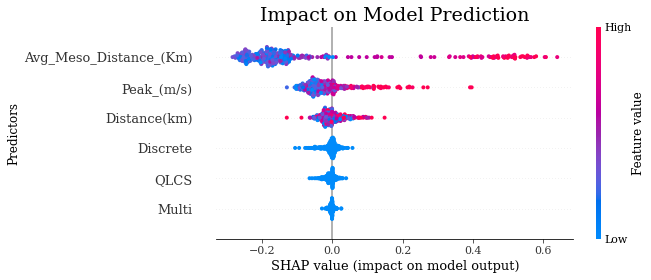

In [147]:
#QLCS cases
shap.summary_plot(shap_values=qlcs_shap[:,:,1], features=qlcs_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_qlcs_shap', bbox_inches='tight')

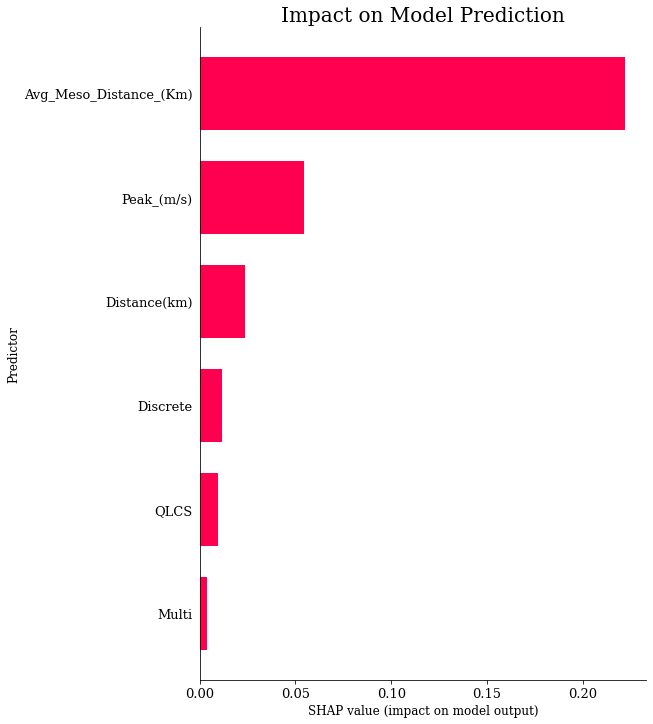

In [148]:
#QLCS cases
name='radar_qlcs_abs'
bar_legacy(qlcs_lob, qlcs_no_scale, predictor_cols, 15)

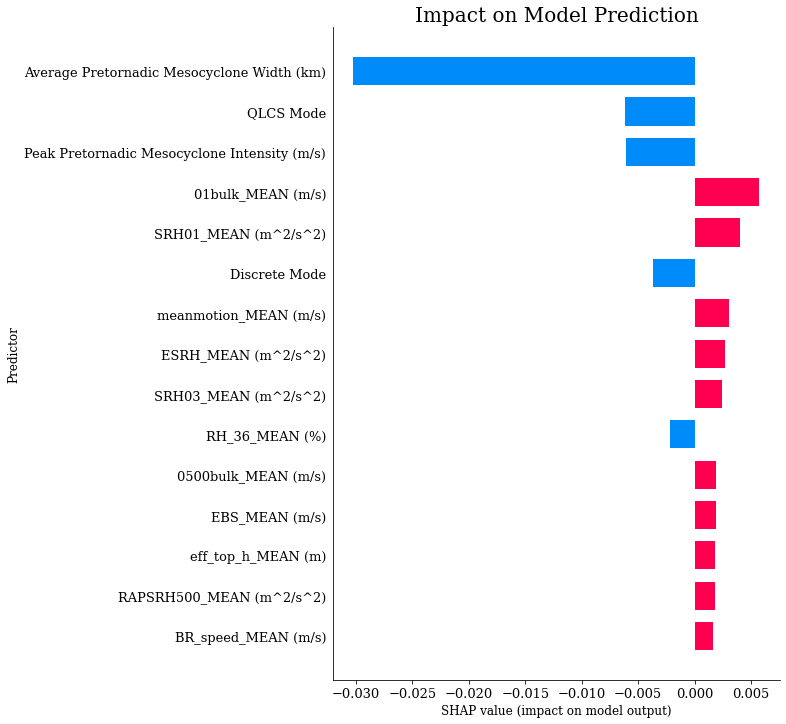

In [57]:
#QLCS cases, no abs
name='radar_qlcs_no_abs'
bar_legacy(qlcs_lob_no_abs, qlcs_no_scale, names, 15)

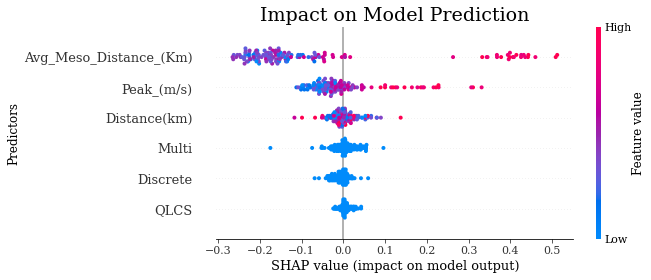

In [150]:
#MUL cases
shap.summary_plot(shap_values=mul_shap[:,:,1], features=mul_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_mul_shap', bbox_inches='tight')

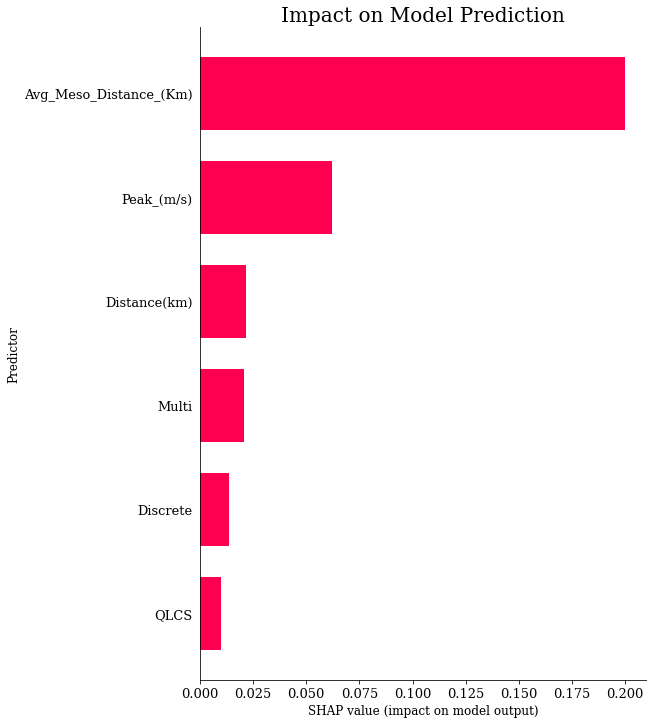

In [151]:
#MUL cases
name='radar_mul_abs'
bar_legacy(mul_lob, mul_no_scale, predictor_cols, 15)

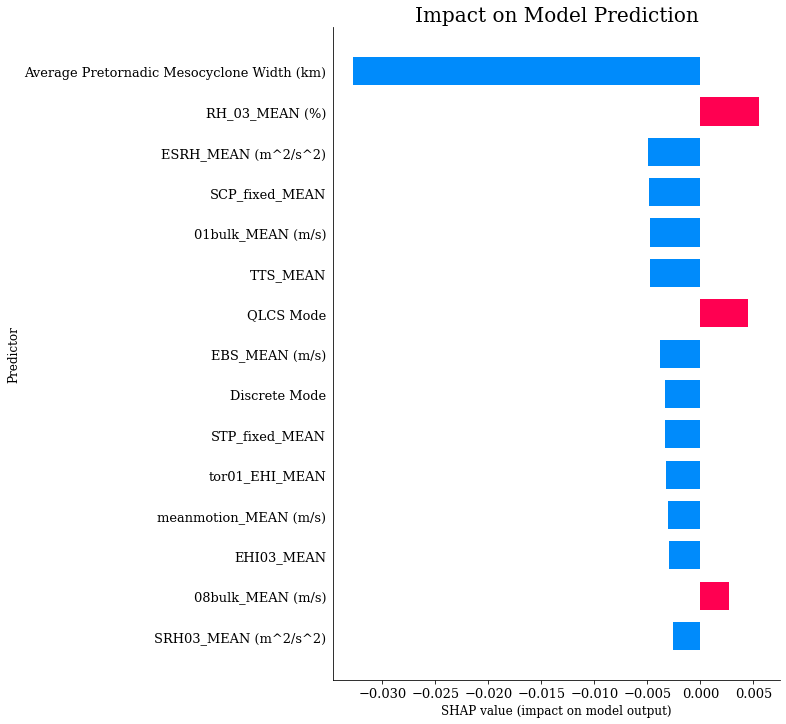

In [58]:
#MUL cases, no abs
name='radar_mul_no_abs'
bar_legacy(mul_lob_no_abs, mul_no_scale, names, 15)

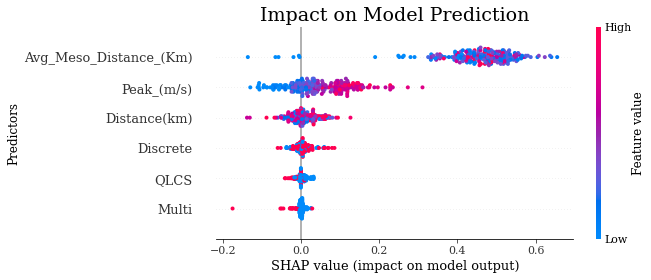

In [153]:
#TP cases
shap.summary_plot(shap_values=TP_shap[:,:,1], features=TP_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_TP_shap', bbox_inches='tight')

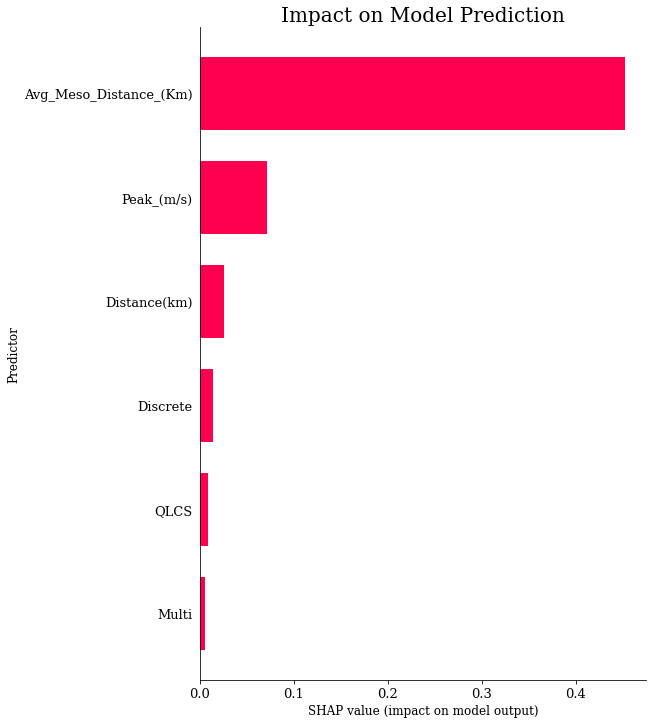

In [154]:
#TP cases
name='radar_TP_abs'
bar_legacy(TP_lob, TP_no_scale, predictor_cols, 15)

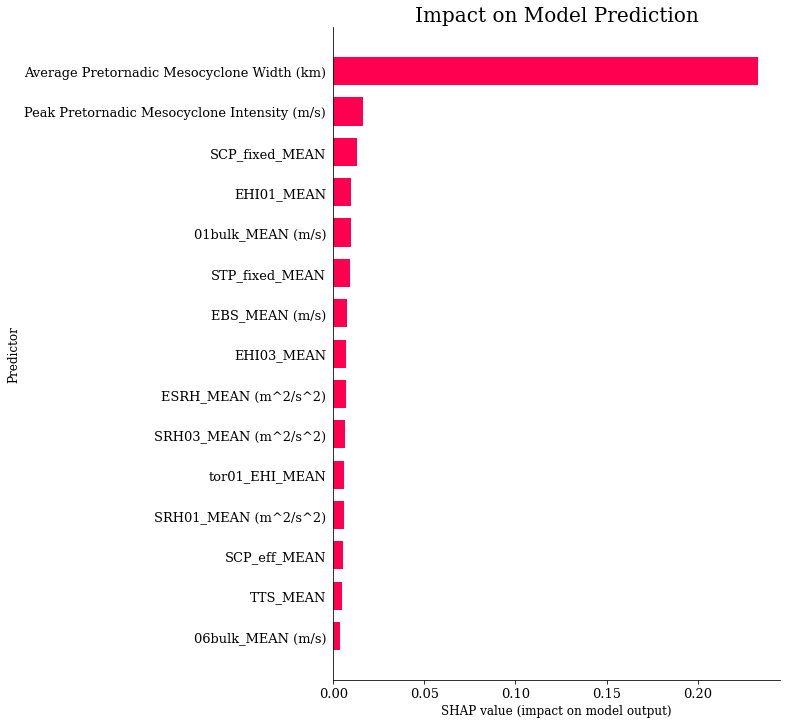

In [63]:
#TP cases, no abs
name='radar_TP_no_abs'
bar_legacy(TP_lob_no_abs, TP_no_scale, names, 15)

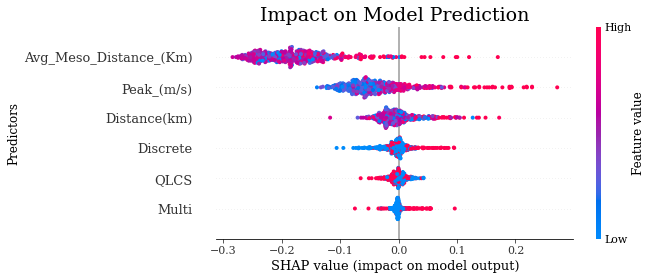

In [156]:
#TN cases
shap.summary_plot(shap_values=TN_shap[:,:,1], features=TN_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_TN_shap', bbox_inches='tight')

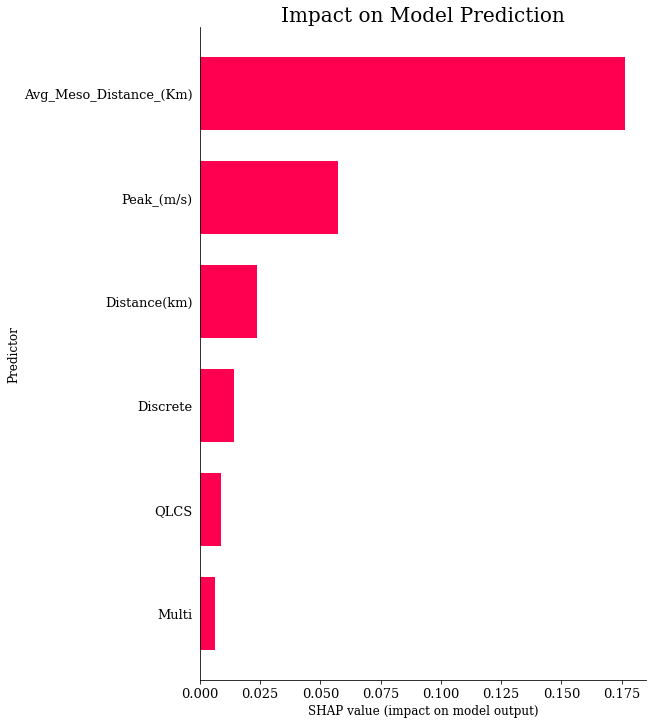

In [157]:
#TN cases
name='radar_TN_abs'
bar_legacy(TN_lob, TN_no_scale, predictor_cols, 15)

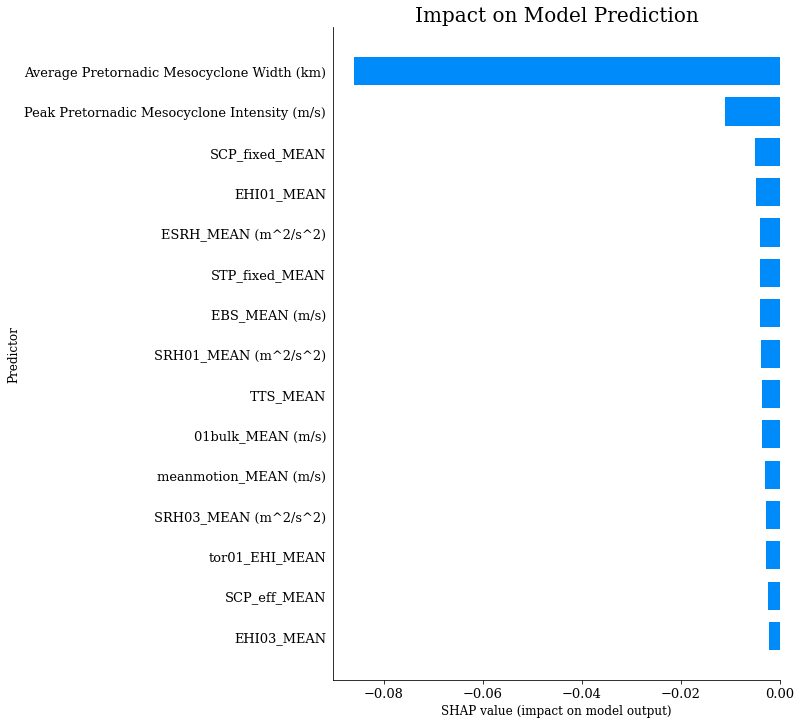

In [64]:
#TN cases, no abs
name='radar_TN_no_abs'
bar_legacy(TN_lob_no_abs, TN_no_scale, names, 15)

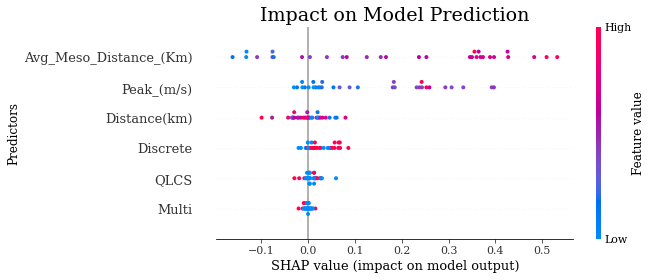

In [159]:
#FP cases
shap.summary_plot(shap_values=FP_shap[:,:,1], features=FP_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_FP_shap', bbox_inches='tight')

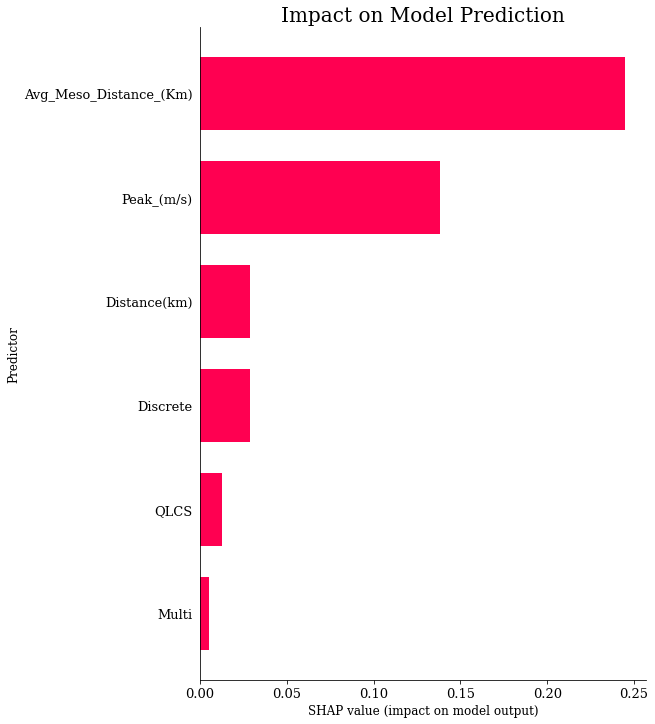

In [160]:
#FP cases
name='radar_FP_abs'
bar_legacy(FP_lob, FP_no_scale, predictor_cols, 15)

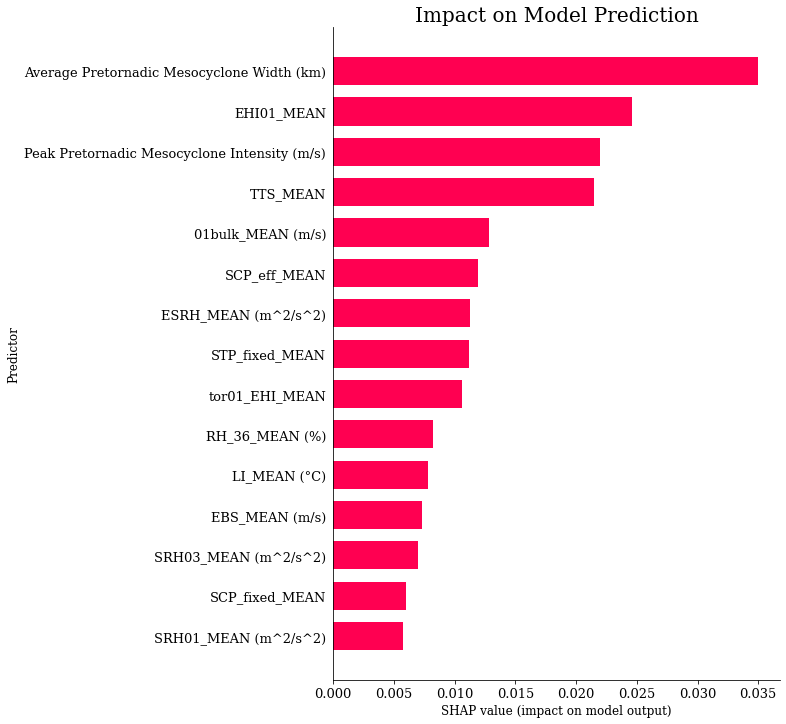

In [65]:
#FP cases, no abs
name='radar_FP_no_abs'
bar_legacy(FP_lob_no_abs, FP_no_scale, names, 15)

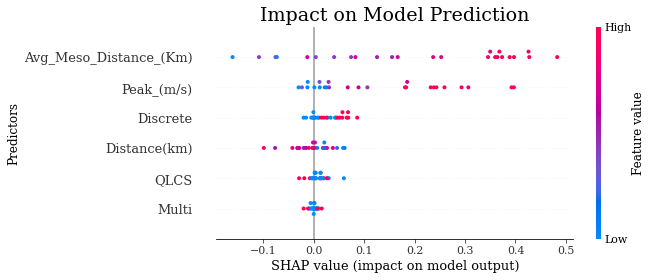

In [162]:
#FP cases, EF1
shap.summary_plot(shap_values=FP_EF1_shap[:,:,1], features=FP_EF1_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_FP_EF1_shap', bbox_inches='tight')

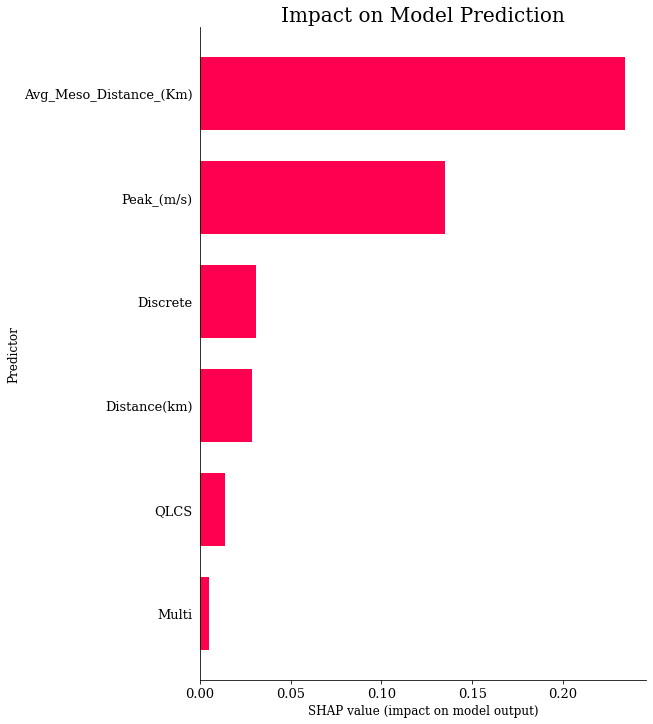

In [163]:
#FP cases, EF1
name='radar_FP_EF1_abs'
bar_legacy(FP_EF1_lob, FP_EF1_no_scale, predictor_cols, 15)

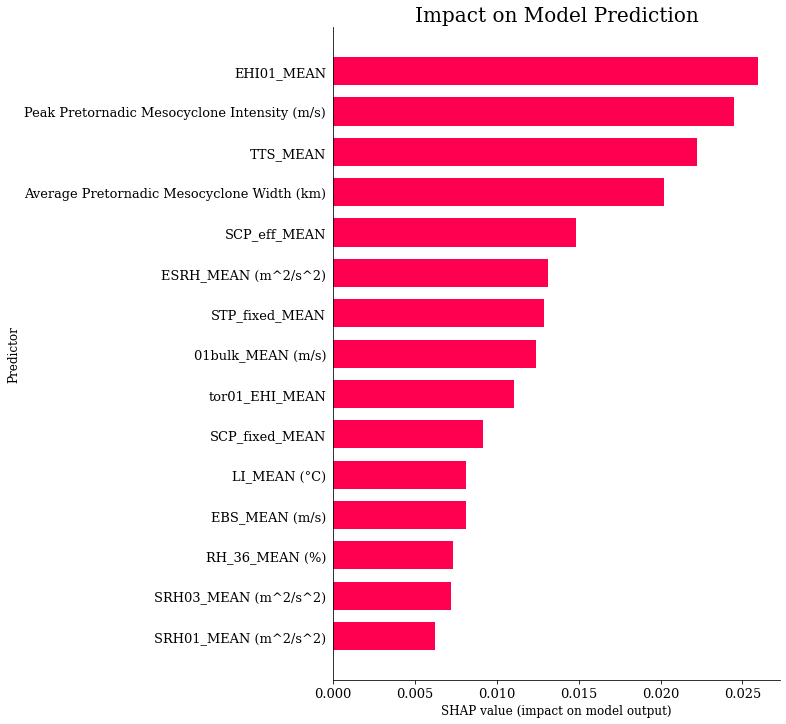

In [66]:
#FP cases, no abs, EF1
name='radar_FP_EF1_no_abs'
bar_legacy(FP_EF1_lob_no_abs, FP_EF1_no_scale, names, 15)

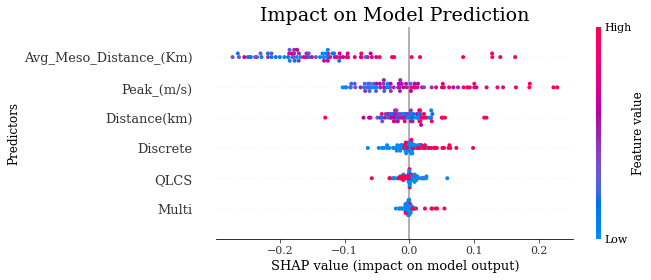

In [165]:
#FN cases
shap.summary_plot(shap_values=FN_shap[:,:,1], features=FN_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_FN_shap', bbox_inches='tight')

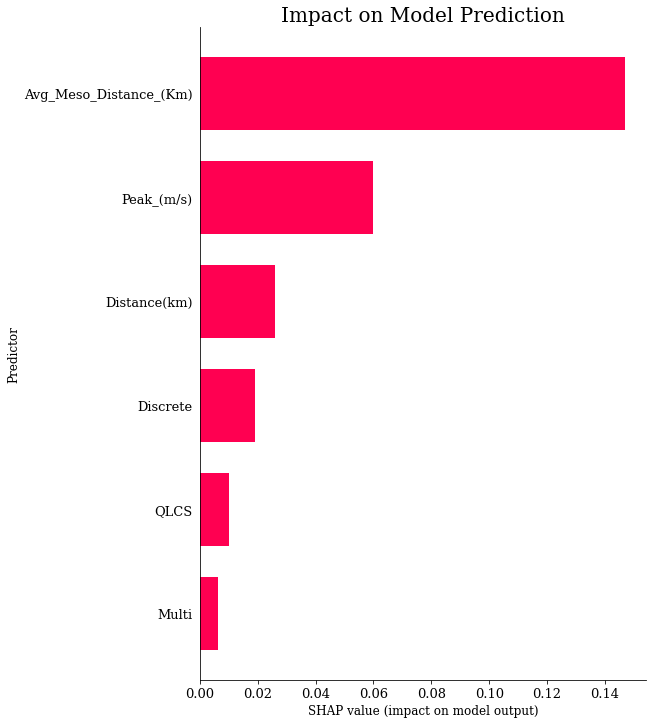

In [166]:
#FN cases
name='radar_FN_abs'
bar_legacy(FN_lob, FN_no_scale, predictor_cols, 15)

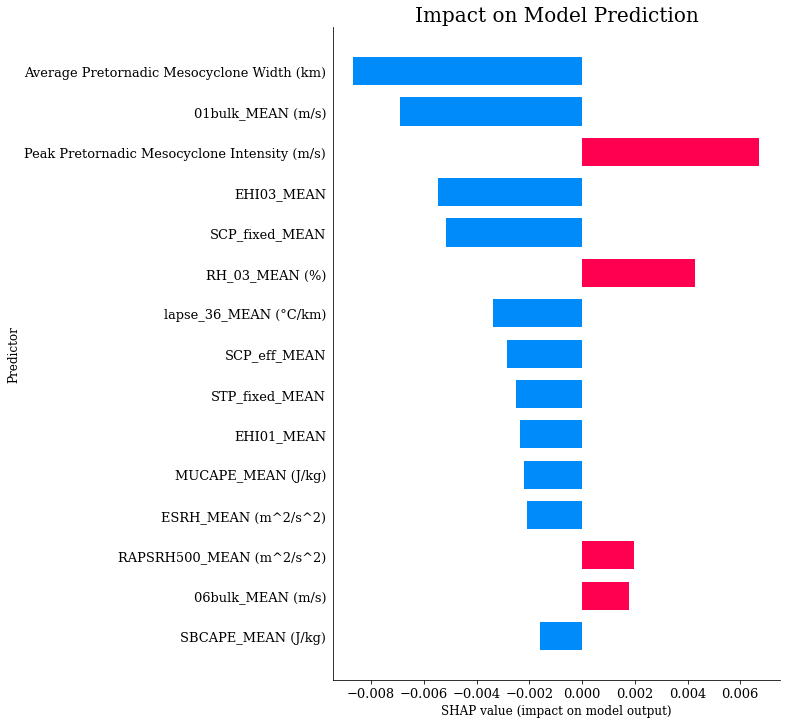

In [67]:
#FN cases, no abs
name='radar_FN_no_abs'
bar_legacy(FN_lob_no_abs, FN_no_scale, names, 15)

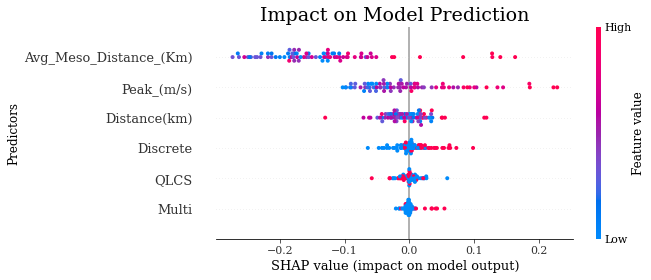

In [168]:
#FN cases, EF2
shap.summary_plot(shap_values=FN_EF2_shap[:,:,1], features=FN_EF2_no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/radar_FN_EF2_shap', bbox_inches='tight')

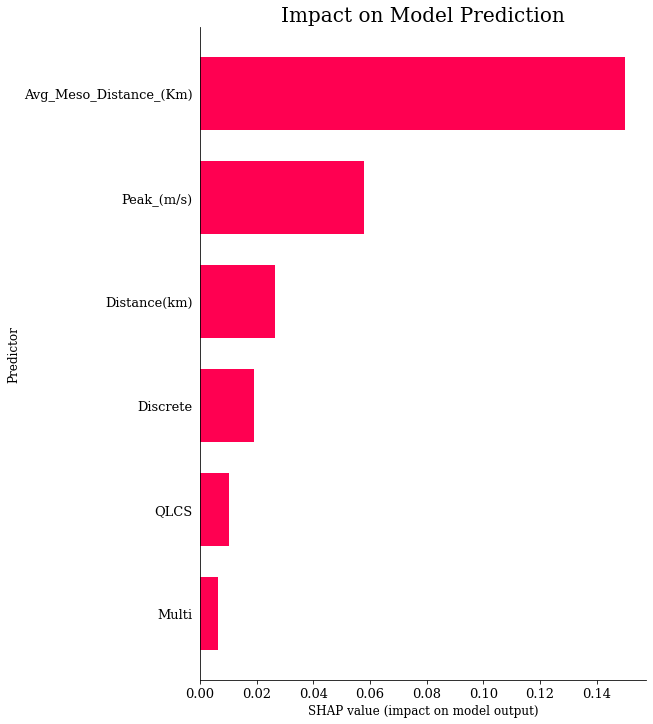

In [169]:
#FN cases, EF2
name='radar_FN_EF2_abs'
bar_legacy(FN_EF2_lob, FN_EF2_no_scale, predictor_cols, 15)

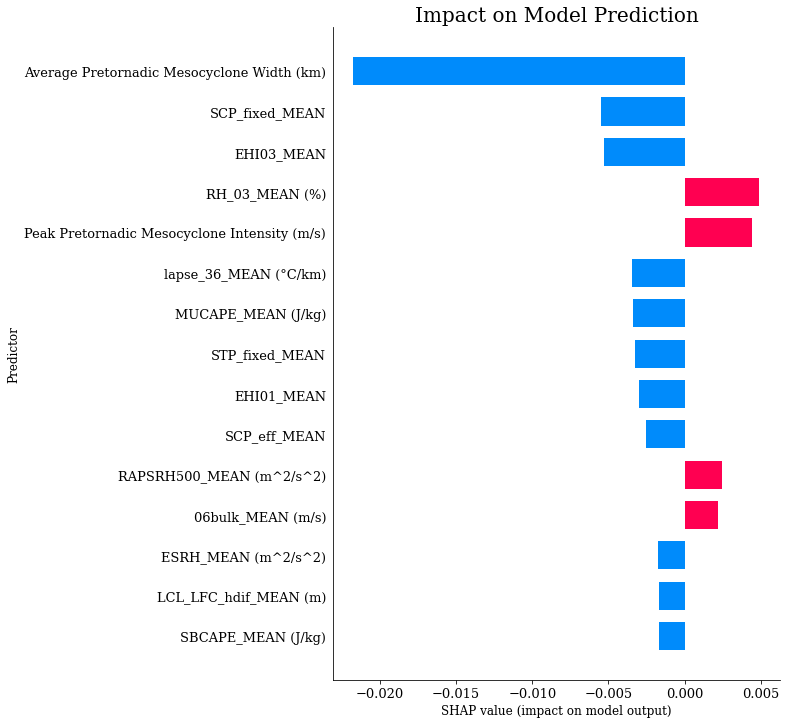

In [68]:
#FN cases, no abs, EF2
name='radar_FN_EF2_no_abs'
bar_legacy(FN_EF2_lob_no_abs, FN_EF2_no_scale, names, 15)

Text(0, 0.5, 'Predictors')

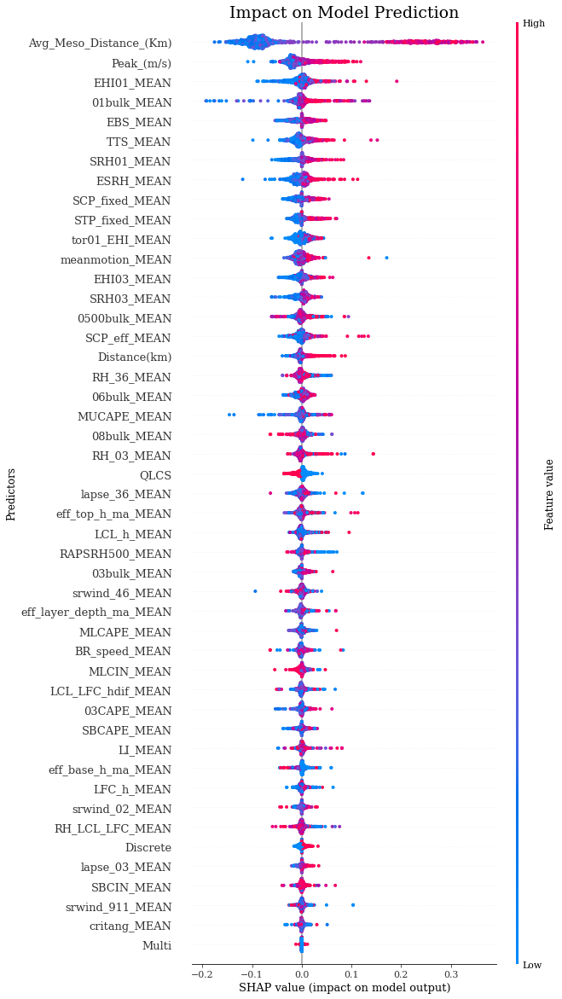

In [12]:
#all predictors
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=55, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

Text(0, 0.5, 'Predictors')

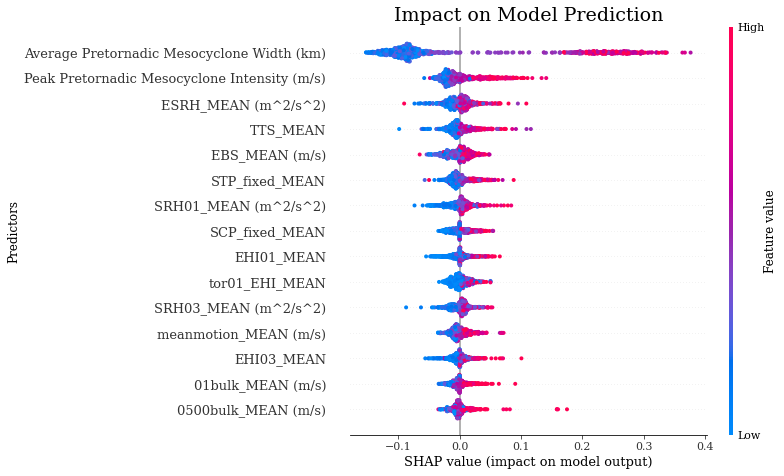

In [27]:
#all predictors
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=names, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

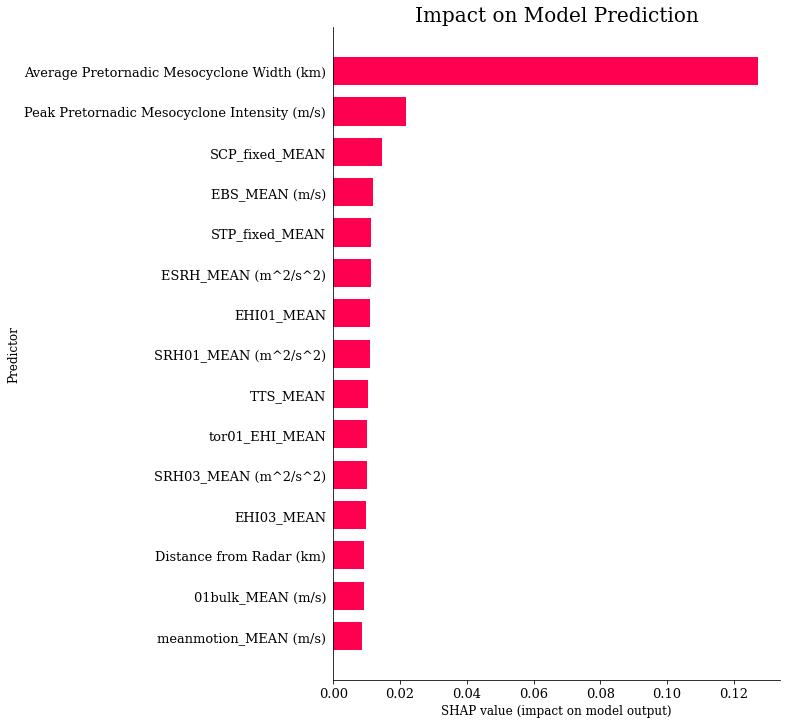

In [13]:
#all predictors
bar_legacy(lob, no_scale, names, 15)

Text(0, 0.5, 'Predictors')

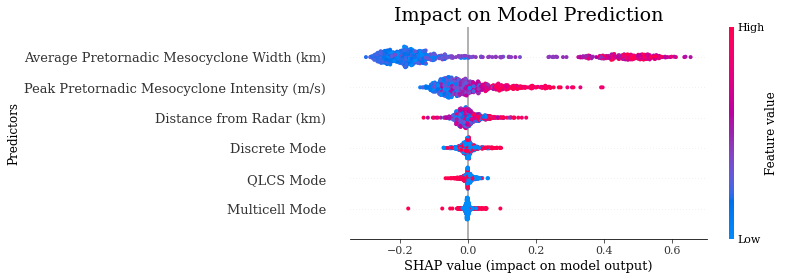

In [34]:
#Radar
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=names, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

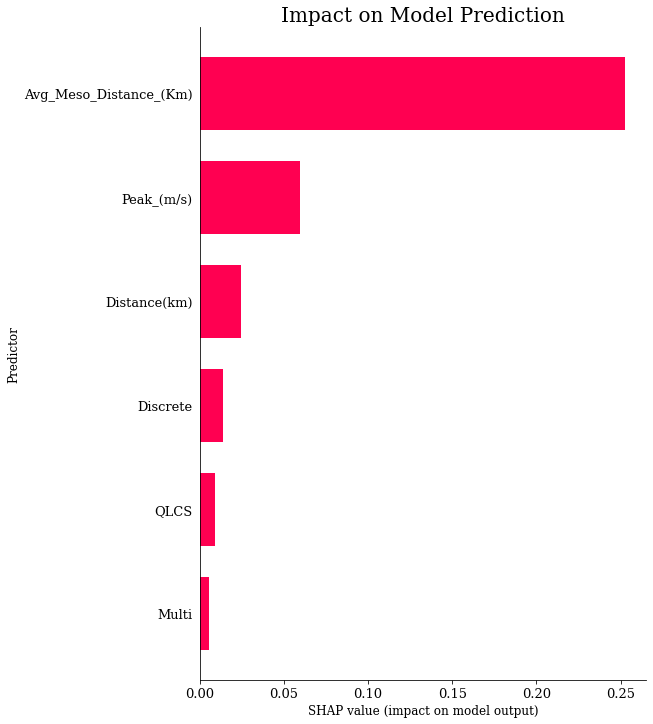

In [21]:
#Radar
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

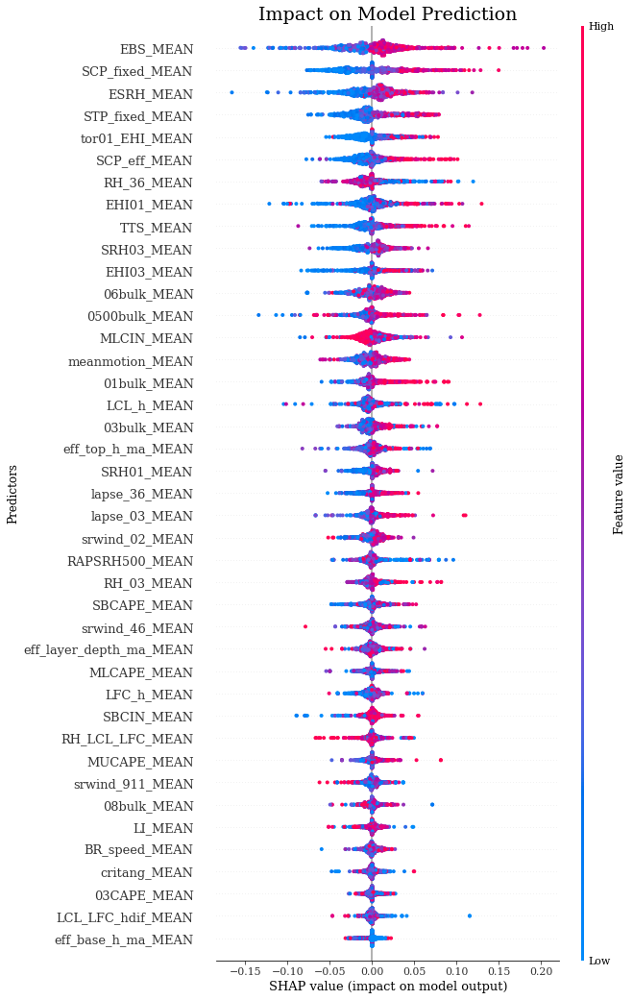

In [18]:
#env
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=55, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

Text(0, 0.5, 'Predictors')

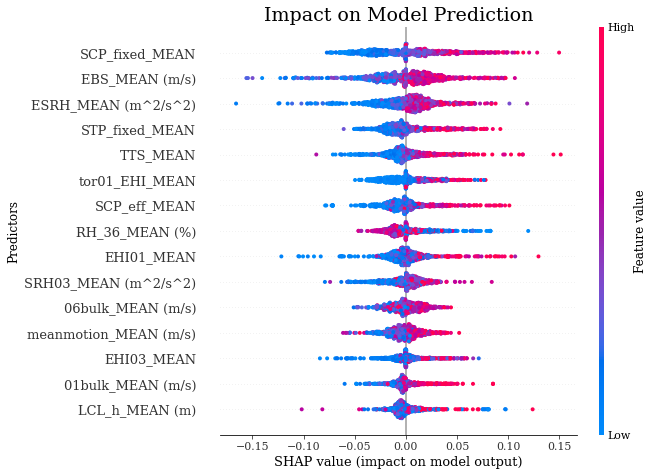

In [77]:
#ENV
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=names, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

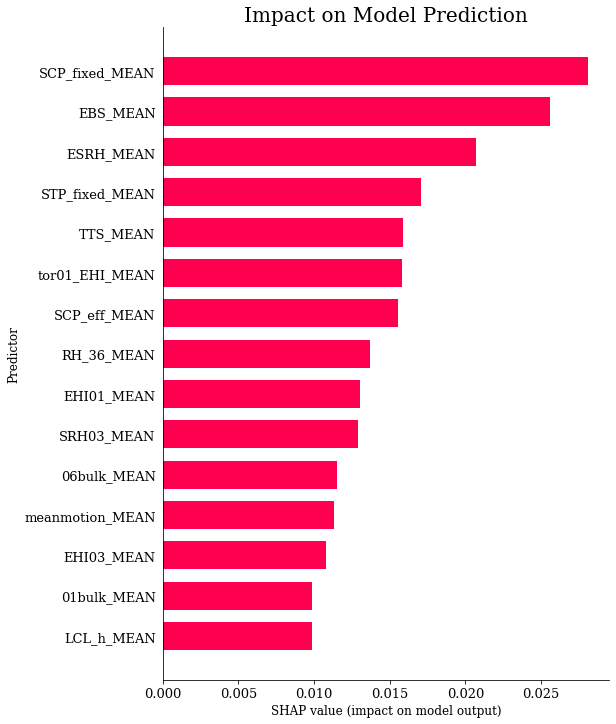

In [78]:
#ENV
bar_legacy(lob, no_scale, predictor_cols, 15)

In [75]:
#Case Study env
bar_legacy(lob, no_scale, predictor_cols, 15)

NameError: name 'bar_legacy' is not defined

Text(0, 0.5, 'Predictors')

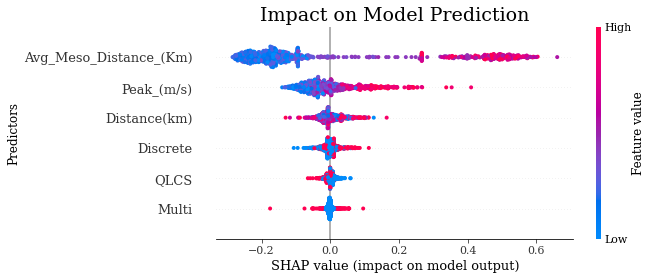

In [18]:
#All radar
#All Env.
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

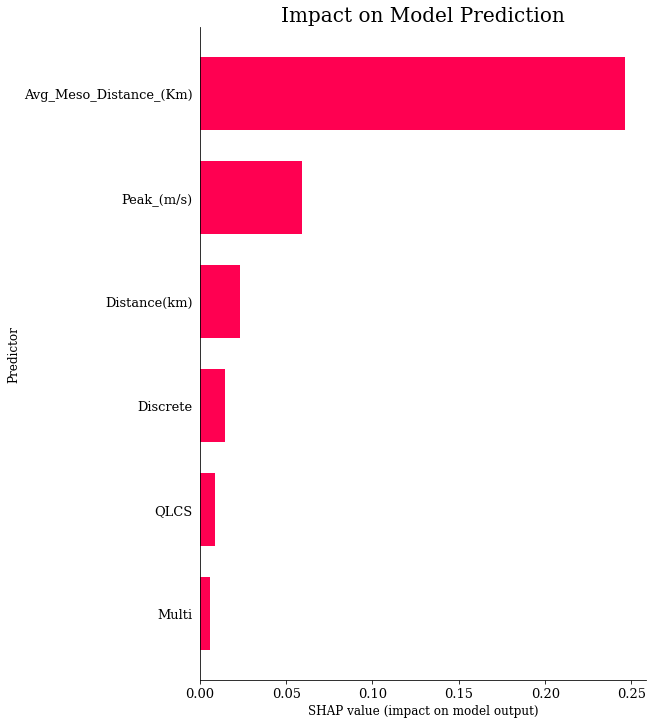

In [19]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

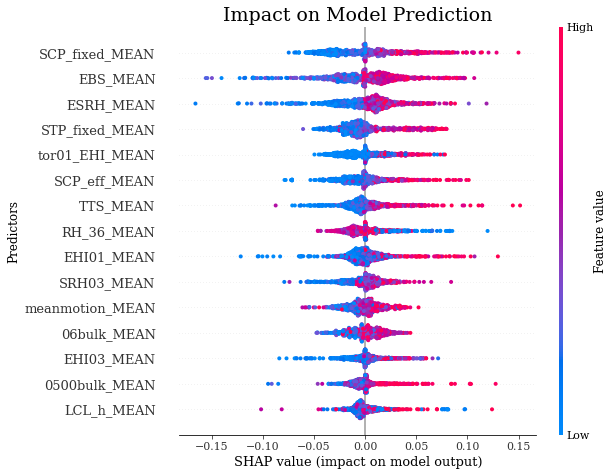

In [9]:
#All Env. 0.703
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

Text(0, 0.5, 'Predictors')

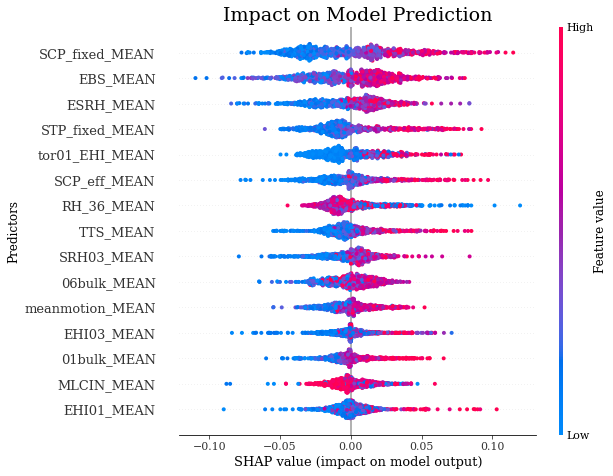

In [39]:
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
#log odds

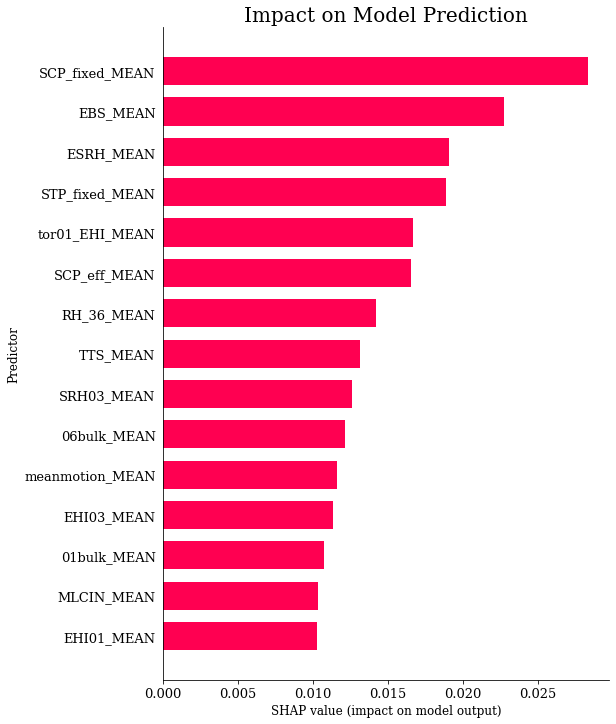

In [40]:
bar_legacy(lob, no_scale, predictor_cols, 15) #log odds

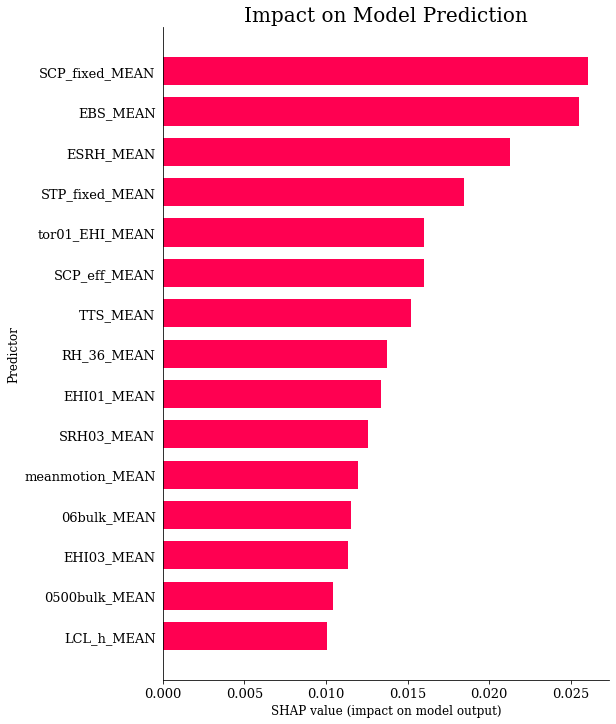

In [14]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

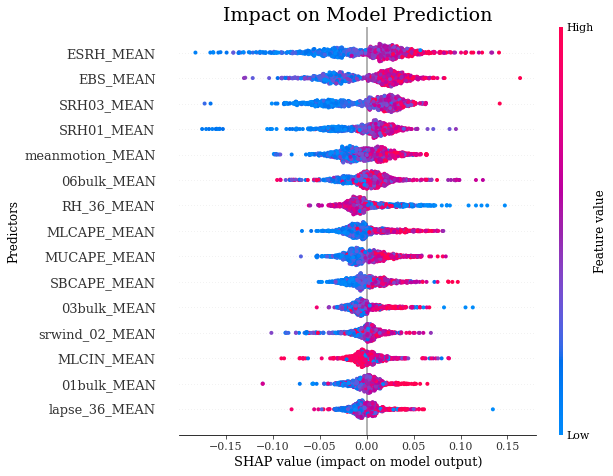

In [19]:
#Env., no comp. 0.693
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

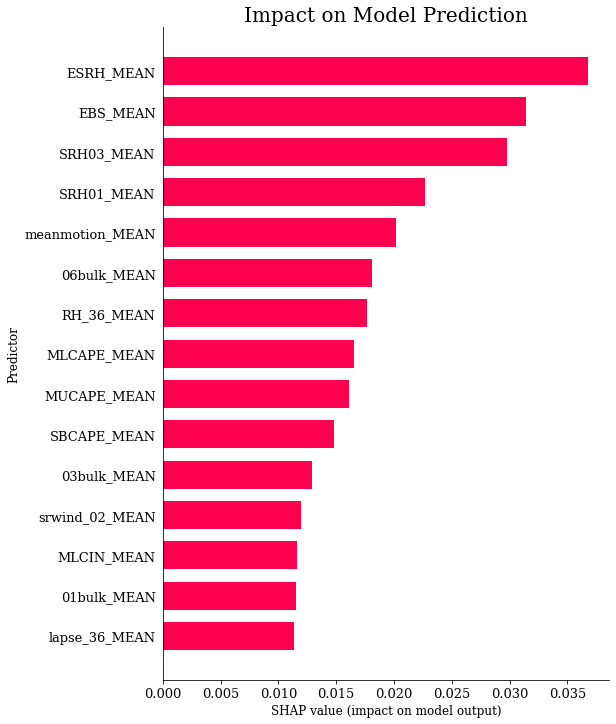

In [20]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

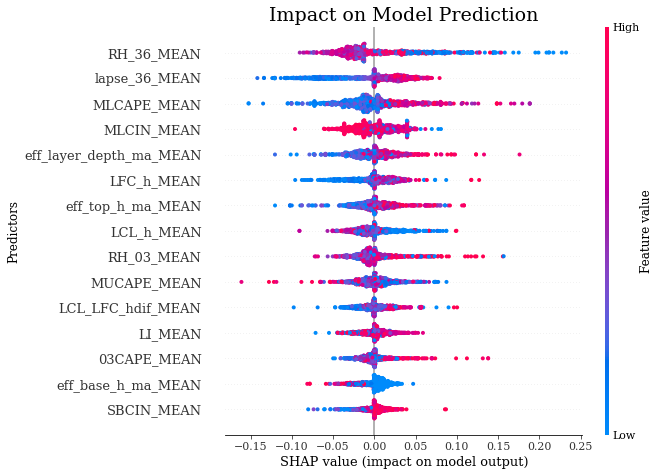

In [25]:
#ENV., just thermo 0.663
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

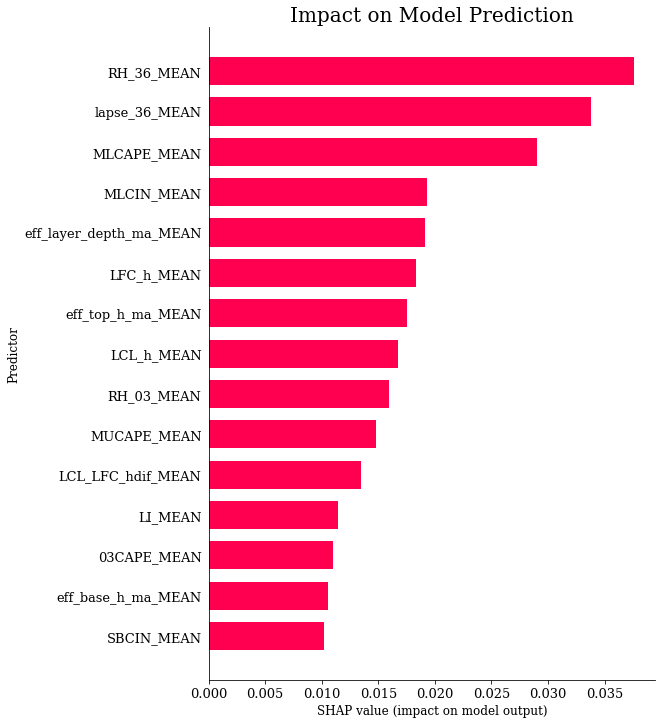

In [26]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

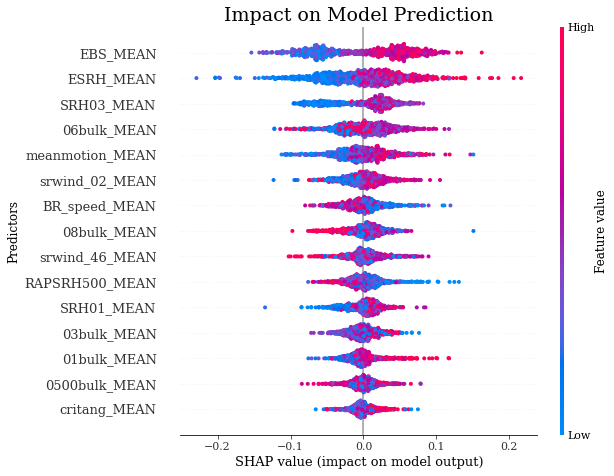

In [31]:
#ENV. just wind 0.677
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

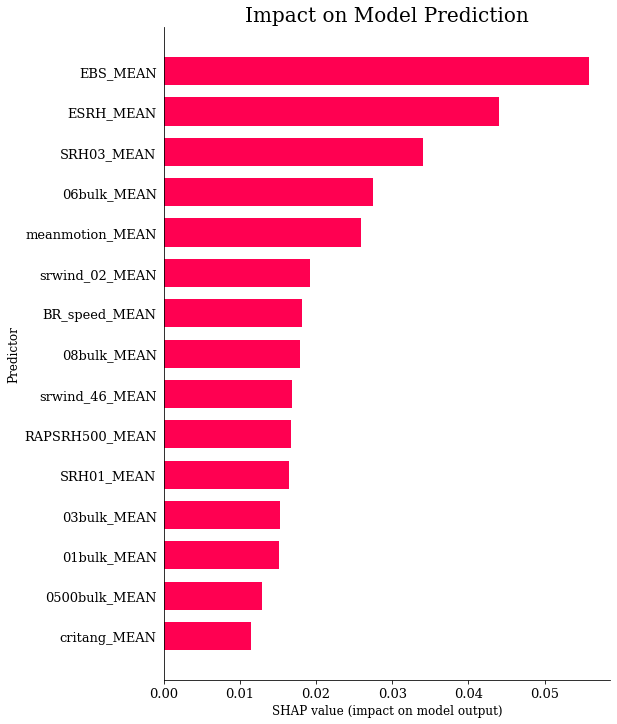

In [32]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

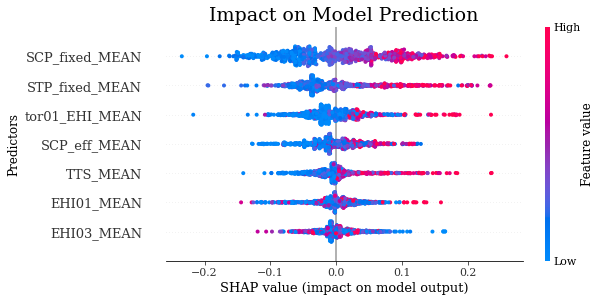

In [37]:
#ENV., just comp. 0.685
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

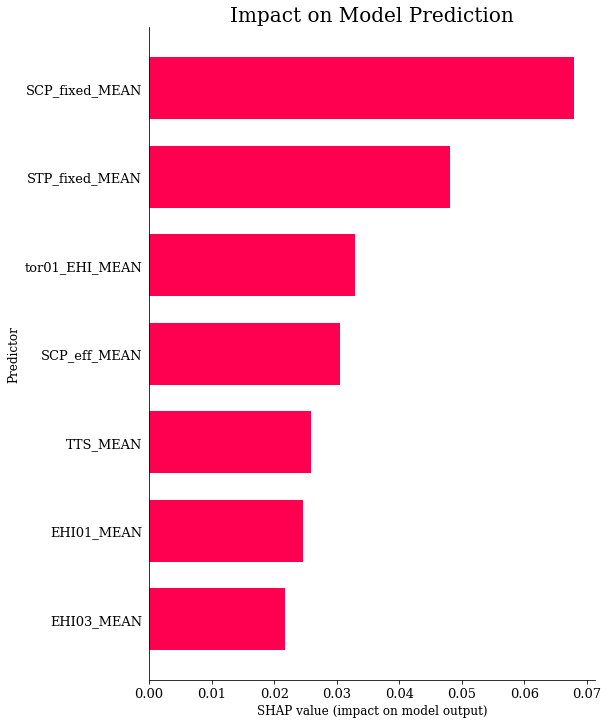

In [38]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

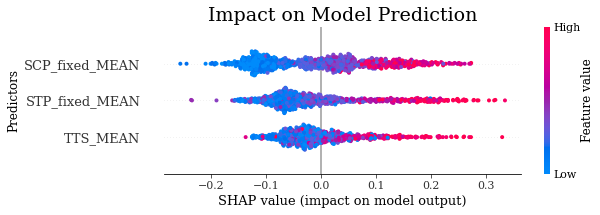

In [48]:
#stp-fixed, scp-fixed, tts, 0.703
#
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

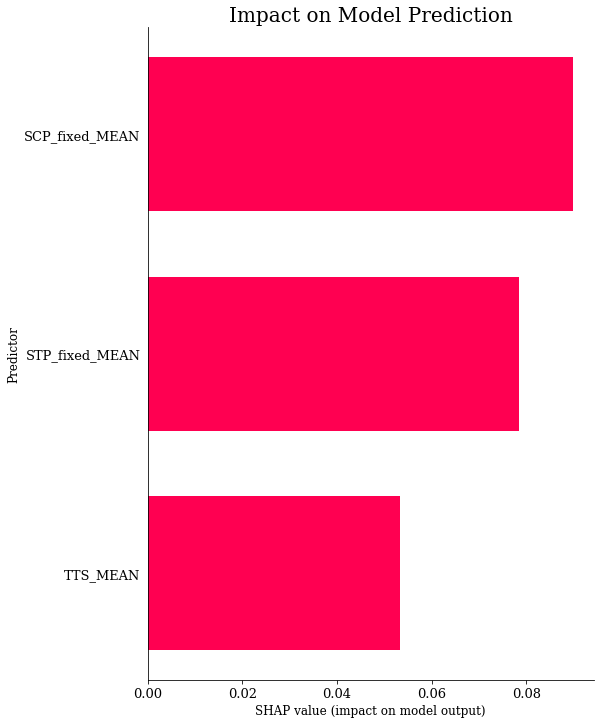

In [49]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

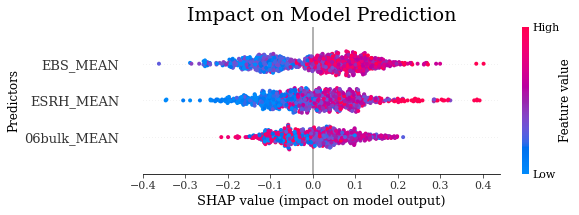

In [62]:
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
#0.6955

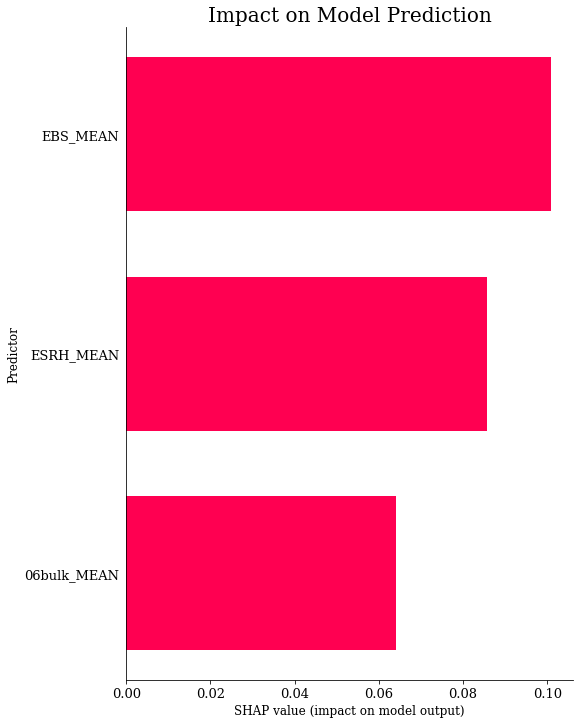

In [63]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

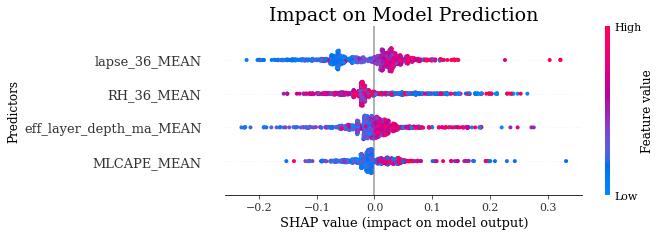

In [38]:
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
#0.665, 0.6588

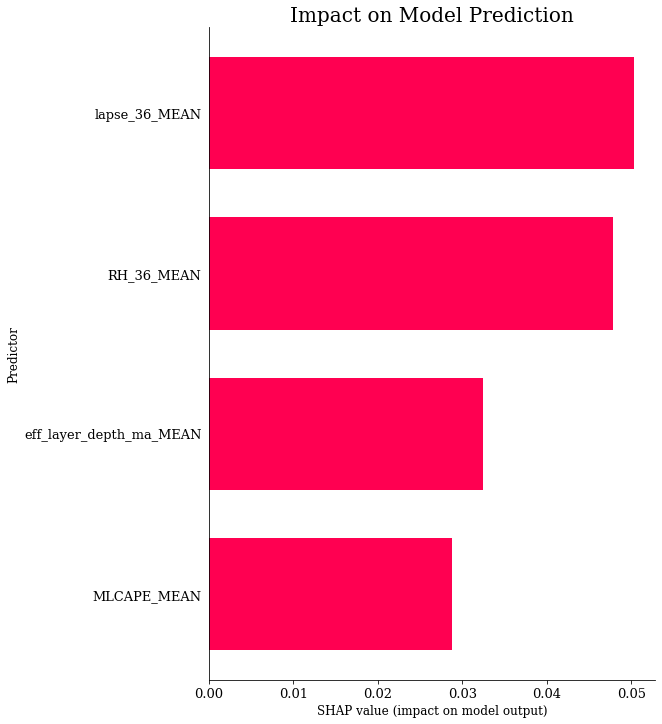

In [39]:
bar_legacy(lob, no_scale, predictor_cols, 15)

Text(0, 0.5, 'Predictors')

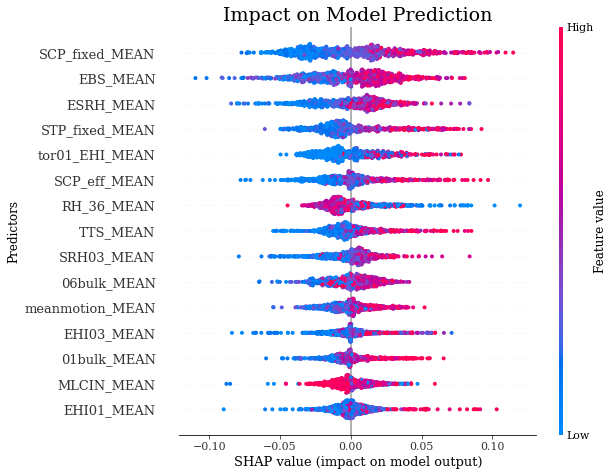

In [38]:
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=15, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')
#0.665, 0.6588

Text(0, 0.5, 'Predictors')

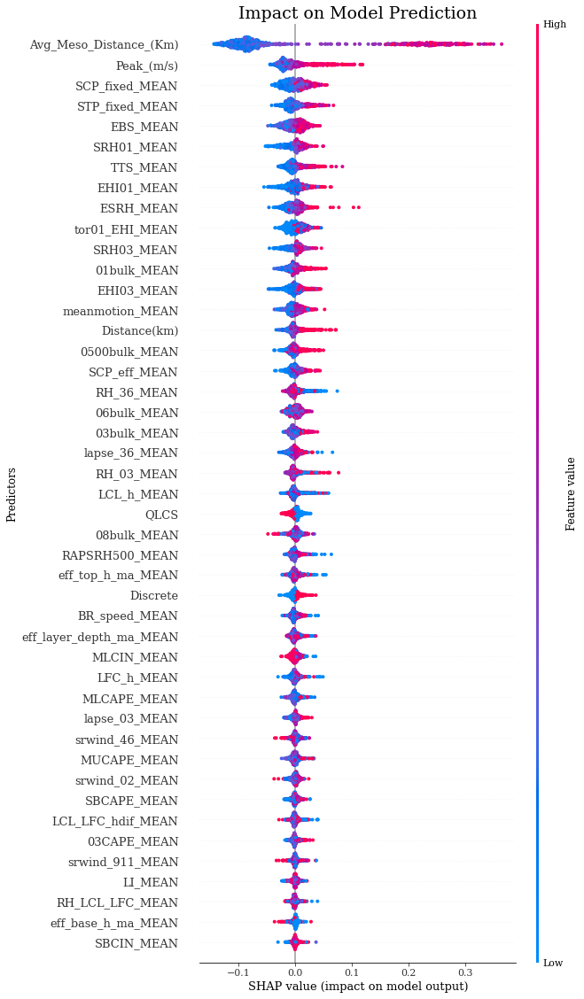

In [75]:
shap.summary_plot(shap_values=wyt[:,:,1], features=no_scale, feature_names=predictor_cols, max_display=45, show=False)
plt.title("Impact on Model Prediction", fontsize=19)
plt.ylabel('Predictors')

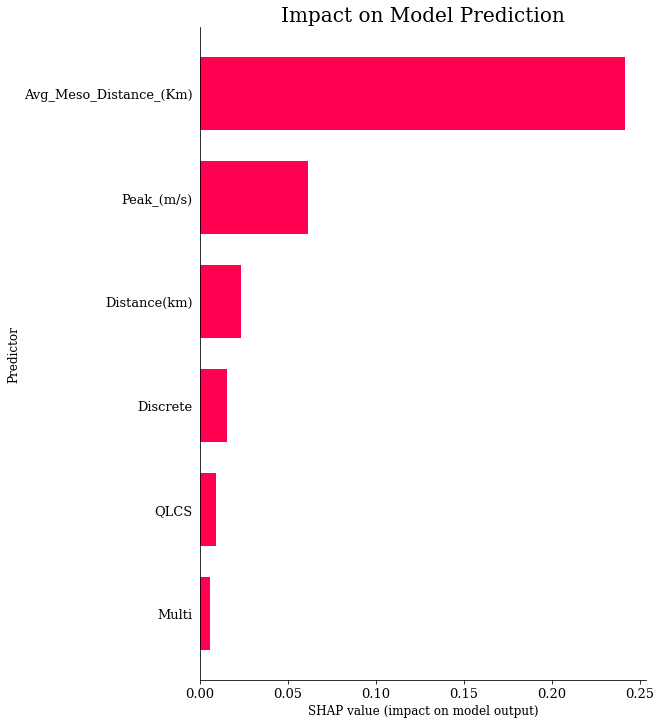

In [43]:
bar_legacy(lob, no_scale, predictor_cols, 15)

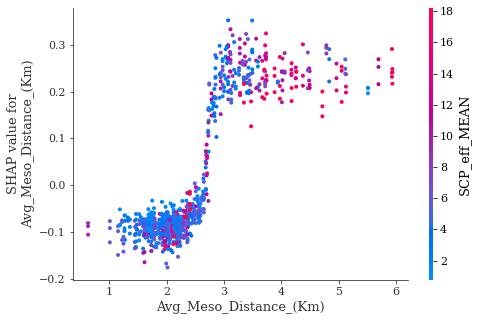

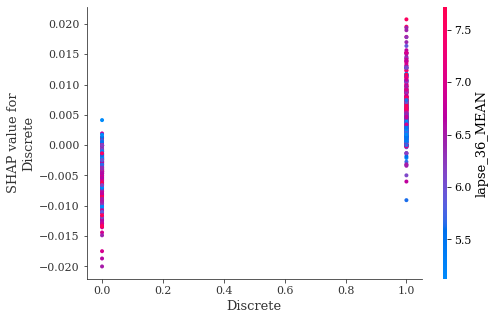

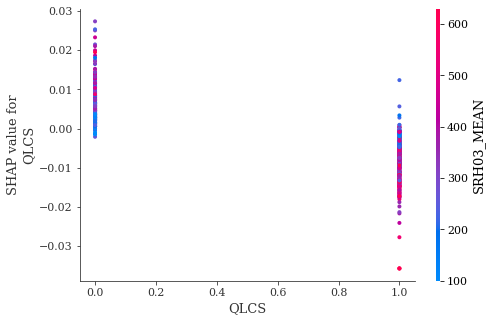

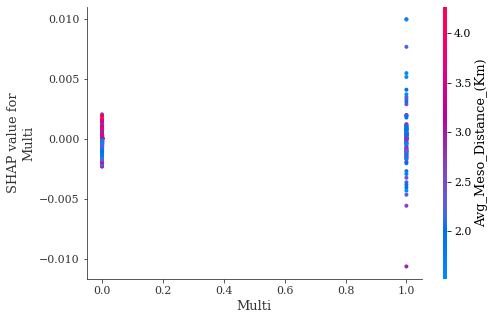

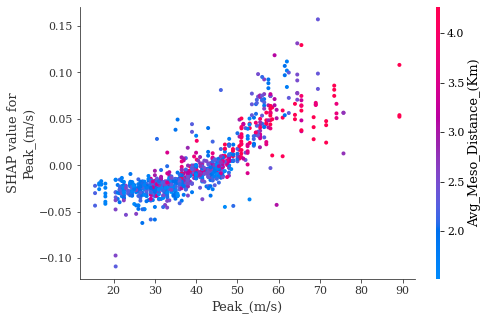

...

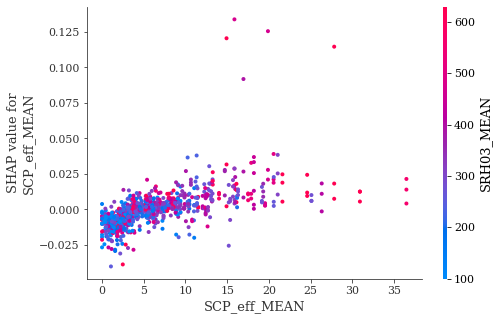

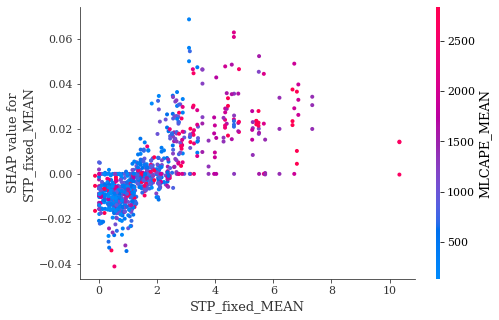

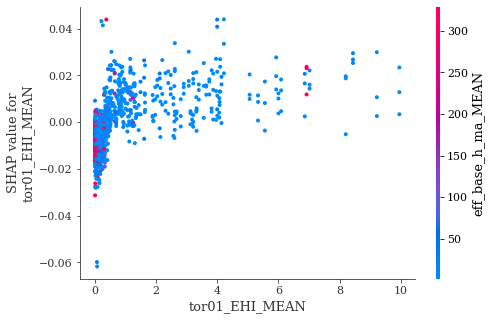

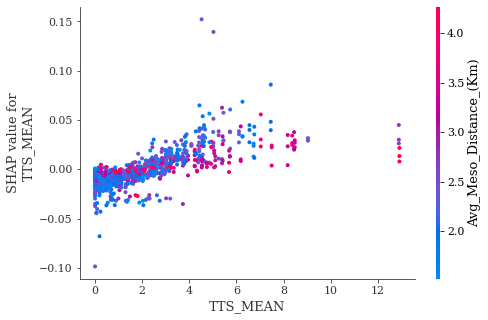

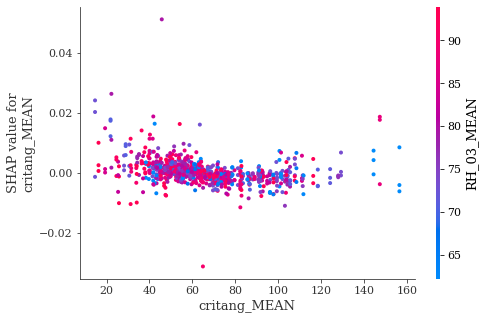

In [14]:
#for i in range(0,47):
#    shap.plots.scatter(shap_values[:,i,1])
#shap.plots.scatter(wyt[:,0,1])
for i in range (0,47):
    shap.dependence_plot(i,wyt[:,:,1], no_scale, predictor_cols)

In [12]:
nonsig_shap = np.concatenate(values_shap_nonsig, axis=0)
nonsig_base = np.concatenate(base_shap_nonsig, axis=0)
nonsig_pred = np.concatenate(pred_shap_nonsig, axis=0)

sig_shap = np.concatenate(values_shap_sig, axis=0)
sig_base = np.concatenate(base_shap_sig, axis=0)
sig_pred = np.concatenate(pred_shap_sig, axis=0)

# **SHAP Scatter Plots**

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


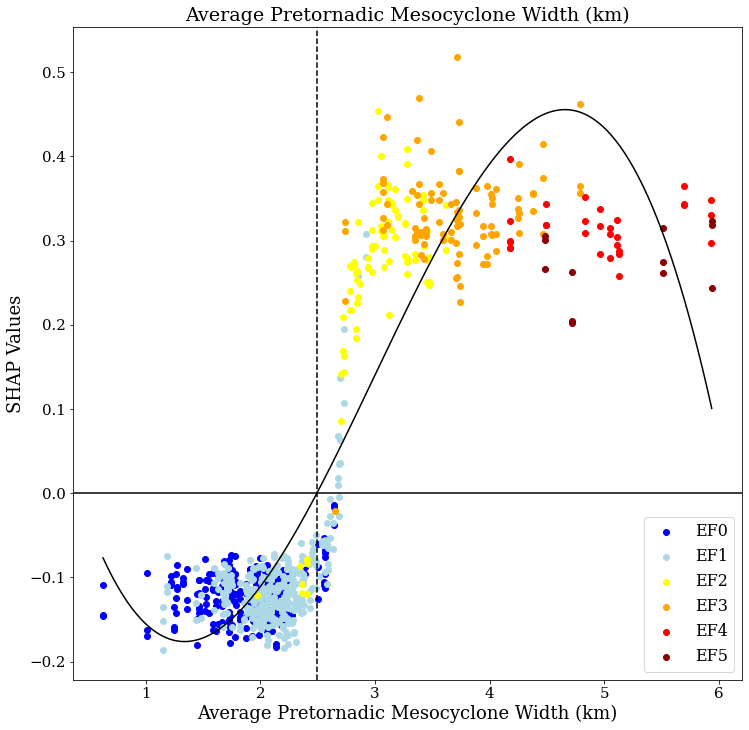

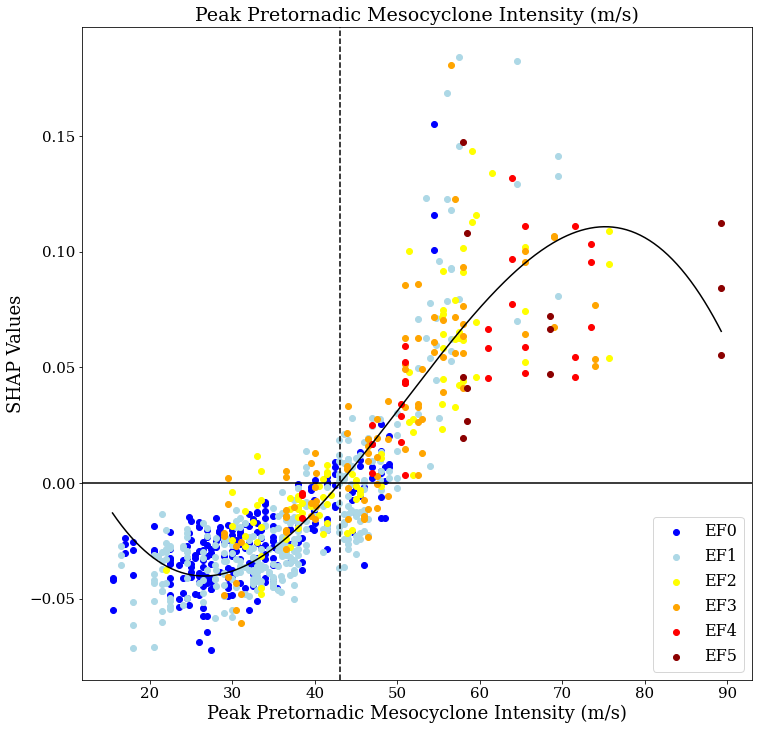

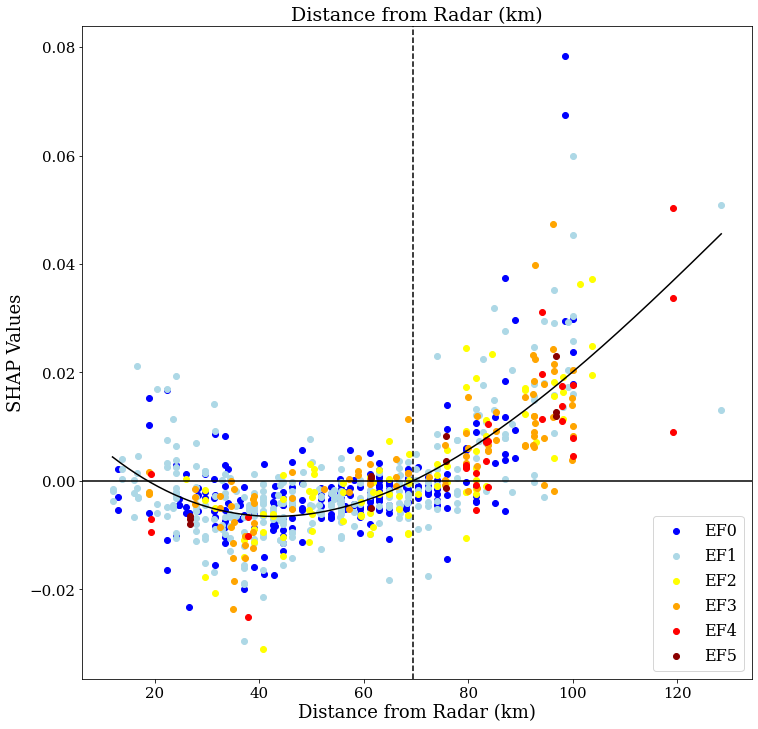

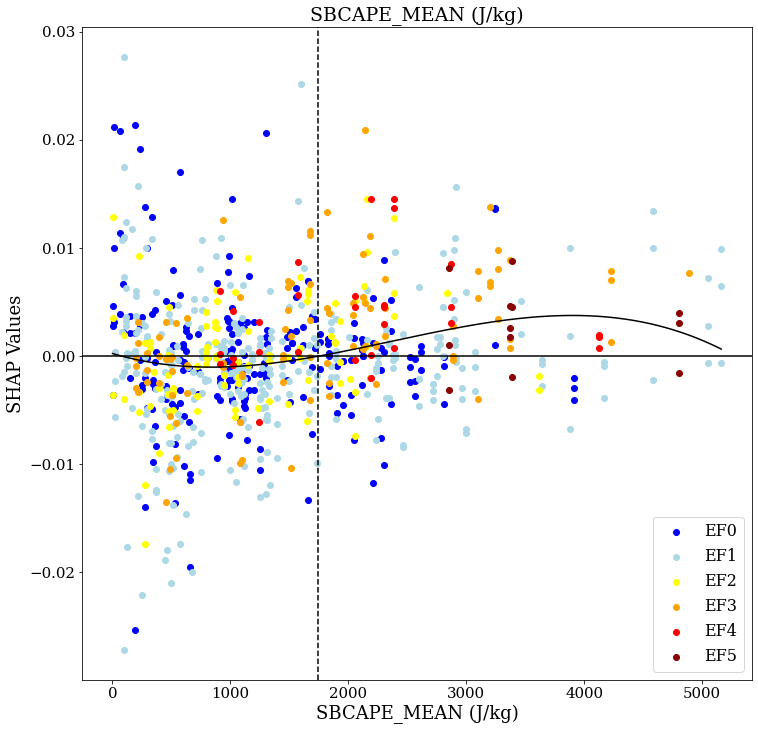

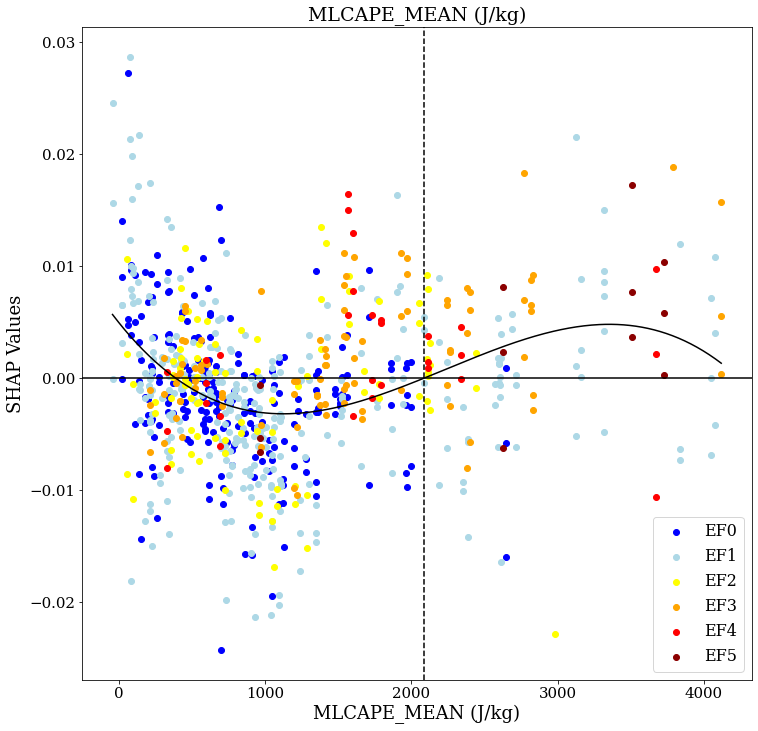

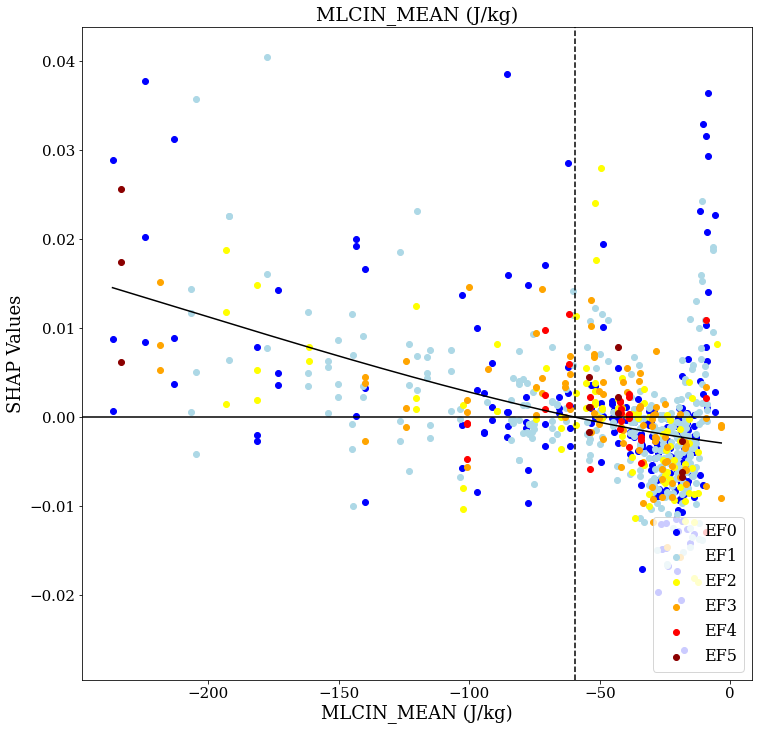

In [ ]:
#SHAP Scatter Plots

#predictor_cols=['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)']
#names=['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi', 'Peak_meso_intensity', 'Distance(km)']

 
#names = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi', 'Peak_meso_intensity', 'Distance(km)', 'SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#predictor_cols = ['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)', 'SBCAPE_MEAN (J/kg)', 'SBCIN_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', '03CAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_top_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'srwind_02_MEAN (m/s)', 'srwind_46_MEAN (m/s)', 'srwind_911_MEAN (m/s)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LCL_h_MEAN (m)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN (°)']

predictor_cols = ['Avg_Meso_Distance_(Km)','Peak_(m/s)', 'Distance(km)', 'SBCAPE_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN']
names = ['Average Pretornadic Mesocyclone Width (km)', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)', 'SBCAPE_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN']


#names = ['SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#predictor_cols = ['SBCAPE_MEAN (J/kg)', 'SBCIN_MEAN (J/kg)', 'MLCAPE_MEAN (J/kg)', 'MLCIN_MEAN (J/kg)', 'MUCAPE_MEAN (J/kg)', '03CAPE_MEAN (J/kg)', 'LI_MEAN (°C)', '08bulk_MEAN (m/s)', '06bulk_MEAN (m/s)', '03bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', '0500bulk_MEAN (m/s)', 'BR_speed_MEAN (m/s)', 'meanmotion_MEAN (m/s)', 'SRH03_MEAN (m^2/s^2)', 'SRH01_MEAN (m^2/s^2)', 'RAPSRH500_MEAN (m^2/s^2)', 'eff_base_h_MEAN (m)', 'eff_top_h_MEAN (m)', 'eff_layer_depth_MEAN (m)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'srwind_02_MEAN (m/s)', 'srwind_46_MEAN (m/s)', 'srwind_911_MEAN (m/s)', 'lapse_36_MEAN (°C/km)', 'lapse_03_MEAN (°C/km)', 'RH_36_MEAN (%)', 'RH_03_MEAN (%)', 'LCL_h_MEAN (m)', 'LFC_h_MEAN (m)', 'LCL_LFC_hdif_MEAN (m)', 'RH_LCL_LFC_MEAN (%)', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN (°)']

#predictor_cols = ['MLCAPE_MEAN (J/kg)', '06bulk_MEAN (m/s)', '01bulk_MEAN (m/s)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'lapse_36_MEAN (°C/km)', 'RH_36_MEAN (%)', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']
#names = ['MLCAPE_MEAN', '06bulk_MEAN', '01bulk_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']

#for i in [names.index('SBCAPE_MEAN'), names.index('SRH03_MEAN'), names.index('EBS_MEAN'), names.index('RH_36_MEAN'), names.index('RH_03_MEAN')]:
#for i in [names.index('RH_36_MEAN')]:
for i in range(0,36):
#for i in [0]:
    coefficients=np.polyfit(no_scale[:,i], wyt[:,i,1],3)
    #coefficients=np.polyfit(no_scale[:,i], shap[:,i,1],3)
    poly=np.poly1d(coefficients)
    new_x = np.linspace(np.min(no_scale[:,i]),np.max(no_scale[:,i]),400)
    new_y=poly(new_x)
    plt.figure(figsize=(12,12))
    EF0 = plt.scatter(EF0_cor_no_scale[:,i], EF0_cor_shap[:,i,1], c= 'blue')
    EF1 = plt.scatter(EF1_cor_no_scale[:,i], EF1_cor_shap[:,i,1], c= 'lightblue')
    EF2 = plt.scatter(EF2_cor_no_scale[:,i], EF2_cor_shap[:,i,1], c= 'yellow')
    EF3 = plt.scatter(EF3_cor_no_scale[:,i], EF3_cor_shap[:,i,1], c='orange')
    EF4 = plt.scatter(EF4_cor_no_scale[:,i], EF4_cor_shap[:,i,1], c='red')
    EF5 = plt.scatter(EF5_cor_no_scale[:,i], EF5_cor_shap[:,i,1], c='darkred')
    #nonsig = plt.scatter(nonsig_no_scale[:,i], nonsig_shap[:,i,1])
    #sig = plt.scatter(sig_no_scale[:,i], sig_shap[:,i,1])
    plt.plot(new_x, new_y, c='black')
    plt.axhline(0, color='black')
    plt.axvline(new_x[np.argmin(np.abs(new_y[50:]))+50], c='black', linestyle='--')
    #plt.xlim(np.min(no_scale[:,i]-1),np.max(no_scale[:,i])+1)
    plt.title(names[i], fontsize=19)
    plt.xlabel(names[i], fontsize=18)
    plt.ylabel('SHAP Values', fontsize=18)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend((EF0, EF1, EF2, EF3, EF4, EF5), ('EF0', 'EF1', 'EF2', 'EF3', 'EF4', 'EF5'), loc='lower right', fontsize=16)
    #plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/SHAP_scatter/final_pred/env_mul_cases_'+str(names[i]), bbox_inches='tight')

In [44]:
sig_loc=np.where(y_test==1)
values_shap[0][sig_loc,:,1]

array([[[ 3.34348963e-03, -8.57790477e-03,  6.31471092e-03,
          6.22157897e-03,  1.66914434e-02, -2.21666668e-03,
          1.32311359e-02,  5.93519339e-03,  1.26766783e-02,
         -5.50018176e-03,  2.79817478e-02, -5.07285918e-03,
          3.14941997e-04, -3.04701971e-03, -1.74037609e-02,
         -5.80558068e-03,  1.42734733e-03, -6.45138863e-04,
         -2.59007108e-03,  2.34727435e-02, -1.43884837e-03,
          7.47821232e-03,  4.80557408e-03,  8.22768777e-04,
         -1.75261369e-02, -4.35993245e-03,  1.67430556e-02,
         -1.32357326e-02, -1.37460533e-02,  5.78987797e-03,
          3.29026986e-03, -4.36458348e-04, -3.32316724e-03,
         -1.27592611e-02,  5.07438450e-03,  5.54517230e-02,
          1.24672830e-02,  5.60470604e-02,  3.43922340e-02,
         -2.03020829e-03, -1.23819698e-02],
        [-7.69241877e-04, -3.96759949e-03, -2.66643534e-03,
          1.49544898e-02,  3.78964515e-03,  9.61805842e-04,
          3.08433920e-03,  2.77589284e-03,  1.11943494e-

In [27]:
test=np.array(yprobs)
test[:,:,1]
fop_

[array([0.05714286, 0.45454545, 1.        , 1.        ]),
 array([0.08571429, 0.5       , 0.33333333, 0.5       , 1.        ]),
 array([0.12121212, 0.16666667, 0.2       , 0.75      , 1.        ]),
 array([0.08333333, 0.08333333, 0.25      , 0.71428571, 0.92307692]),
 array([0.0625    , 0.16666667, 0.33333333, 1.        , 0.94444444]),
 array([0.22222222, 0.03225806, 0.83333333, 0.92857143]),
 array([0.13513514, 0.16666667, 0.33333333, 1.        , 1.        ]),
 array([0.1       , 0.22222222, 0.4       , 0.        , 0.93333333]),
 array([0.17391304, 0.125     , 0.66666667, 0.33333333, 0.91666667]),
 array([0.04545455, 0.125     , 0.57142857, 1.        , 1.        ]),
 array([0.03333333, 0.25      , 0.33333333, 0.5       , 0.94117647]),
 array([0.1025641 , 0.33333333, 0.5       , 1.        , 1.        ]),
 array([0.        , 0.30769231, 0.5       , 1.        , 0.84615385]),
 array([0.09090909, 0.        , 0.5       , 0.        , 0.94117647]),
 array([0.11428571, 0.5       , 0.33333333, 

Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars
Mean of empty slice.
invalid value encountered in double_scalars


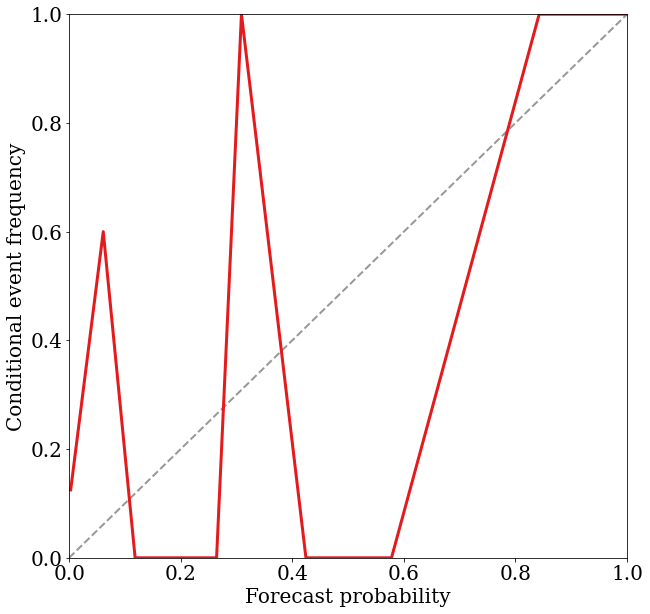

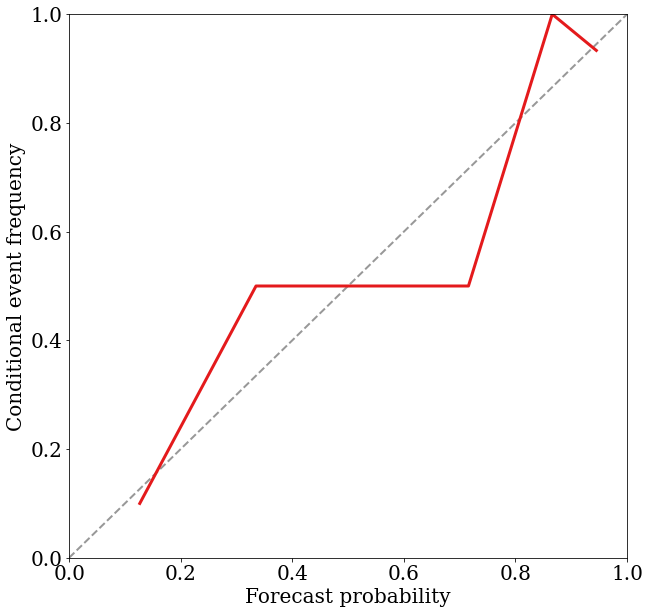

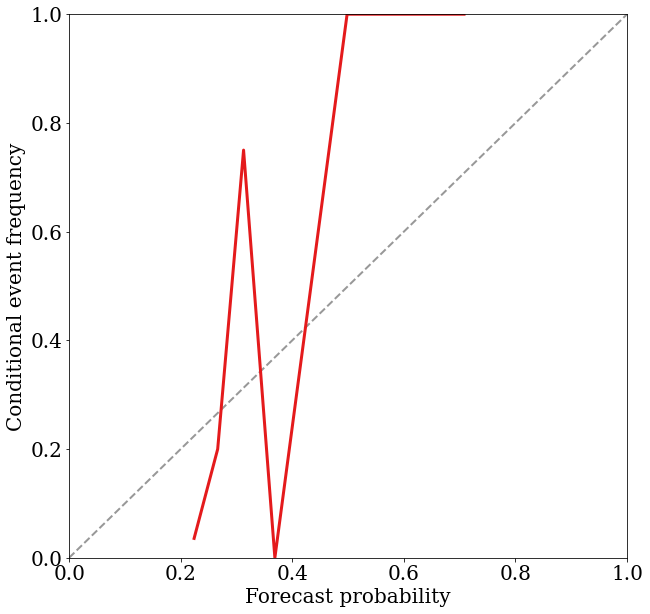

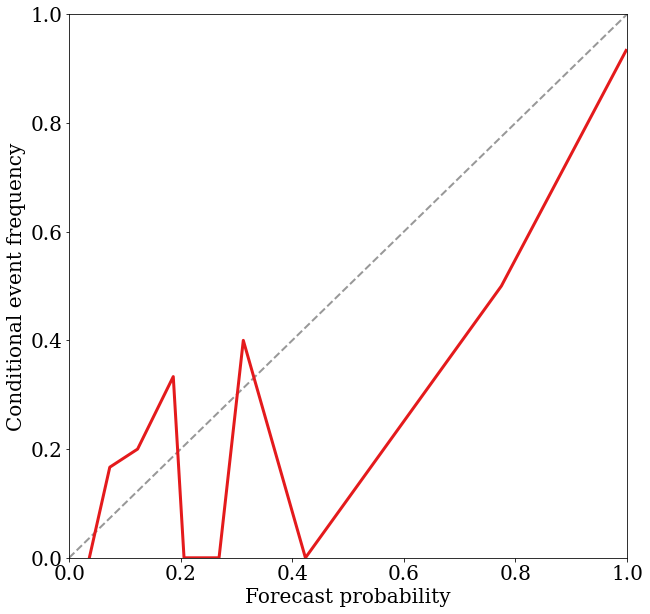

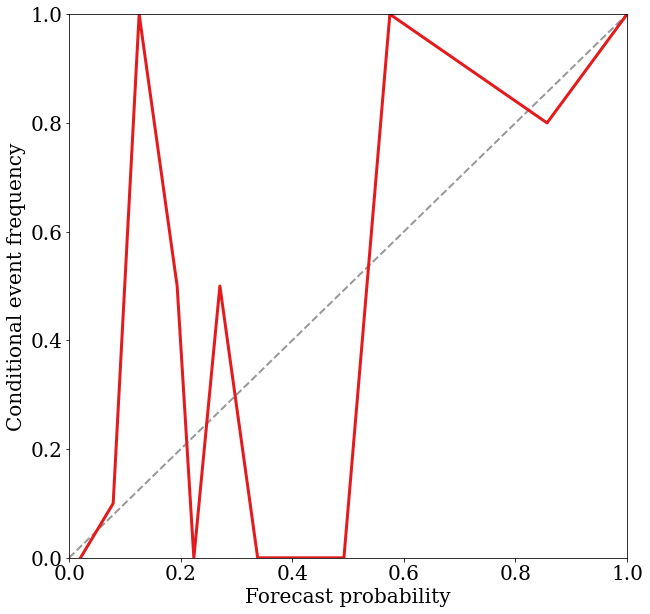

...

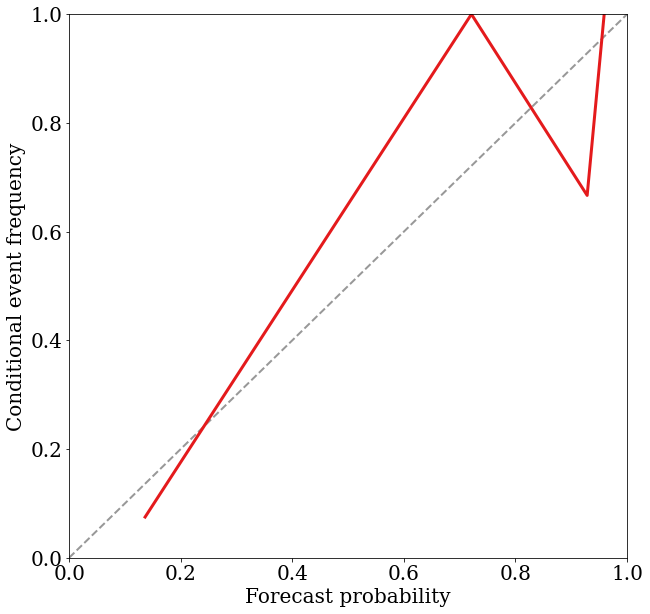

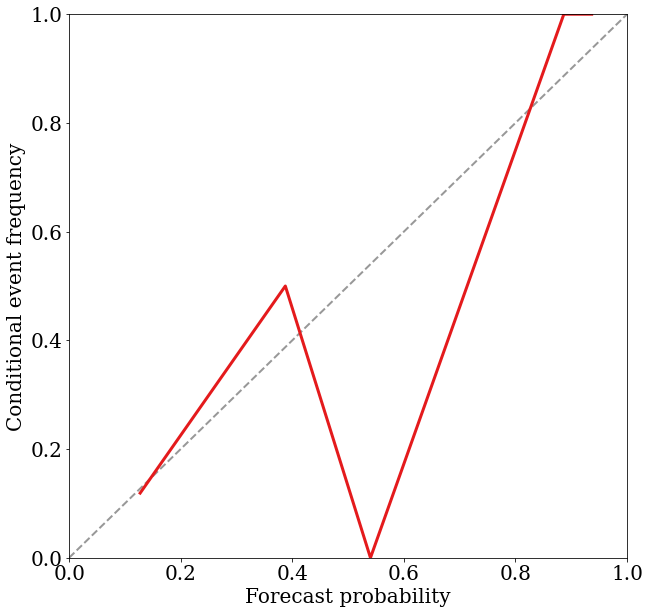

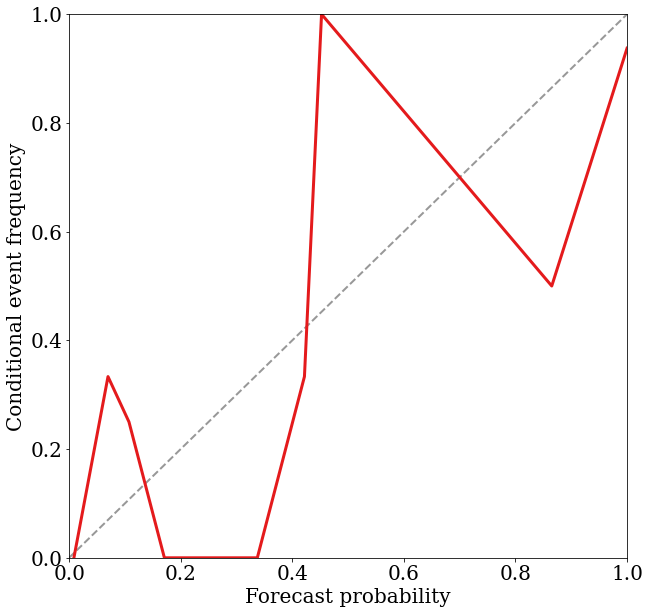

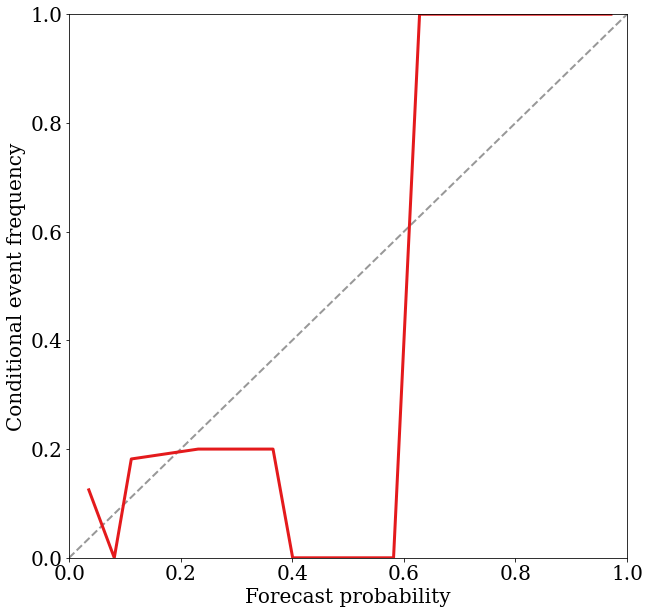

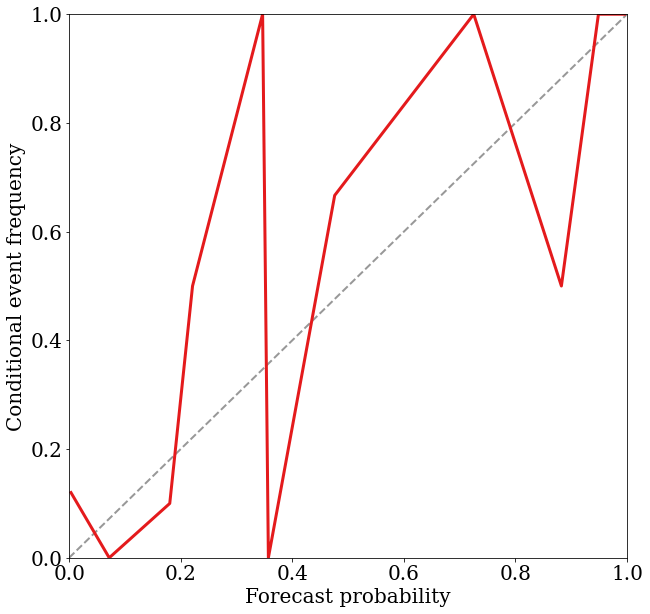

In [23]:
forecasted=[]
obser=[]
hist=[]
for i in range(0,15):
    fore, obs, h=plot_reliability_curve(y_real[i], y_proba[i])
    forecasted.append(fore)
    obser.append(obs)
    hist.append(h)

In [27]:
#Calibration Curve Definition
def plot_calibration_curve(name, fig_index, probs, fop, mpv):
    """Plot calibration curve for est w/o and with calibration. """

    

    fig1 = plt.figure(fig_index, figsize=(15, 15))
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))
    
    _plot_background(axes_object=ax1, observed_labels=y_real)
    
    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly Calibrated")
    ax1.legend(loc="lower right")
    
        
    ax1.plot(mpv_[0], fop_[0], "s-", label=f'{name}',c='red')
    ax1.plot(mpv_[1], fop_[1], "s-", label=f'{name}', c='brown')
    ax1.plot(mpv_[2], fop_[2], "s-", label=f'{name}',c='orange')
    ax1.plot(mpv_[3], fop_[3], "s-", label=f'{name}', c='purple')
    ax1.plot(mpv_[4], fop_[4], "s-", label=f'{name}', c='yellow')
    ax1.plot(mpv_[5], fop_[5], "s-", label=f'{name}', c='blue')
    ax1.plot(mpv_[6], fop_[6], "s-", label=f'{name}', c='teal')
    ax1.plot(mpv_[7], fop_[7], "s-", label=f'{name}', c='green')
    ax1.plot(mpv_[8], fop_[8], "s-", label=f'{name}', c='lightblue')
    ax1.plot(mpv_[9], fop_[9], "s-", label=f'{name}', c='gold')
    ax1.plot(mpv_[10], fop_[10], "s-", label=f'{name}', c='pink')
    ax1.plot(mpv_[11], fop_[11], "s-", label=f'{name}', c='grey')
    ax1.plot(mpv_[12], fop_[12], "s-", label=f'{name}', c='lightgreen')
    ax1.plot(mpv_[13], fop_[13], "s-", label=f'{name}', c='darkblue')
    ax1.plot(mpv_[14], fop_[14], "s-", label=f'{name}', c='darkgreen')
    ax1.set_ylabel("Fraction of positives")
    ax1.set_ylim([-0.05, 1.05])
    
    ax1.set_title(f'Calibration Plot ({name})')
    ax1.set_xlabel("Mean predicted value")
    
    ax2.hist(probs, range=(0, 1), bins=10, label=name, histtype="step", lw=2)
    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    fig1.savefig('/data/keeling/a/msessa2/python/notebooks/Random_Forest/Final_calibration_and_CSI/RF_UC_ALL_env')

In [28]:
#Plot code for performance diagrams


DEFAULT_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
DEFAULT_LINE_WIDTH = 2
DEFAULT_BIAS_LINE_COLOUR = numpy.full(3, 152. / 255)
DEFAULT_BIAS_LINE_WIDTH = 2

LEVELS_FOR_CSI_CONTOURS = numpy.linspace(0, 1, num=11, dtype=float)
LEVELS_FOR_BIAS_CONTOURS = numpy.array(
    [0.25, 0.5, 0.75, 1., 1.5, 2., 3., 5.])

BIAS_STRING_FORMAT = '%.2f'
BIAS_LABEL_PADDING_PX = 10

FIGURE_WIDTH_INCHES = 18
FIGURE_HEIGHT_INCHES = 18

FONT_SIZE = 20
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _get_sr_pod_grid(success_ratio_spacing=0.01, pod_spacing=0.01):
    """Creates grid in SR-POD (success ratio / probability of detection) space.
    M = number of rows (unique POD values) in grid
    N = number of columns (unique success ratios) in grid
    :param success_ratio_spacing: Spacing between grid cells in adjacent
        columns.
    :param pod_spacing: Spacing between grid cells in adjacent rows.
    :return: success_ratio_matrix: M-by-N numpy array of success ratios.
        Success ratio increases with column index.
    :return: pod_matrix: M-by-N numpy array of POD values.  POD decreases with
        row index.
    """

    num_success_ratios = 1 + int(numpy.ceil(1. / success_ratio_spacing))
    num_pod_values = 1 + int(numpy.ceil(1. / pod_spacing))

    unique_success_ratios = numpy.linspace(0., 1., num=num_success_ratios)
    unique_pod_values = numpy.linspace(0., 1., num=num_pod_values)[::-1]
    return numpy.meshgrid(unique_success_ratios, unique_pod_values)


def _csi_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes CSI (critical success index) from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: csi_array: numpy array (same shape) of CSI values.
    """

    return (success_ratio_array ** -1 + pod_array ** -1 - 1.) ** -1


def _bias_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes frequency bias from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: frequency_bias_array: numpy array (same shape) of frequency biases.
    """

    return pod_array / success_ratio_array


def _get_csi_colour_scheme():
    """Returns colour scheme for CSI (critical success index).
    :return: colour_map_object: Colour scheme (instance of
        `matplotlib.colors.ListedColormap`).
    :return: colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.
    """

    this_colour_map_object = pyplot.cm.Blues
    this_colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, this_colour_map_object.N)

    rgba_matrix = this_colour_map_object(this_colour_norm_object(
        LEVELS_FOR_CSI_CONTOURS))
    colour_list = [
        rgba_matrix[i, ..., :-1] for i in range(rgba_matrix.shape[0])
    ]

    colour_map_object = matplotlib.colors.ListedColormap(colour_list)
    colour_map_object.set_under(numpy.array([1, 1, 1]))
    colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, colour_map_object.N)

    return colour_map_object, colour_norm_object


def _add_colour_bar(
        axes_object, colour_map_object, values_to_colour, min_colour_value,
        max_colour_value, colour_norm_object=None,
        orientation_string='vertical', extend_min=True, extend_max=True,
        fraction_of_axis_length=1., font_size=FONT_SIZE):
    """Adds colour bar to existing axes.
    :param axes_object: Existing axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).
    :param colour_map_object: Colour scheme (instance of
        `matplotlib.pyplot.cm`).
    :param values_to_colour: numpy array of values to colour.
    :param min_colour_value: Minimum value in colour map.
    :param max_colour_value: Max value in colour map.
    :param colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.  If `colour_norm_object is None`,
        will assume that scale is linear.
    :param orientation_string: Orientation of colour bar ("vertical" or
        "horizontal").
    :param extend_min: Boolean flag.  If True, the bottom of the colour bar will
        have an arrow.  If False, it will be a flat line, suggesting that lower
        values are not possible.
    :param extend_max: Same but for top of colour bar.
    :param fraction_of_axis_length: Fraction of axis length (y-axis if
        orientation is "vertical", x-axis if orientation is "horizontal")
        occupied by colour bar.
    :param font_size: Font size for labels on colour bar.
    :return: colour_bar_object: Colour bar (instance of
        `matplotlib.pyplot.colorbar`) created by this method.
    """

    if colour_norm_object is None:
        colour_norm_object = matplotlib.colors.Normalize(
            vmin=min_colour_value, vmax=max_colour_value, clip=False)

    scalar_mappable_object = pyplot.cm.ScalarMappable(
        cmap=colour_map_object, norm=colour_norm_object)
    scalar_mappable_object.set_array(values_to_colour)

    if extend_min and extend_max:
        extend_string = 'both'
    elif extend_min:
        extend_string = 'min'
    elif extend_max:
        extend_string = 'max'
    else:
        extend_string = 'neither'

    if orientation_string == 'horizontal':
        padding = 0.075
    else:
        padding = 0.05

    colour_bar_object = pyplot.colorbar(
        ax=axes_object, mappable=scalar_mappable_object,
        orientation=orientation_string, pad=padding, extend=extend_string,
        shrink=fraction_of_axis_length)

    colour_bar_object.ax.tick_params(labelsize=font_size)
    return colour_bar_object


def get_points_in_perf_diagram(observed_labels, forecast_probabilities):
    """Creates points for performance diagram.
    E = number of examples
    T = number of binarization thresholds
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :return: pod_by_threshold: length-T numpy array of POD (probability of
        detection) values.
    :return: success_ratio_by_threshold: length-T numpy array of success ratios.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    observed_labels = observed_labels.astype(int)
    binarization_thresholds = numpy.linspace(0, 1, num=1001, dtype=float)

    num_thresholds = len(binarization_thresholds)
    pod_by_threshold = numpy.full(num_thresholds, numpy.nan)
    success_ratio_by_threshold = numpy.full(num_thresholds, numpy.nan)

    for k in range(num_thresholds):
        these_forecast_labels = (
            forecast_probabilities >= binarization_thresholds[k]
        ).astype(int)

        this_num_hits = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 1
        ))

        this_num_false_alarms = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 0
        ))

        this_num_misses = numpy.sum(numpy.logical_and(
            these_forecast_labels == 0, observed_labels == 1
        ))

        try:
            pod_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_misses)
            )
        except ZeroDivisionError:
            pass

        try:
            success_ratio_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_false_alarms)
            )
        except ZeroDivisionError:
            pass

    pod_by_threshold = numpy.array([1.] + pod_by_threshold.tolist() + [0.])
    success_ratio_by_threshold = numpy.array(
        [0.] + success_ratio_by_threshold.tolist() + [1.]
    )

    return pod_by_threshold, success_ratio_by_threshold


def plot_performance_diagram(
        observed_labels, forecast_probabilities,
        line_colour=DEFAULT_LINE_COLOUR, line_width=DEFAULT_LINE_WIDTH,
        bias_line_colour=DEFAULT_BIAS_LINE_COLOUR,
        bias_line_width=DEFAULT_BIAS_LINE_WIDTH, axes_object=None):
    """Plots performance diagram.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param line_colour: Colour (in any format accepted by `matplotlib.colors`).
    :param line_width: Line width (real positive number).
    :param bias_line_colour: Colour of contour lines for frequency bias.
    :param bias_line_width: Width of contour lines for frequency bias.
    :param axes_object: Will plot on these axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).  If `axes_object is None`,
        will create new axes.
    :return: pod_by_threshold: See doc for `get_points_in_perf_diagram`.
        detection) values.
    :return: success_ratio_by_threshold: Same.
    """
    pod_bt=[]
    sr_bt=[]
    for i in range(0,15):
        pod_by_threshold, success_ratio_by_threshold = get_points_in_perf_diagram(
        observed_labels=observed_labels[i],
        forecast_probabilities=forecast_probabilities[i])
        pod_bt.append(pod_by_threshold)
        sr_bt.append(success_ratio_by_threshold)
    

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    success_ratio_matrix, pod_matrix = _get_sr_pod_grid()
    csi_matrix = _csi_from_sr_and_pod(success_ratio_matrix, pod_matrix)
    frequency_bias_matrix = _bias_from_sr_and_pod(
        success_ratio_matrix, pod_matrix)

    this_colour_map_object, this_colour_norm_object = _get_csi_colour_scheme()

    pyplot.contourf(
        success_ratio_matrix, pod_matrix, csi_matrix, LEVELS_FOR_CSI_CONTOURS,
        cmap=this_colour_map_object, norm=this_colour_norm_object, vmin=0.,
        vmax=1., axes=axes_object)

    colour_bar_object = _add_colour_bar(
        axes_object=axes_object, colour_map_object=this_colour_map_object,
        colour_norm_object=this_colour_norm_object,
        values_to_colour=csi_matrix, min_colour_value=0.,
        max_colour_value=1., orientation_string='vertical',
        extend_min=False, extend_max=False)
    colour_bar_object.set_label('CSI (critical success index)')

    bias_colour_tuple = ()
    for _ in range(len(LEVELS_FOR_BIAS_CONTOURS)):
        bias_colour_tuple += (bias_line_colour,)

    bias_contour_object = pyplot.contour(
        success_ratio_matrix, pod_matrix, frequency_bias_matrix,
        LEVELS_FOR_BIAS_CONTOURS, colors=bias_colour_tuple,
        linewidths=bias_line_width, linestyles='dashed', axes=axes_object)
    pyplot.clabel(
        bias_contour_object, inline=True, inline_spacing=BIAS_LABEL_PADDING_PX,
        fmt=BIAS_STRING_FORMAT, fontsize=FONT_SIZE)
    nan_flags=[]
    for i in range(0,15):
        nan_flag = numpy.logical_or(
            numpy.isnan(sr_bt[i]), numpy.isnan(pod_bt[i]))
        nan_flags.append(nan_flag)
    
    real_ind=[]
    final_pod=[]
    final_sr=[]
    length=[]
    for i in range(0,15):
        if not numpy.all(nan_flags[i]):
            real_indices = numpy.where(numpy.invert(nan_flags[i]))[0]
            real_ind.append(real_indices)
            #print(pod_bt[i][real_indices].shape)
            axes_object.plot(
                sr_bt[i][real_indices],
                pod_bt[i][real_indices], color=line_colour,
               linestyle='solid', linewidth=line_width, alpha=0.4)
        pod2=pod_bt[i][real_indices]
        sr2=sr_bt[i][real_indices]
        lengths=len(sr_bt[i][real_indices])
        length.append(lengths)
        final_pod.append(pod2)
        final_sr.append(sr2)

    print(length)
    equal_pod=[]
    equal_sr=[]
    for i in range(0,15):
        if len(final_pod[i])==max(length):
            equal_pod.append(final_pod[i])
            equal_sr.append(final_sr[i])
    mean_pod=np.mean(equal_pod, axis=0)
    mean_sr=np.mean(equal_sr, axis=0)
    print(len(equal_sr))
    print(max(length))

    
    #axes_object.plot(mean_sr, mean_pod, color='black',
    #         label='Mean Curve',
    #         lw=3)

    axes_object.set_xlabel('Success ratio (1 - FAR)')
    axes_object.set_ylabel('POD (probability of detection)')
    #axes_object.legend(loc="lower right", fontsize=19)
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)
    pyplot.savefig('/data/keeling/a/msessa2/python/notebooks/Random_Forest/Final_calibration_and_CSI/RF_CSI_ALL_radar_nomean')

    return pod_by_threshold, success_ratio_by_threshold

invalid value encountered in true_divide
divide by zero encountered in reciprocal
divide by zero encountered in true_divide
invalid value encountered in true_divide


[973, 1003, 1003, 1003, 1003, 737, 980, 987, 1003, 1003, 1003, 1003, 984, 1003, 986]
9
1003


(array([1., 1., 1., ..., 0., 0., 0.]),
 array([0.        , 0.36666667, 0.36666667, ...,        nan,        nan,
        1.        ]))

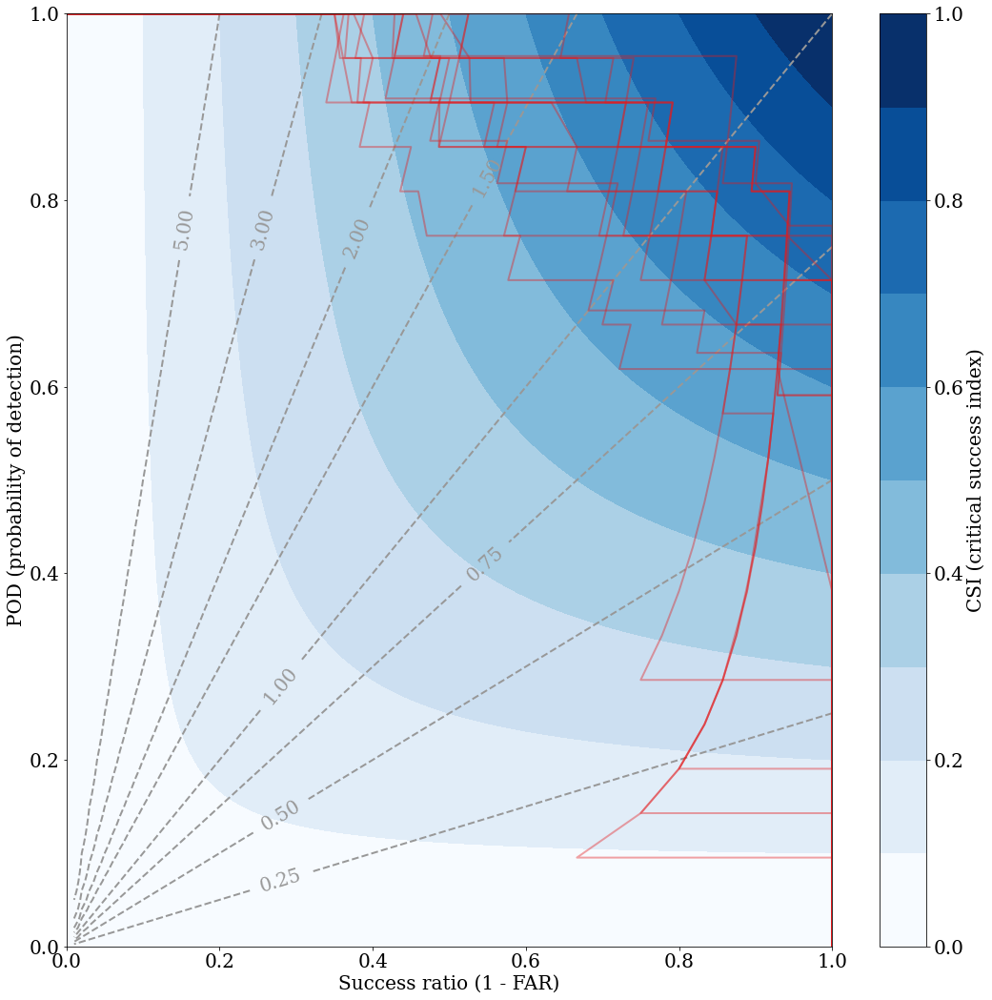

In [29]:
plot_performance_diagram(
        y_real, y_proba,
        line_colour=DEFAULT_LINE_COLOUR, line_width=DEFAULT_LINE_WIDTH,
        bias_line_colour=DEFAULT_BIAS_LINE_COLOUR,
        bias_line_width=DEFAULT_BIAS_LINE_WIDTH, axes_object=None)

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.


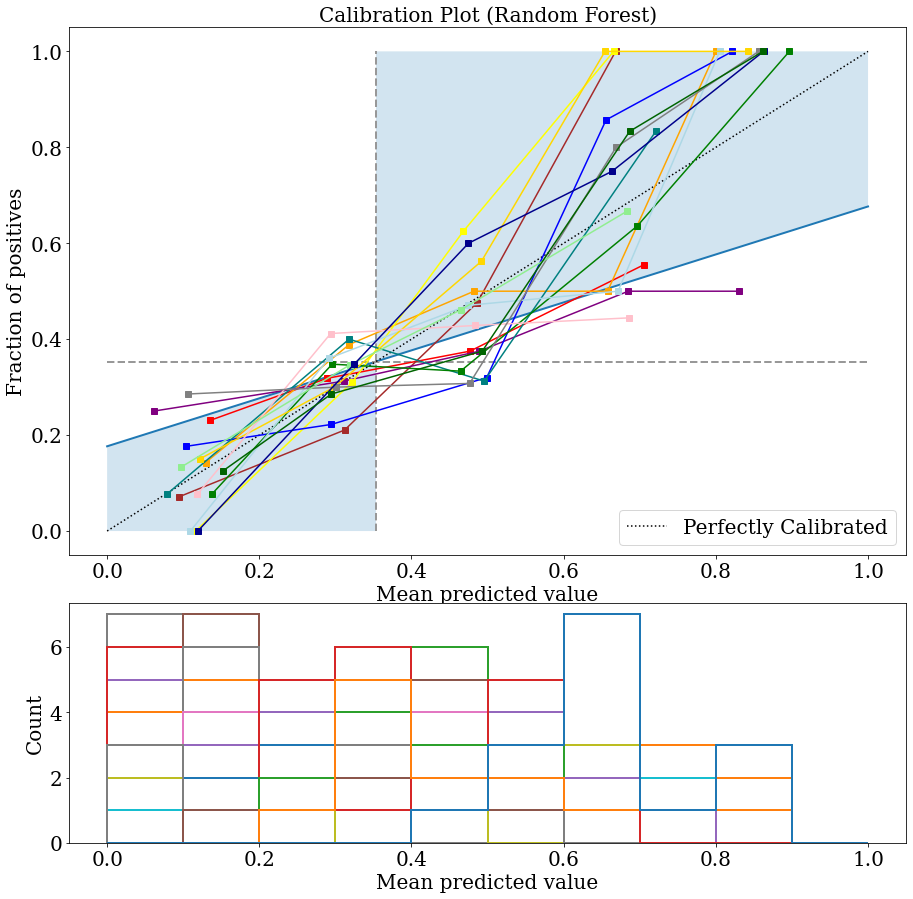

In [30]:
plot_calibration_curve('Random Forest', 1, test[:,:,1], fop_, mpv_)

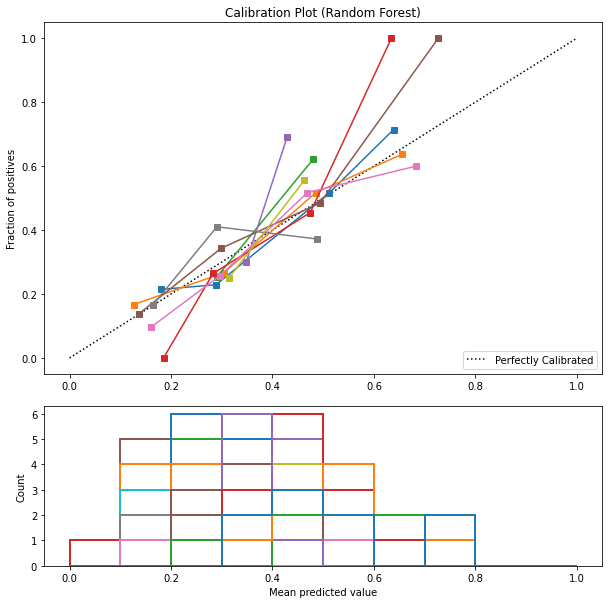

In [58]:
plot_calibration_curve('Random Forest', 1, test[:,:,1], fop_, mpv_)

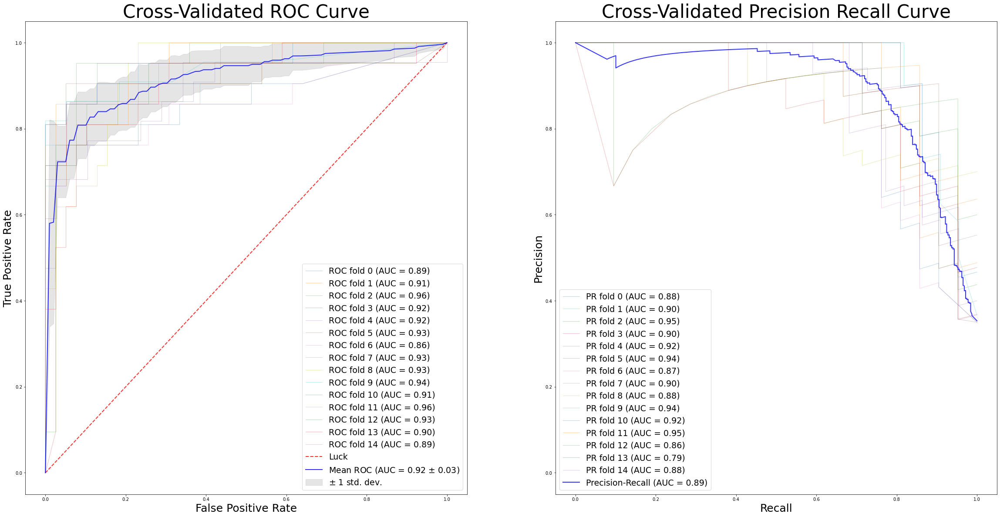

In [13]:
#ROC Curve Plot
ax1.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Luck', alpha=.8)
    
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = sklearn.metrics.auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax1.plot(mean_fpr, mean_tpr, color='b',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax1.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')

ax1.set_xlim([-0.05, 1.05])
ax1.set_ylim([-0.05, 1.05])
ax1.set_xlabel('False Positive Rate', fontsize=25)
ax1.set_ylabel('True Positive Rate', fontsize=25)
ax1.set_title('Cross-Validated ROC Curve', fontsize=42)
ax1.legend(loc="lower right", fontsize=19)


#Precision-Recall Curve Plot
y_real = np.concatenate(y_real)
y_proba = np.concatenate(y_proba)
    
precision, recall, _ = precision_recall_curve(y_real, y_proba)

ax2.plot(recall, precision, color='b', label=r'Precision-Recall (AUC = %0.2f)' % (sklearn.metrics.average_precision_score(y_real, y_proba)), lw=2, alpha=.8)
ax2.set_xlim([-0.05, 1.05])
ax2.set_ylim([-0.05, 1.05])
ax2.set_xlabel('Recall', fontsize=25)
ax2.set_ylabel('Precision', fontsize=25)
ax2.set_title('Cross-Validated Precision Recall Curve', fontsize=42)
ax2.legend(loc="lower left", fontsize=19)

fig


In [14]:
fig.savefig('ROC_PR_RF_radar_best')

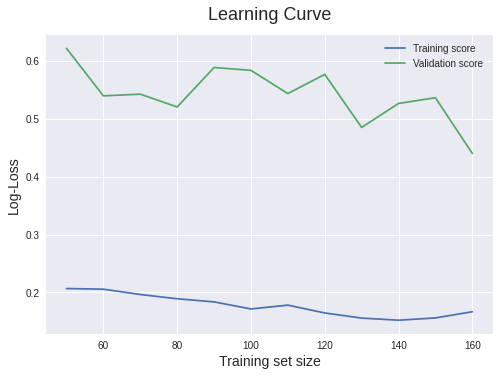

In [15]:
import matplotlib.pyplot as plt
import matplotlib

plt.style.use('seaborn')
plt.plot(train_sizes, -mean_train_ll, label = 'Training score')
plt.plot(train_sizes, -mean_val_ll, label = 'Validation score')
plt.ylabel('Log-Loss', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning Curve', fontsize = 18, y = 1.03)
plt.legend()
plt.savefig('LC_ll_RF_radar_best')

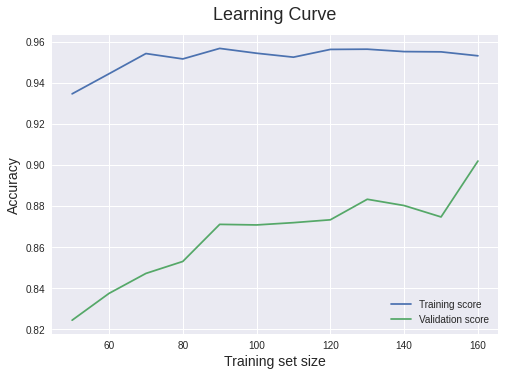

In [16]:
import matplotlib.pyplot as plt
import matplotlib

plt.style.use('seaborn')
plt.plot(train_sizes, mean_train_ac, label = 'Training score')
plt.plot(train_sizes, mean_val_ac, label = 'Validation score')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning Curve', fontsize = 18, y = 1.03)
plt.legend()
plt.savefig('LC_acc_RF_radar_best')

In [ ]:
#Permutation Test Plots

#Test 1
fig, ax = plt.subplots(figsize=[10,10])

ax.hist(perm_scores, bins=20, density=True)
ax.axvline(score, ls='--', color='r')
score_label = (f"Score on original data: {score:.2f}\n"
               f"p-value: {pvalue:.3f}")
ax.set_title('Permutation Test (original data)', fontsize=25)
ax.text(0.65, 14, score_label, fontsize=15)
ax.set_xlabel("Accuracy score", fontsize=15)
_ = ax.set_ylabel("Probability", fontsize=15)

In [ ]:
fig.savefig('PT1_RF_radar_best')

In [ ]:
#Test 2
fig, ax = plt.subplots(figsize=[10,10])

ax.hist(perm_scores_rand, bins=20, density=True)
ax.set_xlim(0.13)
ax.axvline(score_rand, ls="--", color="r")
score_label = f"Score on original\ndata: {score_rand:.2f}\n(p-value: {pvalue_rand:.3f})"
ax.text(0.14, 7.5, score_label, fontsize=15)
ax.set_title('Permutation Test (random data)', fontsize=25)
ax.set_xlabel("Accuracy score", fontsize=15)
ax.set_ylabel("Probability", fontsize=15)
plt.show()

In [ ]:
fig.save_fig('PT2_DT_radar_best')

In [18]:
result.best_score_

0.8916666666666666

In [9]:
result.best_params_

{'model__n_estimators': 16,
 'model__min_samples_split': 8,
 'model__min_samples_leaf': 1,
 'model__max_depth': 4}

In [17]:
scaler = preprocessing.RobustScaler()
scaler.fit(X)
training_predictor = scaler.transform(X)
rfe.fit(training_predictor, Y.values.ravel())
# summarize all features
for i in range(X.shape[1]):
	print('Column: %d, Selected %s, Rank: %.3f' % (i, rfe.support_[i], rfe.ranking_[i]))

Column: 0, Selected True, Rank: 1.000
Column: 1, Selected True, Rank: 1.000
Column: 2, Selected False, Rank: 2.000
Column: 3, Selected False, Rank: 4.000
Column: 4, Selected True, Rank: 1.000
Column: 5, Selected True, Rank: 1.000
Column: 6, Selected True, Rank: 1.000
Column: 7, Selected True, Rank: 1.000
Column: 8, Selected True, Rank: 1.000
Column: 9, Selected False, Rank: 3.000
Column: 10, Selected True, Rank: 1.000
Column: 11, Selected True, Rank: 1.000


# **LIME Exploration**

In [ ]:
pip install lime

     |████████████████████████████████| 276kB 5.1MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp36-none-any.whl size=283846 sha256=75e1148a7dc7686f8f4fef4c06805df19fca89a43d4f43f97e50cbb84d04b6ae
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
import lime
from lime import lime_tabular
import matplotlib

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(training_data=training_predictor, feature_names=predictor_cols, class_names=['0', '1'], mode='classification')

In [ ]:
i=43
exp = explainer.explain_instance(data_row=test_predictor[i], predict_fn=rf_model.predict_proba)

exp.show_in_notebook(show_table=True)

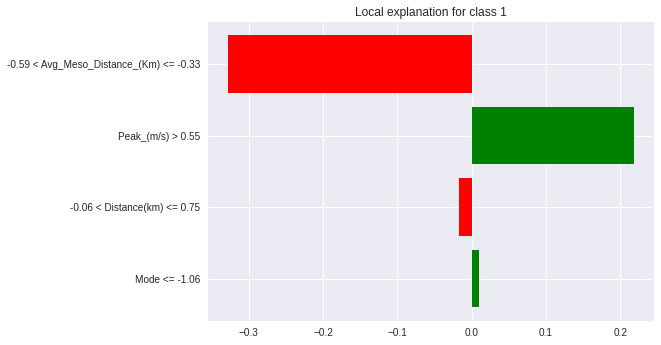

In [ ]:
fig = exp.as_pyplot_figure()

In [ ]:
# Code for SP-LIME
import warnings
from lime import submodular_pick

# Remember to convert the dataframe to matrix values
# SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model
sp_obj = submodular_pick.SubmodularPick(explainer, training_predictor, rf_model.predict_proba, num_exps_desired=5)


[exp.show_in_notebook() for exp in sp_obj.sp_explanations];
#[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Make it into a dataframe
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)
 
W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]
 
#Making a dataframe of all the explanations of sampled points
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)
W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]
 
#Plotting the aggregate importances
l = np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(25).sort_values(ascending=True)

#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
f = grped_coeff.head(25).sort_values("abs", ascending=True).drop("abs", axis=1)

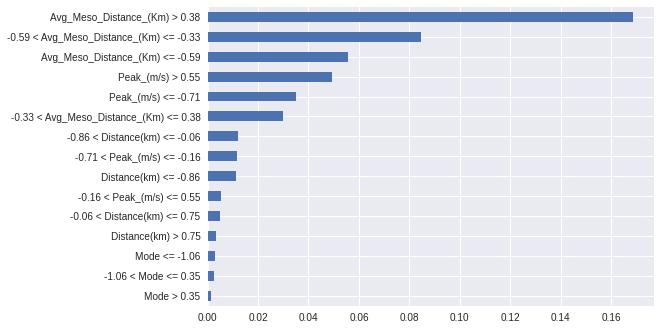

In [ ]:
l.plot(kind='barh')

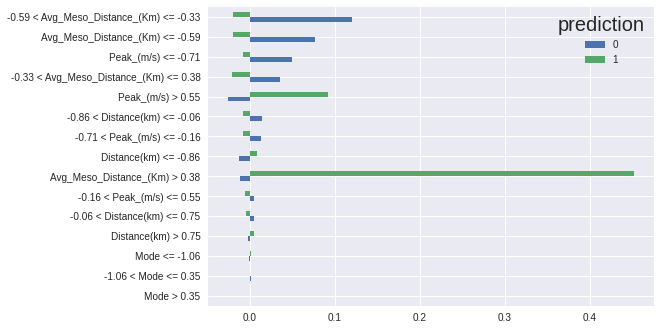

In [ ]:
f.plot(kind='barh')

In [ ]:
from sklearn.model_selection import permutation_test_score

In [ ]:
clf = RandomForestClassifier()
score_iris, perm_scores_iris, pvalue_iris = permutation_test_score(
    clf, X_scaled, Y, scoring="accuracy", cv=5, n_permutations=1000)

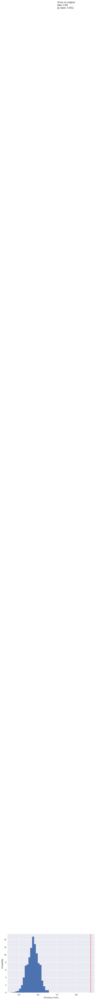

In [ ]:
fig, ax = plt.subplots()

ax.hist(perm_scores_iris, bins=20, density=True)
ax.axvline(score_iris, ls='--', color='r')
score_label = (f"Score on original\ndata: {score_iris:.2f}\n"
               f"(p-value: {pvalue_iris:.3f})")
ax.text(0.7, 260, score_label, fontsize=12)
ax.set_xlabel("Accuracy score")
_ = ax.set_ylabel("Probability")

# **Case Study**

In [16]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
#Case Study
#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)']

#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)', 'SBCAPE_MEAN', 'SBCIN_MEAN', 'MLCAPE_MEAN', 'MLCIN_MEAN', 'MUCAPE_MEAN', '03CAPE_MEAN', 'LI_MEAN', '08bulk_MEAN', '06bulk_MEAN', '03bulk_MEAN', '01bulk_MEAN', '0500bulk_MEAN', 'BR_speed_MEAN', 'meanmotion_MEAN', 'SRH03_MEAN', 'SRH01_MEAN', 'RAPSRH500_MEAN', 'eff_base_h_ma_MEAN', 'eff_top_h_ma_MEAN', 'eff_layer_depth_ma_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'srwind_02_MEAN', 'srwind_46_MEAN', 'srwind_911_MEAN', 'lapse_36_MEAN', 'lapse_03_MEAN', 'RH_36_MEAN', 'RH_03_MEAN', 'LCL_h_MEAN', 'LFC_h_MEAN', 'LCL_LFC_hdif_MEAN', 'RH_LCL_LFC_MEAN', 'EHI01_MEAN', 'EHI03_MEAN', 'SCP_fixed_MEAN', 'SCP_eff_MEAN', 'STP_fixed_MEAN', 'tor01_EHI_MEAN', 'TTS_MEAN', 'critang_MEAN']
#predictor_cols = ['SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN', 'EBS_MEAN', 'ESRH_MEAN', '06bulk_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN', 'MLCAPE_MEAN']
#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN', 'EBS_MEAN', 'ESRH_MEAN', '06bulk_MEAN', '01bulk_MEAN', 'lapse_36_MEAN', 'RH_36_MEAN', 'MLCAPE_MEAN']

#names = ['Average Pretornadic Mesocyclone Width (km)', 'Discrete Mode', 'QLCS Mode', 'Multicell Mode', 'Peak Pretornadic Mesocyclone Intensity (m/s)', 'Distance from Radar (km)']
#name = ['Avg_Meso_Distance','Discrete', 'QLCS', 'Multi', 'Peak', 'Distance(km)']

#predictor_cols = ['Avg_Meso_Distance_(Km)','Discrete', 'QLCS', 'Multi',	'Peak_(m/s)', 'Distance(km)']

#name = ['MLCAPE_MEAN', '01bulk_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'RH_36_MEAN', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']
names = ['MLCAPE_MEAN (J/kg)', '01bulk_MEAN (m/s)', 'EBS_MEAN (m/s)', 'ESRH_MEAN (m^2/s^2)', 'RH_36_MEAN (%)', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']
predictor_cols = ['MLCAPE_MEAN', '01bulk_MEAN', 'EBS_MEAN', 'ESRH_MEAN', 'RH_36_MEAN', 'SCP_fixed_MEAN', 'STP_fixed_MEAN', 'TTS_MEAN']


target_col = ['Binary_EF']
cs_test_x = case_study[predictor_cols]
cs_test_y = case_study[target_col]

train_x_cs = complete[predictor_cols]
train_y_cs = complete[target_col]

scaler = preprocessing.RobustScaler()
scaler.fit(train_x_cs)
training_predictor_cs = scaler.transform(train_x_cs)
test_predictor_cs = scaler.transform(cs_test_x)

#grid_search
cv = StratifiedKFold(5, shuffle=True, random_state=4)

# define search space
n_estimators = [4, 8, 16, 32, 64, 100, 200]
# Maximum number of levels in tree
max_depth = range(1,13,3)
# Minimum number of samples required to split a node
min_samples_split = [2,3,4,5,6,7,8]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1,2,3,4,5]

grid = dict(n_estimators=n_estimators, max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

model= RandomForestClassifier(random_state=4)
grid_search = GridSearchCV(estimator=model, param_grid=grid, cv=cv, scoring=('jaccard', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'precision', 'recall', 'roc_auc', 'accuracy', 'f1'), refit='accuracy')

#fit model to data
grid_result = grid_search.fit(training_predictor_cs, train_y_cs.values.ravel())

cs_best_model = grid_result.best_estimator_

In [17]:
#Case Study
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_accuracy']
stds = grid_result.cv_results_['std_test_accuracy']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.763333 using {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 32}
0.700000 (0.045947) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 4}
0.703333 (0.032318) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 8}
0.713333 (0.038586) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 16}
0.726667 (0.052281) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 32}
0.696667 (0.026667) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 64}
0.696667 (0.024495) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
0.710000 (0.040277) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
0.700000 (0.045947) with: {'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 4}
0.703333 (0.0323

In [18]:
#View RF feature importances
cs_best_model.feature_importances_

array([0.06742637, 0.10272899, 0.16355185, 0.08028178, 0.1301129 ,
       0.16288016, 0.21146481, 0.08155314])

In [19]:
#Evaluate case study
yhat = cs_best_model.predict(test_predictor_cs)
yprob = cs_best_model.predict_proba(test_predictor_cs)
cnf_matrix = sklearn.metrics.confusion_matrix(cs_test_y, yhat)
TP = cnf_matrix[1,1]
FP = cnf_matrix[0,1]
FN = cnf_matrix[1,0]
TN = cnf_matrix[0,0]
print(cnf_matrix)

[[3 0]
 [0 4]]


In [20]:
print(yhat)
print(yprob)

[0 0 0 1 1 1 1]
[[0.55675481 0.44324519]
 [0.65973927 0.34026073]
 [0.54437633 0.45562367]
 [0.27813932 0.72186068]
 [0.45099961 0.54900039]
 [0.39951555 0.60048445]
 [0.47622445 0.52377555]]


In [21]:
#Custom waterfall definition to allow for unscaled feature labels
import warnings
try:
    import matplotlib.pyplot as pl
except ImportError:
    warnings.warn("matplotlib could not be loaded!")
    pass
from shap.plots import _labels
from shap.utils import safe_isinstance, format_value, ordinal_str
from shap.plots._utils import convert_ordering, convert_color, merge_nodes, get_sort_order, sort_inds, dendrogram_coords
from shap.plots import colors
import numpy as np
import scipy
import copy
from shap._explanation import Explanation, Cohorts


def waterfall(shap_values, features, max_display=10, show=True):
    """ Plots an explantion of a single prediction as a waterfall plot.
    The SHAP value of a feature represents the impact of the evidence provided by that feature on the model's
    output. The waterfall plot is designed to visually display how the SHAP values (evidence) of each feature
    move the model output from our prior expectation under the background data distribution, to the final model
    prediction given the evidence of all the features. Features are sorted by the magnitude of their SHAP values
    with the smallest magnitude features grouped together at the bottom of the plot when the number of features
    in the models exceeds the max_display parameter.
    Parameters
    ----------
    shap_values : Explanation
        A one-dimensional Explanation object that contains the feature values and SHAP values to plot.
    max_display : str
        The maximum number of features to plot.
    show : bool
        Whether matplotlib.pyplot.show() is called before returning. Setting this to False allows the plot
        to be customized further after it has been created.
    """

    # Turn off interactive plot
    if show is False:
        plt.ioff()

    base_values = shap_values.base_values

    features = features
    feature_names = shap_values.feature_names
    lower_bounds = getattr(shap_values, "lower_bounds", None)
    upper_bounds = getattr(shap_values, "upper_bounds", None)
    values = shap_values.values

    # make sure we only have a single output to explain
    if (type(base_values) == np.ndarray and len(base_values) > 0) or type(base_values) == list:
        raise Exception("waterfall_plot requires a scalar base_values of the model output as the first "
                        "parameter, but you have passed an array as the first parameter! "
                        "Try shap.waterfall_plot(explainer.base_values[0], values[0], X[0]) or "
                        "for multi-output models try "
                        "shap.waterfall_plot(explainer.base_values[0], values[0][0], X[0]).")

    # make sure we only have a single explanation to plot
    if len(values.shape) == 2:
        raise Exception(
            "The waterfall_plot can currently only plot a single explanation but a matrix of explanations was passed!")

    # unwrap pandas series
    if safe_isinstance(features, "pandas.core.series.Series"):
        if feature_names is None:
            feature_names = list(features.index)
        features = features.values

    # fallback feature names
    if feature_names is None:
        feature_names = np.array([labels['FEATURE'] % str(i) for i in range(len(values))])

    # init variables we use for tracking the plot locations
    num_features = min(max_display, len(values))
    row_height = 0.5
    rng = range(num_features - 1, -1, -1)
    order = np.argsort(-np.abs(values))
    pos_lefts = []
    pos_inds = []
    pos_widths = []
    pos_low = []
    pos_high = []
    neg_lefts = []
    neg_inds = []
    neg_widths = []
    neg_low = []
    neg_high = []
    loc = base_values + values.sum()
    yticklabels = ["" for i in range(num_features + 1)]

    # size the plot based on how many features we are plotting
    plt.gcf().set_size_inches(8, num_features * row_height + 1.5)

    # see how many individual (vs. grouped at the end) features we are plotting
    if num_features == len(values):
        num_individual = num_features
    else:
        num_individual = num_features - 1

    # compute the locations of the individual features and plot the dashed connecting lines
    for i in range(num_individual):
        sval = values[order[i]]
        loc -= sval
        if sval >= 0:
            pos_inds.append(rng[i])
            pos_widths.append(sval)
            if lower_bounds is not None:
                pos_low.append(lower_bounds[order[i]])
                pos_high.append(upper_bounds[order[i]])
            pos_lefts.append(loc)
        else:
            neg_inds.append(rng[i])
            neg_widths.append(sval)
            if lower_bounds is not None:
                neg_low.append(lower_bounds[order[i]])
                neg_high.append(upper_bounds[order[i]])
            neg_lefts.append(loc)
        if num_individual != num_features or i + 4 < num_individual:
            plt.plot([loc, loc], [rng[i] - 1 - 0.4, rng[i] + 0.4],
                     color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)
        if features is None:
            yticklabels[rng[i]] = feature_names[order[i]]
        else:
            if isinstance(features[order[i]], int) or isinstance(features[order[i]], float):
                yticklabels[rng[i]] = format_value(features[order[i]], "%0.03f") + " = " + feature_names[order[i]]
            else:
                yticklabels[rng[i]] = features[order[i]] + " = " + feature_names[order[i]]

    # add a last grouped feature to represent the impact of all the features we didn't show
    if num_features < len(values):
        yticklabels[0] = "%d other features" % (len(values) - num_features + 1)
        remaining_impact = base_values - loc
        if remaining_impact < 0:
            pos_inds.append(0)
            pos_widths.append(-remaining_impact)
            pos_lefts.append(loc + remaining_impact)
            c = colors.red_rgb
        else:
            neg_inds.append(0)
            neg_widths.append(-remaining_impact)
            neg_lefts.append(loc + remaining_impact)
            c = colors.blue_rgb

    points = pos_lefts + list(np.array(pos_lefts) + np.array(pos_widths)) + neg_lefts + \
        list(np.array(neg_lefts) + np.array(neg_widths))
    dataw = np.max(points) - np.min(points)

    # draw invisible bars just for sizing the axes
    label_padding = np.array([0.1*dataw if w < 1 else 0 for w in pos_widths])
    plt.barh(pos_inds, np.array(pos_widths) + label_padding + 0.02*dataw,
             left=np.array(pos_lefts) - 0.01*dataw, color=colors.red_rgb, alpha=0)
    label_padding = np.array([-0.1*dataw if -w < 1 else 0 for w in neg_widths])
    plt.barh(neg_inds, np.array(neg_widths) + label_padding - 0.02*dataw,
             left=np.array(neg_lefts) + 0.01*dataw, color=colors.blue_rgb, alpha=0)

    # define variable we need for plotting the arrows
    head_length = 0.08
    bar_width = 0.8
    xlen = plt.xlim()[1] - plt.xlim()[0]
    fig = plt.gcf()
    ax = plt.gca()
    xticks = ax.get_xticks()
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    width, height = bbox.width, bbox.height
    bbox_to_xscale = xlen/width
    hl_scaled = bbox_to_xscale * head_length
    renderer = fig.canvas.get_renderer()

    # draw the positive arrows
    for i in range(len(pos_inds)):
        dist = pos_widths[i]
        arrow_obj = plt.arrow(
            pos_lefts[i], pos_inds[i], max(dist-hl_scaled, 0.000001), 0,
            head_length=min(dist, hl_scaled),
            color=colors.red_rgb, width=bar_width,
            head_width=bar_width
        )

        if pos_low is not None and i < len(pos_low):
            plt.errorbar(
                pos_lefts[i] + pos_widths[i], pos_inds[i],
                xerr=np.array([[pos_widths[i] - pos_low[i]], [pos_high[i] - pos_widths[i]]]),
                ecolor=colors.light_red_rgb
            )

        txt_obj = plt.text(
            pos_lefts[i] + 0.5*dist, pos_inds[i], format_value(pos_widths[i], '%+0.02f'),
            horizontalalignment='center', verticalalignment='center', color="white",
            fontsize=12
        )
        text_bbox = txt_obj.get_window_extent(renderer=renderer)
        arrow_bbox = arrow_obj.get_window_extent(renderer=renderer)

        # if the text overflows the arrow then draw it after the arrow
        if text_bbox.width > arrow_bbox.width:
            txt_obj.remove()

            txt_obj = plt.text(
                pos_lefts[i] + (5/72)*bbox_to_xscale + dist, pos_inds[i], format_value(pos_widths[i], '%+0.02f'),
                horizontalalignment='left', verticalalignment='center', color=colors.red_rgb,
                fontsize=12
            )

    # draw the negative arrows
    for i in range(len(neg_inds)):
        dist = neg_widths[i]

        arrow_obj = plt.arrow(
            neg_lefts[i], neg_inds[i], -max(-dist-hl_scaled, 0.000001), 0,
            head_length=min(-dist, hl_scaled),
            color=colors.blue_rgb, width=bar_width,
            head_width=bar_width
        )

        if neg_low is not None and i < len(neg_low):
            plt.errorbar(
                neg_lefts[i] + neg_widths[i], neg_inds[i],
                xerr=np.array([[neg_widths[i] - neg_low[i]], [neg_high[i] - neg_widths[i]]]),
                ecolor=colors.light_blue_rgb
            )

        txt_obj = plt.text(
            neg_lefts[i] + 0.5*dist, neg_inds[i], format_value(neg_widths[i], '%+0.02f'),
            horizontalalignment='center', verticalalignment='center', color="white",
            fontsize=12
        )
        text_bbox = txt_obj.get_window_extent(renderer=renderer)
        arrow_bbox = arrow_obj.get_window_extent(renderer=renderer)

        # if the text overflows the arrow then draw it after the arrow
        if text_bbox.width > arrow_bbox.width:
            txt_obj.remove()

            txt_obj = plt.text(
                neg_lefts[i] - (5/72)*bbox_to_xscale + dist, neg_inds[i], format_value(neg_widths[i], '%+0.02f'),
                horizontalalignment='right', verticalalignment='center', color=colors.blue_rgb,
                fontsize=12
            )

    # draw the y-ticks twice, once in gray and then again with just the feature names in black
    # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ytick_pos = list(range(num_features)) + list(np.arange(num_features)+1e-8)
    plt.yticks(ytick_pos, yticklabels[:-1] + [l.split('=')[-1] for l in yticklabels[:-1]], fontsize=13)

    # put horizontal lines for each feature row
    for i in range(num_features):
        plt.axhline(i, color="#cccccc", lw=0.5, dashes=(1, 5), zorder=-1)

    # mark the prior expected value and the model prediction
    plt.axvline(base_values, 0, 1/num_features, color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)
    fx = base_values + values.sum()
    plt.axvline(fx, 0, 1, color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)

    # clean up the main axis
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.gca().yaxis.set_ticks_position('none')
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    ax.tick_params(labelsize=13)
    #plt.xlabel("\nModel output", fontsize=12)

    # draw the E[f(X)] tick mark
    xmin, xmax = ax.get_xlim()
    ax2 = ax.twiny()
    ax2.set_xlim(xmin, xmax)
    ax2.set_xticks([base_values, base_values+1e-8])  # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ax2.set_xticklabels(["\n$E[f(X)]$", "\n$ = "+format_value(base_values, "%0.03f")+"$"], fontsize=12, ha="left")
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)

    # draw the f(x) tick mark
    ax3 = ax2.twiny()
    ax3.set_xlim(xmin, xmax)
    # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ax3.set_xticks([base_values + values.sum(), base_values + values.sum() + 1e-8])
    ax3.set_xticklabels(["$f(x)$", "$ = "+format_value(fx, "%0.03f")+"$"], fontsize=12, ha="left")
    tick_labels = ax3.xaxis.get_majorticklabels()
    tick_labels[0].set_transform(tick_labels[0].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(-10/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_transform(tick_labels[1].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(12/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_color("#999999")
    ax3.spines['right'].set_visible(False)
    ax3.spines['top'].set_visible(False)
    ax3.spines['left'].set_visible(False)

    # adjust the position of the E[f(X)] = x.xx label
    tick_labels = ax2.xaxis.get_majorticklabels()
    tick_labels[0].set_transform(tick_labels[0].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(-20/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_transform(tick_labels[1].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(22/72., -1/72., fig.dpi_scale_trans))

    tick_labels[1].set_color("#999999")

    # color the y tick labels that have the feature values as gray
    # (these fall behind the black ones with just the feature name)
    tick_labels = ax.yaxis.get_majorticklabels()
    for i in range(num_features):
        tick_labels[i].set_color("#999999")

    if show:
        #plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/Case_Study/radar_case_'+str([b]), bbox_inches='tight')
        plt.show()
    else:
        return plt.gcf()

In [22]:
explainer = shap.TreeExplainer(cs_best_model, training_predictor_cs, model_output='probability', feature_names=names)
shap_values = explainer(test_predictor_cs)

In [23]:
shap_values.data.shape

(7, 8)

In [24]:
cs_test_x.values[0]

array([705.0605679 ,  18.5347035 ,  41.71514536, 303.0329177 ,
        83.65429574,   2.62327213,   1.8141892 ,   4.74415634])

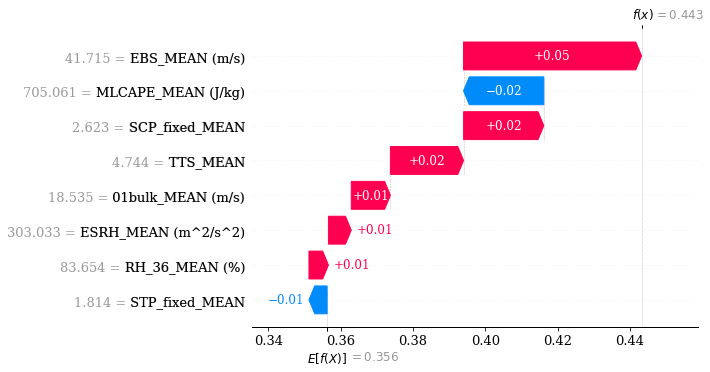

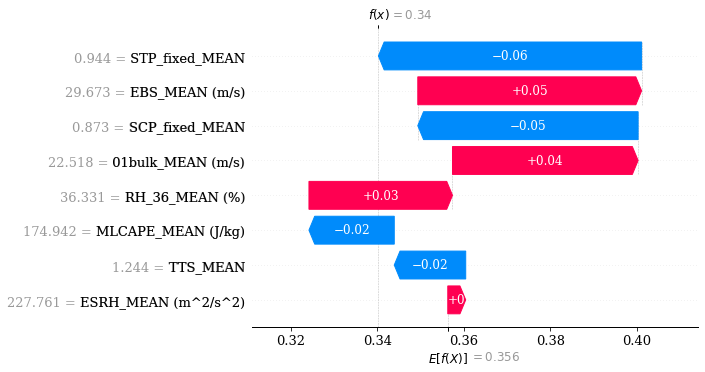

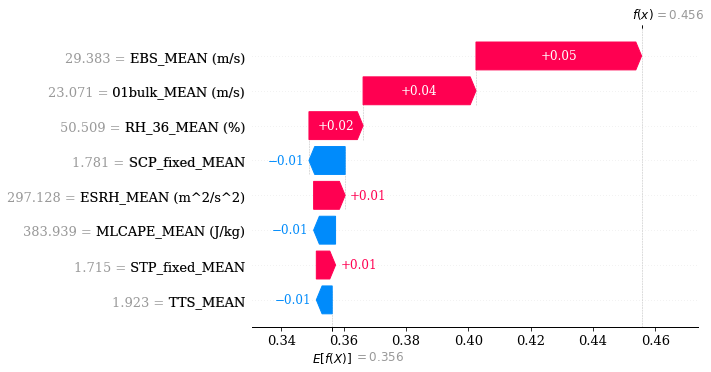

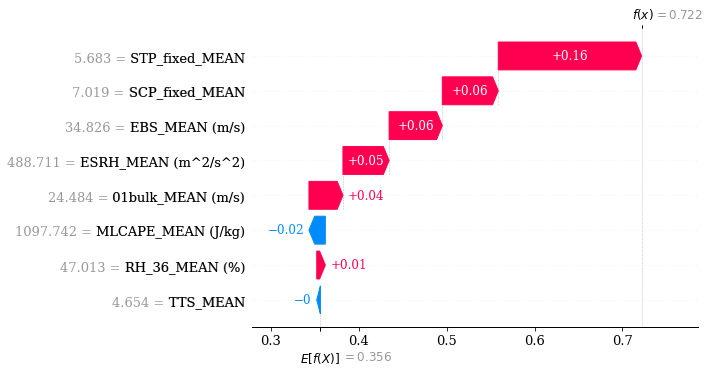

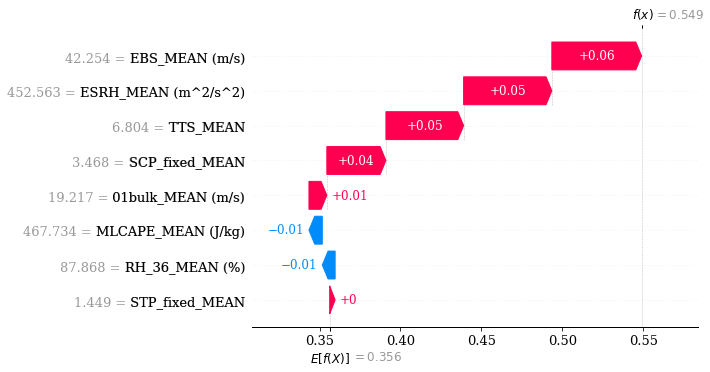

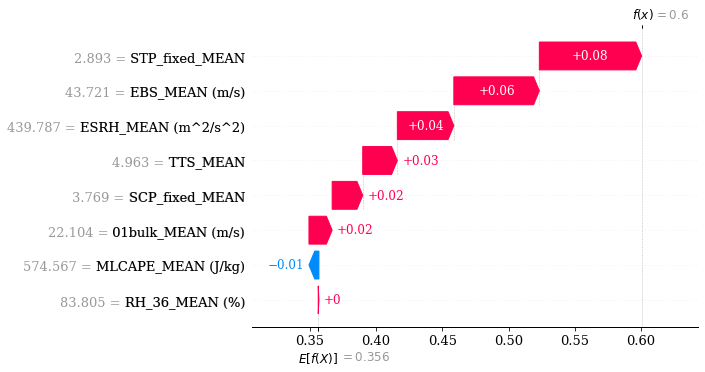

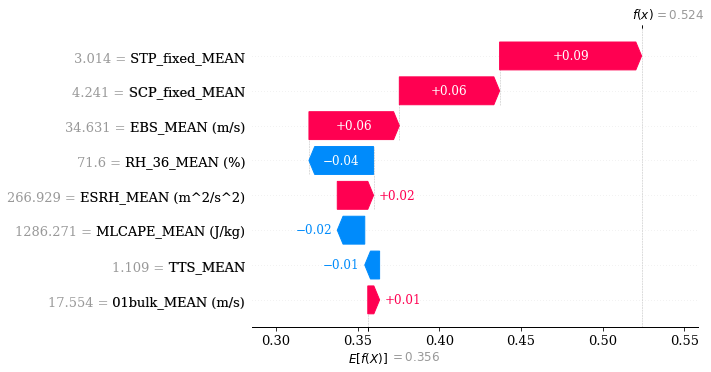

In [25]:
#SHAP plots for case study, all predictors
for b in range(0,7):
    waterfall(shap_values[b,:,1], features=cs_test_x.values[b], max_display=11)
    #plt.savefig('/data/keeling/a/msessa2/python/notebooks/SHAP/Case_Study/radar_case_'+str(i), bbox_inches='tight')


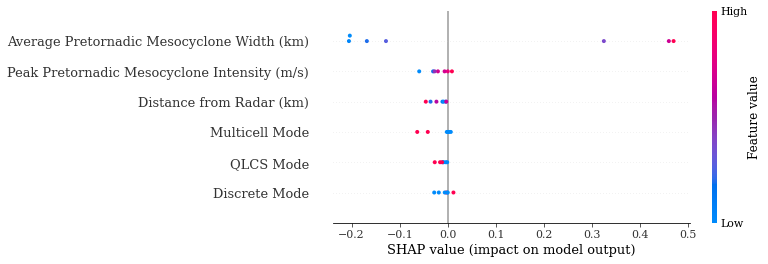

In [113]:
shap.summary_plot(shap_values[:,:,1], max_display=45)

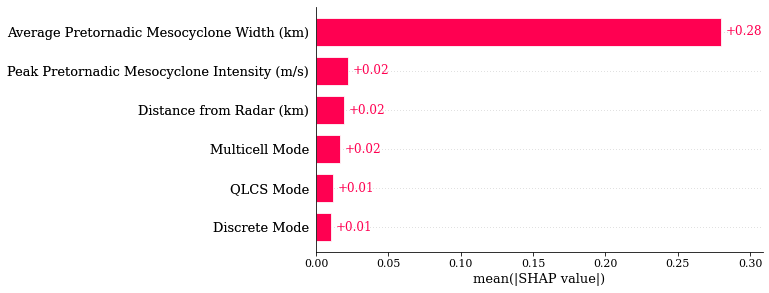

In [114]:
shap.plots.bar(shap_values[:,:,1], max_display=15)

# **Extra code for single train-test split and method exploration**

In [4]:
# Initialize and train for single train, test split
rf_model = RandomForestClassifier(n_estimators=100).fit(training_predictor, training_target_y.values.ravel())

# Predict
intensity_predict = rf_model.predict(test_predictor)
predsprob = rf_model.predict_proba(test_predictor)

In [5]:
# Check skill with confusion matrix
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(test_target_y['Binary_EF'], intensity_predict)
cnf_matrix

array([[52,  6],
       [17, 15]])

In [6]:
a = cnf_matrix[0,0]
b = cnf_matrix[0,1]
c = cnf_matrix[1,0]
d = cnf_matrix[1,1]
print('number of true positives (forecast = label = "yes"):',a)
print('number of false positives (forecast = "yes" but label = "no"):',b)
print('number of false negatives (forecast = "no" but label = "yes"):',c)
print('number of true negatives (forecast = label = "no"):',d)

number of true positives (forecast = label = "yes"): 52
number of false positives (forecast = "yes" but label = "no"): 6
number of false negatives (forecast = "no" but label = "yes"): 17
number of true negatives (forecast = label = "no"): 15


In [7]:
# Probability of Detection
POD = a/(a+c)

# Probability of False Detection
POFD = b/(b+d)

# False Alarm Ratio
FAR = b/(a+b)

# Success Ratio
SR = 1-FAR

# Frequency of Correct Nulls
FOCN = d/(c+d)

# Accuracy
Accuracy = (a+d)/(a+b+c+d)

# Critical Success Index
CSI = a/(a+b+c)

# Frequency Bias
FB = (a+b)/(c+d)

In [8]:
print(POD)
print(POFD)
print(FAR)
print(SR)
print(FOCN)
print(Accuracy)
print(CSI)
print(FB)

0.7536231884057971
0.2857142857142857
0.10344827586206896
0.896551724137931
0.46875
0.7444444444444445
0.6933333333333334
1.8125


Text(0.5, 257.44, 'Predicted label')

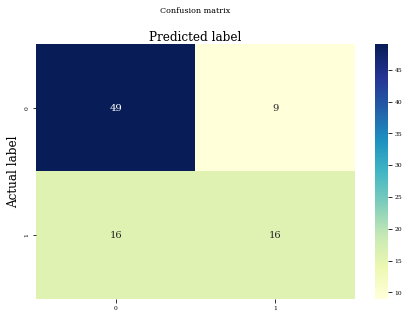

In [122]:
# Plot confusion matrix

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [9]:
import math

In [124]:
# Other performance metrics

prob0 = []
prob1 = []
for i in range(len(predsprob)):
    prob0.append(predsprob[i][0])
    prob1.append(predsprob[i][1])

#Jaccard Index, want this to be close to one
from sklearn.metrics import jaccard_score
j_index = jaccard_score(y_true=test_target['Binary_EF'],y_pred=intensity_predict)
round(j_index,2)
print('j_index:',j_index)

# F1-score
from sklearn.metrics import f1_score
f1 = f1_score(test_target['Binary_EF'], intensity_predict)
print('f1 score',f1)

# Brier skill score
##from sklearn.metrics import brier_score_loss
##log_score = brier_score_loss((test_target['fzn_or_liq'].values).reshape(-1,1), predsprob[:][0])
##print('Brier:',log_score)
from sklearn.metrics import brier_score_loss
brier_score = brier_score_loss(test_target['Binary_EF'],prob1)
print('Brier:',brier_score)

# Precision score
from sklearn.metrics import precision_score
precision_score = precision_score(test_target['Binary_EF'], intensity_predict)
print('precision score:', precision_score)

#RMSE
print(math.sqrt(metrics.mean_squared_error(y_true=test_target['Binary_EF'],y_pred=intensity_predict)))


#Accuracy
print(rf_model.score(test_predictor,test_target))

#Recall score
from sklearn.metrics import recall_score
print(recall_score(test_target['Binary_EF'], intensity_predict))

NameError: name 'test_target' is not defined

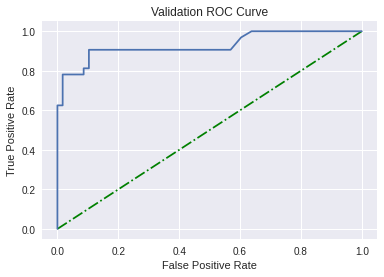

In [ ]:
false_pos_rate, true_pos_rate, thresholds = metrics.roc_curve(test_target['Binary_EF'].values, prob1)

plt.plot([0, 1], [0, 1], linestyle='-.', color='g')
plt.plot(false_pos_rate, true_pos_rate)
plt.title('Validation ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
metrics.roc_auc_score(test_target['Binary_EF'].values, predsprob[:,1])


0.9288793103448275

In [145]:
!git clone https://github.com/alburke/ams-2020-ml-python-course/Advanced_Topics_In_Machine_Learning

Cloning into 'Advanced_Topics_In_Machine_Learning'...
fatal: repository 'https://github.com/alburke/ams-2020-ml-python-course/Advanced_Topics_In_Machine_Learning/' not found


In [144]:
from ams-2020-ml-python-course/ import roc_curves
import attr_diagrams
import performance_diagrams 

SyntaxError: invalid syntax (675580912.py, line 1)

In [16]:
"""Methods for plotting attributes diagram."""

import numpy
from descartes import PolygonPatch
import shapely.geometry
import matplotlib.colors
import matplotlib.pyplot as pyplot

DEFAULT_NUM_BINS = 20
RELIABILITY_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
RELIABILITY_LINE_WIDTH = 3
PERFECT_LINE_COLOUR = numpy.full(3, 152. / 255)
PERFECT_LINE_WIDTH = 2

NO_SKILL_LINE_COLOUR = numpy.array([31, 120, 180], dtype=float) / 255
NO_SKILL_LINE_WIDTH = 2
SKILL_AREA_TRANSPARENCY = 0.2
CLIMATOLOGY_LINE_COLOUR = numpy.full(3, 152. / 255)
CLIMATOLOGY_LINE_WIDTH = 2

HISTOGRAM_FACE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
HISTOGRAM_EDGE_COLOUR = numpy.full(3, 0.)
HISTOGRAM_EDGE_WIDTH = 2

HISTOGRAM_LEFT_EDGE_COORD = 0.575
HISTOGRAM_BOTTOM_EDGE_COORD = 0.175
HISTOGRAM_WIDTH = 0.3
HISTOGRAM_HEIGHT = 0.3

HISTOGRAM_X_TICK_VALUES = numpy.linspace(0, 1, num=6, dtype=float)
HISTOGRAM_Y_TICK_SPACING = 0.1

FIGURE_WIDTH_INCHES = 15
FIGURE_HEIGHT_INCHES = 15

FONT_SIZE = 30
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _get_histogram(input_values, num_bins, min_value, max_value):
    """Creates histogram with uniform bin-spacing.
    E = number of input values
    B = number of bins
    :param input_values: length-E numpy array of values to bin.
    :param num_bins: Number of bins (B).
    :param min_value: Minimum value.  Any input value < `min_value` will be
        assigned to the first bin.
    :param max_value: Max value.  Any input value > `max_value` will be
        assigned to the last bin.
    :return: inputs_to_bins: length-E numpy array of bin indices (integers).
    """

    bin_cutoffs = numpy.linspace(min_value, max_value, num=num_bins + 1)
    inputs_to_bins = numpy.digitize(
        input_values, bin_cutoffs, right=False) - 1

    inputs_to_bins[inputs_to_bins < 0] = 0
    inputs_to_bins[inputs_to_bins > num_bins - 1] = num_bins - 1

    return inputs_to_bins


def _get_points_in_relia_curve(
        observed_labels, forecast_probabilities, num_bins):
    """Creates points for reliability curve.
    The reliability curve is the main component of the attributes diagram.
    E = number of examples
    B = number of bins
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param num_bins: Number of bins for forecast probability.
    :return: mean_forecast_probs: length-B numpy array of mean forecast
        probabilities.
    :return: mean_event_frequencies: length-B numpy array of conditional mean
        event frequencies.  mean_event_frequencies[j] = frequency of label 1
        when forecast probability is in the [j]th bin.
    :return: num_examples_by_bin: length-B numpy array with number of examples
        in each forecast bin.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    assert num_bins > 1

    inputs_to_bins = _get_histogram(
        input_values=forecast_probabilities, num_bins=num_bins, min_value=0.,
        max_value=1.)

    mean_forecast_probs = numpy.full(num_bins, numpy.nan)
    mean_event_frequencies = numpy.full(num_bins, numpy.nan)
    num_examples_by_bin = numpy.full(num_bins, -1, dtype=int)

    for k in range(num_bins):
        these_example_indices = numpy.where(inputs_to_bins == k)[0]
        num_examples_by_bin[k] = len(these_example_indices)

        mean_forecast_probs[k] = numpy.mean(
            forecast_probabilities[these_example_indices])

        mean_event_frequencies[k] = numpy.mean(
            observed_labels[these_example_indices].astype(float)
        )

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin


def _vertices_to_polygon_object(x_vertices, y_vertices):
    """Converts two arrays of vertices to `shapely.geometry.Polygon` object.
    V = number of vertices
    This method allows for simple polygons only (no disjoint polygons, no
    holes).
    :param x_vertices: length-V numpy array of x-coordinates.
    :param y_vertices: length-V numpy array of y-coordinates.
    :return: polygon_object: Instance of `shapely.geometry.Polygon`.
    """

    list_of_vertices = []
    for i in range(len(x_vertices)):
        list_of_vertices.append((x_vertices[i], y_vertices[i]))

    return shapely.geometry.Polygon(shell=list_of_vertices)


def _plot_background(axes_object, observed_labels):
    """Plots background of attributes diagram.
    E = number of examples
    :param axes_object: Instance of `matplotlib.axes._subplots.AxesSubplot`.
        Will plot on these axes.
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    """

    # Plot positive-skill area.
    climatology = numpy.mean(observed_labels.astype(float))
    skill_area_colour = matplotlib.colors.to_rgba(
        NO_SKILL_LINE_COLOUR, SKILL_AREA_TRANSPARENCY)

    x_vertices_left = numpy.array([0, climatology, climatology, 0, 0])
    y_vertices_left = numpy.array([0, 0, climatology, climatology / 2, 0])

    left_polygon_object = _vertices_to_polygon_object(
        x_vertices=x_vertices_left, y_vertices=y_vertices_left)
    left_polygon_patch = PolygonPatch(
        left_polygon_object, lw=0, ec=skill_area_colour, fc=skill_area_colour)
    axes_object.add_patch(left_polygon_patch)

    x_vertices_right = numpy.array(
        [climatology, 1, 1, climatology, climatology])
    y_vertices_right = numpy.array(
        [climatology, (1 + climatology) / 2, 1, 1, climatology])

    right_polygon_object = _vertices_to_polygon_object(
        x_vertices=x_vertices_right, y_vertices=y_vertices_right)
    right_polygon_patch = PolygonPatch(
        right_polygon_object, lw=0, ec=skill_area_colour, fc=skill_area_colour)
    axes_object.add_patch(right_polygon_patch)

    # Plot no-skill line (at edge of positive-skill area).
    no_skill_x_coords = numpy.array([0, 1], dtype=float)
    no_skill_y_coords = numpy.array([climatology, 1 + climatology]) / 2
    axes_object.plot(
        no_skill_x_coords, no_skill_y_coords, color=NO_SKILL_LINE_COLOUR,
        linestyle='solid', linewidth=NO_SKILL_LINE_WIDTH)

    # Plot climatology line (vertical).
    climo_line_x_coords = numpy.full(2, climatology)
    climo_line_y_coords = numpy.array([0, 1], dtype=float)
    axes_object.plot(
        climo_line_x_coords, climo_line_y_coords, color=CLIMATOLOGY_LINE_COLOUR,
        linestyle='dashed', linewidth=CLIMATOLOGY_LINE_WIDTH)

    # Plot no-resolution line (horizontal).
    no_resolution_x_coords = climo_line_y_coords + 0.
    no_resolution_y_coords = climo_line_x_coords + 0.
    axes_object.plot(
        no_resolution_x_coords, no_resolution_y_coords,
        color=CLIMATOLOGY_LINE_COLOUR, linestyle='dashed',
        linewidth=CLIMATOLOGY_LINE_WIDTH)


def _floor_to_nearest(input_value_or_array, increment):
    """Rounds number(s) down to the nearest multiple of `increment`.
    :param input_value_or_array: Input (either scalar or numpy array).
    :param increment: Increment (or rounding base -- whatever you want to call
        it).
    :return: output_value_or_array: Rounded version of `input_value_or_array`.
    """

    return increment * numpy.floor(input_value_or_array / increment)


def _plot_forecast_histogram(figure_object, num_examples_by_bin):
    """Plots forecast histogram as inset in the attributes diagram.
    B = number of bins
    :param figure_object: Instance of `matplotlib.figure.Figure`.  Will plot in
        this figure.
    :param num_examples_by_bin: length-B numpy array, where
        num_examples_by_bin[j] = number of examples in [j]th forecast bin.
    """

    num_bins = len(num_examples_by_bin)
    bin_frequencies = (
        num_examples_by_bin.astype(float) / numpy.sum(num_examples_by_bin)
    )

    forecast_bin_edges = numpy.linspace(0, 1, num=num_bins + 1, dtype=float)
    forecast_bin_width = forecast_bin_edges[1] - forecast_bin_edges[0]
    forecast_bin_centers = forecast_bin_edges[:-1] + forecast_bin_width / 2

    inset_axes_object = figure_object.add_axes(
        [HISTOGRAM_LEFT_EDGE_COORD, HISTOGRAM_BOTTOM_EDGE_COORD,
         HISTOGRAM_WIDTH, HISTOGRAM_HEIGHT]
    )

    inset_axes_object.bar(
        forecast_bin_centers, bin_frequencies, forecast_bin_width,
        color=HISTOGRAM_FACE_COLOUR, edgecolor=HISTOGRAM_EDGE_COLOUR,
        linewidth=HISTOGRAM_EDGE_WIDTH)

    max_y_tick_value = _floor_to_nearest(
        1.05 * numpy.max(bin_frequencies), HISTOGRAM_Y_TICK_SPACING)
    num_y_ticks = 1 + int(numpy.round(
        max_y_tick_value / HISTOGRAM_Y_TICK_SPACING
    ))

    y_tick_values = numpy.linspace(0, max_y_tick_value, num=num_y_ticks)
    pyplot.yticks(y_tick_values, axes=inset_axes_object)
    pyplot.xticks(HISTOGRAM_X_TICK_VALUES, axes=inset_axes_object)

    inset_axes_object.set_xlim(0, 1)
    inset_axes_object.set_ylim(0, 1.05 * numpy.max(bin_frequencies))


def plot_reliability_curve(
        observed_labels, forecast_probabilities, num_bins=DEFAULT_NUM_BINS,
        axes_object=None):
    """Plots reliability curve.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param num_bins: Number of bins for forecast probability.
    :param axes_object: Instance of `matplotlib.axes._subplots.AxesSubplot`.
        Will plot on these axes.
    :return: mean_forecast_probs: See doc for `_get_points_in_relia_curve`.
    :return: mean_event_frequencies: Same.
    :return: num_examples_by_bin: Same.
    """

    mean_forecast_probs, mean_event_frequencies, num_examples_by_bin = (
        _get_points_in_relia_curve(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities, num_bins=num_bins)
    )

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    perfect_x_coords = numpy.array([0, 1], dtype=float)
    perfect_y_coords = perfect_x_coords + 0.
    axes_object.plot(
        perfect_x_coords, perfect_y_coords, color=PERFECT_LINE_COLOUR,
        linestyle='dashed', linewidth=PERFECT_LINE_WIDTH)

    real_indices = numpy.where(numpy.invert(numpy.logical_or(
        numpy.isnan(mean_forecast_probs), numpy.isnan(mean_event_frequencies)
    )))[0]

    axes_object.plot(
        mean_forecast_probs[real_indices], mean_event_frequencies[real_indices],
        color=RELIABILITY_LINE_COLOUR,
        linestyle='solid', linewidth=RELIABILITY_LINE_WIDTH)

    axes_object.set_xlabel('Forecast probability')
    axes_object.set_ylabel('Conditional event frequency')
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin


def plot_attributes_diagram(
        observed_labels, forecast_probabilities, num_bins=DEFAULT_NUM_BINS, figure_object=None, axes_object=None):
    """Plots attributes diagram.
    :param observed_labels: See doc for `plot_reliability_curve`.
    :param forecast_probabilities: Same.
    :param num_bins: Same.
    :return: mean_forecast_probs: See doc for `_get_points_in_relia_curve`.
    :return: mean_event_frequencies: Same.
    :return: num_examples_by_bin: Same.
    """

    mean_forecast_probs, mean_event_frequencies, num_examples_by_bin = (
        _get_points_in_relia_curve(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities, num_bins=num_bins)
    )

    figure_object, axes_object = pyplot.subplots(
        1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
    )

    _plot_background(axes_object=axes_object, observed_labels=observed_labels)
    #_plot_forecast_histogram(figure_object=figure_object,
    #                         num_examples_by_bin=num_examples_by_bin)

    plot_reliability_curve(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities, num_bins=num_bins,
        axes_object=axes_object)

    return mean_forecast_probs, mean_event_frequencies, num_examples_by_bin

import numpy
import matplotlib.colors
import matplotlib.pyplot as pyplot

DEFAULT_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
DEFAULT_LINE_WIDTH = 3
DEFAULT_BIAS_LINE_COLOUR = numpy.full(3, 152. / 255)
DEFAULT_BIAS_LINE_WIDTH = 2

LEVELS_FOR_CSI_CONTOURS = numpy.linspace(0, 1, num=11, dtype=float)
LEVELS_FOR_BIAS_CONTOURS = numpy.array(
    [0.25, 0.5, 0.75, 1., 1.5, 2., 3., 5.])

BIAS_STRING_FORMAT = '%.2f'
BIAS_LABEL_PADDING_PX = 10

FIGURE_WIDTH_INCHES = 10
FIGURE_HEIGHT_INCHES = 10

FONT_SIZE = 20
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _get_sr_pod_grid(success_ratio_spacing=0.01, pod_spacing=0.01):
    """Creates grid in SR-POD (success ratio / probability of detection) space.
    M = number of rows (unique POD values) in grid
    N = number of columns (unique success ratios) in grid
    :param success_ratio_spacing: Spacing between grid cells in adjacent
        columns.
    :param pod_spacing: Spacing between grid cells in adjacent rows.
    :return: success_ratio_matrix: M-by-N numpy array of success ratios.
        Success ratio increases with column index.
    :return: pod_matrix: M-by-N numpy array of POD values.  POD decreases with
        row index.
    """

    num_success_ratios = 1 + int(numpy.ceil(1. / success_ratio_spacing))
    num_pod_values = 1 + int(numpy.ceil(1. / pod_spacing))

    unique_success_ratios = numpy.linspace(0., 1., num=num_success_ratios)
    unique_pod_values = numpy.linspace(0., 1., num=num_pod_values)[::-1]
    return numpy.meshgrid(unique_success_ratios, unique_pod_values)


def _csi_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes CSI (critical success index) from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: csi_array: numpy array (same shape) of CSI values.
    """

    return (success_ratio_array ** -1 + pod_array ** -1 - 1.) ** -1


def _bias_from_sr_and_pod(success_ratio_array, pod_array):
    """Computes frequency bias from success ratio and POD.
    POD = probability of detection
    :param success_ratio_array: numpy array (any shape) of success ratios.
    :param pod_array: numpy array (same shape) of POD values.
    :return: frequency_bias_array: numpy array (same shape) of frequency biases.
    """

    return pod_array / success_ratio_array


def _get_csi_colour_scheme():
    """Returns colour scheme for CSI (critical success index).
    :return: colour_map_object: Colour scheme (instance of
        `matplotlib.colors.ListedColormap`).
    :return: colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.
    """

    this_colour_map_object = pyplot.cm.Blues
    this_colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, this_colour_map_object.N)

    rgba_matrix = this_colour_map_object(this_colour_norm_object(
        LEVELS_FOR_CSI_CONTOURS))
    colour_list = [
        rgba_matrix[i, ..., :-1] for i in range(rgba_matrix.shape[0])
    ]

    colour_map_object = matplotlib.colors.ListedColormap(colour_list)
    colour_map_object.set_under(numpy.array([1, 1, 1]))
    colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_CSI_CONTOURS, colour_map_object.N)

    return colour_map_object, colour_norm_object


def _add_colour_bar(
        axes_object, colour_map_object, values_to_colour, min_colour_value,
        max_colour_value, colour_norm_object=None,
        orientation_string='vertical', extend_min=True, extend_max=True,
        fraction_of_axis_length=1., font_size=FONT_SIZE):
    """Adds colour bar to existing axes.
    :param axes_object: Existing axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).
    :param colour_map_object: Colour scheme (instance of
        `matplotlib.pyplot.cm`).
    :param values_to_colour: numpy array of values to colour.
    :param min_colour_value: Minimum value in colour map.
    :param max_colour_value: Max value in colour map.
    :param colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.  If `colour_norm_object is None`,
        will assume that scale is linear.
    :param orientation_string: Orientation of colour bar ("vertical" or
        "horizontal").
    :param extend_min: Boolean flag.  If True, the bottom of the colour bar will
        have an arrow.  If False, it will be a flat line, suggesting that lower
        values are not possible.
    :param extend_max: Same but for top of colour bar.
    :param fraction_of_axis_length: Fraction of axis length (y-axis if
        orientation is "vertical", x-axis if orientation is "horizontal")
        occupied by colour bar.
    :param font_size: Font size for labels on colour bar.
    :return: colour_bar_object: Colour bar (instance of
        `matplotlib.pyplot.colorbar`) created by this method.
    """

    if colour_norm_object is None:
        colour_norm_object = matplotlib.colors.Normalize(
            vmin=min_colour_value, vmax=max_colour_value, clip=False)

    scalar_mappable_object = pyplot.cm.ScalarMappable(
        cmap=colour_map_object, norm=colour_norm_object)
    scalar_mappable_object.set_array(values_to_colour)

    if extend_min and extend_max:
        extend_string = 'both'
    elif extend_min:
        extend_string = 'min'
    elif extend_max:
        extend_string = 'max'
    else:
        extend_string = 'neither'

    if orientation_string == 'horizontal':
        padding = 0.075
    else:
        padding = 0.05

    colour_bar_object = pyplot.colorbar(
        ax=axes_object, mappable=scalar_mappable_object,
        orientation=orientation_string, pad=padding, extend=extend_string,
        shrink=fraction_of_axis_length)

    colour_bar_object.ax.tick_params(labelsize=font_size)
    return colour_bar_object


def get_points_in_perf_diagram(observed_labels, forecast_probabilities):
    """Creates points for performance diagram.
    E = number of examples
    T = number of binarization thresholds
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :return: pod_by_threshold: length-T numpy array of POD (probability of
        detection) values.
    :return: success_ratio_by_threshold: length-T numpy array of success ratios.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    observed_labels = observed_labels.astype(int)
    binarization_thresholds = numpy.linspace(0, 1, num=1001, dtype=float)

    num_thresholds = len(binarization_thresholds)
    pod_by_threshold = numpy.full(num_thresholds, numpy.nan)
    success_ratio_by_threshold = numpy.full(num_thresholds, numpy.nan)

    for k in range(num_thresholds):
        these_forecast_labels = (
            forecast_probabilities >= binarization_thresholds[k]
        ).astype(int)

        this_num_hits = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 1
        ))

        this_num_false_alarms = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 0
        ))

        this_num_misses = numpy.sum(numpy.logical_and(
            these_forecast_labels == 0, observed_labels == 1
        ))

        try:
            pod_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_misses)
            )
        except ZeroDivisionError:
            pass

        try:
            success_ratio_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_false_alarms)
            )
        except ZeroDivisionError:
            pass

    pod_by_threshold = numpy.array([1.] + pod_by_threshold.tolist() + [0.])
    success_ratio_by_threshold = numpy.array(
        [0.] + success_ratio_by_threshold.tolist() + [1.]
    )

    return pod_by_threshold, success_ratio_by_threshold


def plot_performance_diagram(
        observed_labels, forecast_probabilities,
        line_colour=DEFAULT_LINE_COLOUR, line_width=DEFAULT_LINE_WIDTH,
        bias_line_colour=DEFAULT_BIAS_LINE_COLOUR,
        bias_line_width=DEFAULT_BIAS_LINE_WIDTH, axes_object=None):
    """Plots performance diagram.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param line_colour: Colour (in any format accepted by `matplotlib.colors`).
    :param line_width: Line width (real positive number).
    :param bias_line_colour: Colour of contour lines for frequency bias.
    :param bias_line_width: Width of contour lines for frequency bias.
    :param axes_object: Will plot on these axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).  If `axes_object is None`,
        will create new axes.
    :return: pod_by_threshold: See doc for `get_points_in_perf_diagram`.
        detection) values.
    :return: success_ratio_by_threshold: Same.
    """

    pod_by_threshold, success_ratio_by_threshold = get_points_in_perf_diagram(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities)

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    success_ratio_matrix, pod_matrix = _get_sr_pod_grid()
    csi_matrix = _csi_from_sr_and_pod(success_ratio_matrix, pod_matrix)
    frequency_bias_matrix = _bias_from_sr_and_pod(
        success_ratio_matrix, pod_matrix)

    this_colour_map_object, this_colour_norm_object = _get_csi_colour_scheme()

    pyplot.contourf(
        success_ratio_matrix, pod_matrix, csi_matrix, LEVELS_FOR_CSI_CONTOURS,
        cmap=this_colour_map_object, norm=this_colour_norm_object, vmin=0.,
        vmax=1., axes=axes_object)

    colour_bar_object = _add_colour_bar(
        axes_object=axes_object, colour_map_object=this_colour_map_object,
        colour_norm_object=this_colour_norm_object,
        values_to_colour=csi_matrix, min_colour_value=0.,
        max_colour_value=1., orientation_string='vertical',
        extend_min=False, extend_max=False)
    colour_bar_object.set_label('CSI (critical success index)')

    bias_colour_tuple = ()
    for _ in range(len(LEVELS_FOR_BIAS_CONTOURS)):
        bias_colour_tuple += (bias_line_colour,)

    bias_contour_object = pyplot.contour(
        success_ratio_matrix, pod_matrix, frequency_bias_matrix,
        LEVELS_FOR_BIAS_CONTOURS, colors=bias_colour_tuple,
        linewidths=bias_line_width, linestyles='dashed', axes=axes_object)
    pyplot.clabel(
        bias_contour_object, inline=True, inline_spacing=BIAS_LABEL_PADDING_PX,
        fmt=BIAS_STRING_FORMAT, fontsize=FONT_SIZE)

    nan_flags = numpy.logical_or(
        numpy.isnan(success_ratio_by_threshold), numpy.isnan(pod_by_threshold)
    )

    if not numpy.all(nan_flags):
        real_indices = numpy.where(numpy.invert(nan_flags))[0]
        axes_object.plot(
            success_ratio_by_threshold[real_indices],
            pod_by_threshold[real_indices], color=line_colour,
            linestyle='solid', linewidth=line_width)

    axes_object.set_xlabel('Success ratio (1 - FAR)')
    axes_object.set_ylabel('POD (probability of detection)')
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)

    return pod_by_threshold, success_ratio_by_threshold

import numpy
import matplotlib.colors
import matplotlib.pyplot as pyplot
#import performance_diagrams

DEFAULT_LINE_COLOUR = numpy.array([228, 26, 28], dtype=float) / 255
DEFAULT_LINE_WIDTH = 3
DEFAULT_RANDOM_LINE_COLOUR = numpy.full(3, 152. / 255)
DEFAULT_RANDOM_LINE_WIDTH = 2

LEVELS_FOR_PEIRCE_CONTOURS = numpy.linspace(0, 1, num=11, dtype=float)

FIGURE_WIDTH_INCHES = 10
FIGURE_HEIGHT_INCHES = 10

FONT_SIZE = 20
pyplot.rc('font', size=FONT_SIZE)
pyplot.rc('axes', titlesize=FONT_SIZE)
pyplot.rc('axes', labelsize=FONT_SIZE)
pyplot.rc('xtick', labelsize=FONT_SIZE)
pyplot.rc('ytick', labelsize=FONT_SIZE)
pyplot.rc('legend', fontsize=FONT_SIZE)
pyplot.rc('figure', titlesize=FONT_SIZE)


def _get_pofd_pod_grid(pofd_spacing=0.01, pod_spacing=0.01):
    """Creates grid in POFD-POD space.
    M = number of rows (unique POD values) in grid
    N = number of columns (unique POFD values) in grid
    :param pofd_spacing: Spacing between grid cells in adjacent columns.
    :param pod_spacing: Spacing between grid cells in adjacent rows.
    :return: pofd_matrix: M-by-N numpy array of POFD values.
    :return: pod_matrix: M-by-N numpy array of POD values.
    """

    num_pofd_values = 1 + int(numpy.ceil(1. / pofd_spacing))
    num_pod_values = 1 + int(numpy.ceil(1. / pod_spacing))

    unique_pofd_values = numpy.linspace(0., 1., num=num_pofd_values)
    unique_pod_values = numpy.linspace(0., 1., num=num_pod_values)[::-1]
    return numpy.meshgrid(unique_pofd_values, unique_pod_values)


def _get_peirce_colour_scheme():
    """Returns colour scheme for Peirce score.
    :return: colour_map_object: Colour scheme (instance of
        `matplotlib.colors.ListedColormap`).
    :return: colour_norm_object: Instance of `matplotlib.colors.BoundaryNorm`,
        defining the scale of the colour map.
    """

    this_colour_map_object = pyplot.cm.Blues
    this_colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_PEIRCE_CONTOURS, this_colour_map_object.N)

    rgba_matrix = this_colour_map_object(this_colour_norm_object(
        LEVELS_FOR_PEIRCE_CONTOURS
    ))

    colour_list = [
        rgba_matrix[i, ..., :-1] for i in range(rgba_matrix.shape[0])
    ]

    colour_map_object = matplotlib.colors.ListedColormap(colour_list)
    colour_map_object.set_under(numpy.array([1, 1, 1]))
    colour_norm_object = matplotlib.colors.BoundaryNorm(
        LEVELS_FOR_PEIRCE_CONTOURS, colour_map_object.N)

    return colour_map_object, colour_norm_object


def get_points_in_roc_curve(observed_labels, forecast_probabilities):
    """Creates points for ROC curve.
    E = number of examples
    T = number of binarization thresholds
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :return: pofd_by_threshold: length-T numpy array of POFD (probability of
        false detection) values.
    :return: pod_by_threshold: length-T numpy array of POD (probability of
        detection) values.
    """

    assert numpy.all(numpy.logical_or(
        observed_labels == 0, observed_labels == 1
    ))

    assert numpy.all(numpy.logical_and(
        forecast_probabilities >= 0, forecast_probabilities <= 1
    ))

    observed_labels = observed_labels.astype(int)
    binarization_thresholds = numpy.linspace(0, 1, num=1001, dtype=float)

    num_thresholds = len(binarization_thresholds)
    pofd_by_threshold = numpy.full(num_thresholds, numpy.nan)
    pod_by_threshold = numpy.full(num_thresholds, numpy.nan)

    for k in range(num_thresholds):
        these_forecast_labels = (
            forecast_probabilities >= binarization_thresholds[k]
        ).astype(int)

        this_num_hits = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 1
        ))

        this_num_false_alarms = numpy.sum(numpy.logical_and(
            these_forecast_labels == 1, observed_labels == 0
        ))

        this_num_misses = numpy.sum(numpy.logical_and(
            these_forecast_labels == 0, observed_labels == 1
        ))

        this_num_correct_nulls = numpy.sum(numpy.logical_and(
            these_forecast_labels == 0, observed_labels == 0
        ))

        try:
            pofd_by_threshold[k] = (
                float(this_num_false_alarms) /
                (this_num_false_alarms + this_num_correct_nulls)
            )
        except ZeroDivisionError:
            pass

        try:
            pod_by_threshold[k] = (
                float(this_num_hits) / (this_num_hits + this_num_misses)
            )
        except ZeroDivisionError:
            pass

    pod_by_threshold = numpy.array([1.] + pod_by_threshold.tolist() + [0.])
    pofd_by_threshold = numpy.array([1.] + pofd_by_threshold.tolist() + [0.])

    return pofd_by_threshold, pod_by_threshold


def plot_roc_curve(
        observed_labels, forecast_probabilities,
        line_colour=DEFAULT_LINE_COLOUR, line_width=DEFAULT_LINE_WIDTH,
        random_line_colour=DEFAULT_RANDOM_LINE_COLOUR,
        random_line_width=DEFAULT_RANDOM_LINE_WIDTH, axes_object=None):
    """Plots ROC curve.
    E = number of examples
    :param observed_labels: length-E numpy array of class labels (integers in
        0...1).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of label = 1.
    :param line_colour: Colour (in any format accepted by `matplotlib.colors`).
    :param line_width: Line width (real positive number).
    :param random_line_colour: Colour of reference line (ROC curve for random
        predictor).
    :param random_line_width: Width of reference line (ROC curve for random
        predictor).
    :param axes_object: Will plot on these axes (instance of
        `matplotlib.axes._subplots.AxesSubplot`).  If `axes_object is None`,
        will create new axes.
    :return: pofd_by_threshold: See doc for `get_points_in_roc_curve`.
    :return: pod_by_threshold: Same.
    """

    pofd_by_threshold, pod_by_threshold = get_points_in_roc_curve(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities)

    if axes_object is None:
        _, axes_object = pyplot.subplots(
            1, 1, figsize=(FIGURE_WIDTH_INCHES, FIGURE_HEIGHT_INCHES)
        )

    pofd_matrix, pod_matrix = _get_pofd_pod_grid()
    peirce_score_matrix = pod_matrix - pofd_matrix

    colour_map_object, colour_norm_object = _get_peirce_colour_scheme()

    pyplot.contourf(
        pofd_matrix, pod_matrix, peirce_score_matrix,
        LEVELS_FOR_PEIRCE_CONTOURS, cmap=colour_map_object,
        norm=colour_norm_object, vmin=0., vmax=1., axes=axes_object)

    # TODO(thunderhoser): Calling private method is a HACK.
    colour_bar_object = _add_colour_bar(
        axes_object=axes_object, colour_map_object=colour_map_object,
        colour_norm_object=colour_norm_object,
        values_to_colour=peirce_score_matrix, min_colour_value=0.,
        max_colour_value=1., orientation_string='vertical',
        extend_min=False, extend_max=False)

    print(colour_bar_object)
    colour_bar_object.set_label('Peirce score')

    random_x_coords = numpy.array([0., 1.])
    random_y_coords = numpy.array([0., 1.])
    axes_object.plot(
        random_x_coords, random_y_coords, color=random_line_colour,
        linestyle='dashed', linewidth=random_line_width)

    nan_flags = numpy.logical_or(
        numpy.isnan(pofd_by_threshold), numpy.isnan(pod_by_threshold)
    )

    if not numpy.all(nan_flags):
        real_indices = numpy.where(numpy.invert(nan_flags))[0]
        axes_object.plot(
            pofd_by_threshold[real_indices], pod_by_threshold[real_indices],
            color=line_colour, linestyle='solid', linewidth=line_width)

    axes_object.set_xlabel('POFD (probability of false detection)')
    axes_object.set_ylabel('POD (probability of detection)')
    axes_object.set_xlim(0., 1.)
    axes_object.set_ylim(0., 1.)

    return pofd_by_threshold, pod_by_threshold

Mean of empty slice.
invalid value encountered in double_scalars
The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
Mean of empty slice.
invalid value encountered in double_scalars


(array([0.028     , 0.06333333, 0.1275    , 0.18      , 0.225     ,
        0.28142857, 0.32666667, 0.374     , 0.42142857, 0.46142857,
        0.51857143, 0.58      , 0.62166667, 0.662     ,        nan,
        0.75      , 0.835     ,        nan,        nan,        nan]),
 array([0.        , 0.        , 0.125     , 0.        , 0.25      ,
        0.28571429, 0.25      , 0.8       , 0.42857143, 0.14285714,
        0.42857143, 0.5       , 0.66666667, 1.        ,        nan,
        1.        , 1.        ,        nan,        nan,        nan]),
 array([ 5,  3,  8,  5,  8,  7, 12,  5,  7,  7,  7,  2,  6,  5,  0,  1,  2,
         0,  0,  0]))

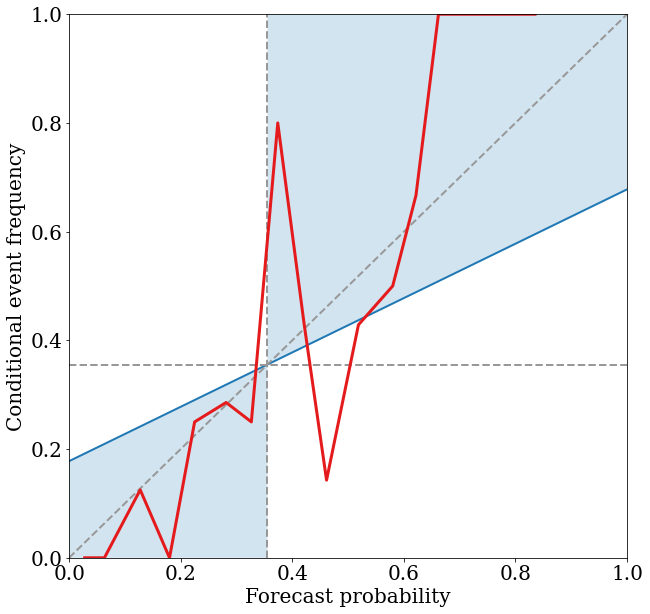

In [10]:
plot_attributes_diagram(test_target_y['Binary_EF'].values,predsprob[:,1])

In [141]:
# Performance Diagram
!pip install keras scikit-image netcdf4 pyproj scikit-learn opencv-python matplotlib shapely geopy metpy descartes
!rm -rf course_repository
!git clone -b add-ML-code https://github.com/swnesbitt/ams-2020-ml-python-course course_repository

Cloning into 'course_repository'...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 421 (delta 28), reused 35 (delta 10), pack-reused 352
Receiving objects: 100% (421/421), 105.13 MiB | 45.66 MiB/s, done.
Resolving deltas: 100% (221/221), done.


In [148]:
%matplotlib inline
import sys
#sys.path.append('/content/course_repository/Introduction_To_Machine_Learning/Lecture_2/')
sys.path.append('/content/course_repository/Introduction_To_Machine_Learning/Supervised_Learning_Algorithims/')

#sys.path.append('/content/course_repository/')
import copy
import warnings
import numpy
import matplotlib.pyplot as pyplot
import utils
import roc_curves
import attr_diagrams
import performance_diagrams 


warnings.filterwarnings('ignore')
DEFAULT_FEATURE_DIR_NAME = ('./data/track_data_ncar_ams_3km_csv_small')
SEPARATOR_STRING = '\n\n' + '*' * 50 + '\n\n'
MINOR_SEPARATOR_STRING = '\n\n' + '-' * 50 + '\n\n'

MODULE2_DIR_NAME = '.'
SHORT_COURSE_DIR_NAME = '..'

ModuleNotFoundError: No module named 'utils'

In [11]:
training_event_frequency = np.mean(
    training_target_y['Binary_EF'].values)

In [12]:
training_event_frequency

0.3523809523809524

In [67]:
MAX_PEIRCE_SCORE_KEY = 'max_peirce_score'
AUC_KEY = 'area_under_roc_curve'
MAX_CSI_KEY = 'max_csi'
BRIER_SCORE_KEY = 'brier_score'
BRIER_SKILL_SCORE_KEY = 'brier_skill_score'
DEFAULT_FIG_WIDTH_INCHES = 10
DEFAULT_FIG_HEIGHT_INCHES = 10
SMALL_FIG_WIDTH_INCHES = 10
SMALL_FIG_HEIGHT_INCHES = 10
FIGURE_RESOLUTION_DPI = 300

BAR_GRAPH_COLOUR = numpy.array([27, 158, 119], dtype=float) / 255
BAR_GRAPH_EDGE_WIDTH = 2
BAR_GRAPH_FONT_SIZE = 14
BAR_GRAPH_FONT_COLOUR = numpy.array([217, 95, 2], dtype=float) / 255

FONT_SIZE = 20
def eval_binary_classifn2(
        observed_labels, forecast_probabilities, training_event_frequency,
        verbose=True, create_plots=True, dataset_name=None):
    """Evaluates binary-classification model.

    E = number of examples

    :param observed_labels: length-E numpy array of observed labels (integers in
        0...1, where 1 means that event occurred).
    :param forecast_probabilities: length-E numpy array with forecast
        probabilities of event (positive class).
    :param training_event_frequency: Frequency of event in training data.
    :param verbose: Boolean flag.  If True, will print results to command
        window.
    :param create_plots: Boolean flag.  If True, will create plots.
    :param dataset_name: Dataset name (e.g., "validation").  Used only if
        `create_plots == True or verbose == True`.
    """

    pofd_by_threshold, pod_by_threshold = get_points_in_roc_curve(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities)

    max_peirce_score = numpy.nanmax(pod_by_threshold - pofd_by_threshold)
    area_under_roc_curve = sklearn.metrics.auc(
        x=pofd_by_threshold, y=pod_by_threshold)

    pod_by_threshold, success_ratio_by_threshold = (
        get_points_in_perf_diagram(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities)
    )

    csi_by_threshold = (
        (pod_by_threshold ** -1 + success_ratio_by_threshold ** -1 - 1) ** -1
    )
    max_csi = numpy.nanmax(csi_by_threshold)

    mean_forecast_by_bin, event_freq_by_bin, num_examples_by_bin = (
        _get_points_in_relia_curve(
            observed_labels=observed_labels,
            forecast_probabilities=forecast_probabilities, num_bins=20)
    )

    uncertainty = training_event_frequency * (1. - training_event_frequency)

    this_numerator = numpy.nansum(
        num_examples_by_bin *
        (mean_forecast_by_bin - event_freq_by_bin) ** 2
    )
    reliability = this_numerator / numpy.sum(num_examples_by_bin)

    this_numerator = numpy.nansum(
        num_examples_by_bin *
        (event_freq_by_bin - training_event_frequency) ** 2
    )
    resolution = this_numerator / numpy.sum(num_examples_by_bin)

    brier_score = uncertainty + reliability - resolution
    brier_skill_score = (resolution - reliability) / uncertainty

    evaluation_dict = {
        MAX_PEIRCE_SCORE_KEY: max_peirce_score,
        AUC_KEY: area_under_roc_curve,
        MAX_CSI_KEY: max_csi,
        BRIER_SCORE_KEY: brier_score,
        BRIER_SKILL_SCORE_KEY: brier_skill_score
    }

    if verbose or create_plots:
        dataset_name = dataset_name[0].upper() + dataset_name[1:]

    if verbose:
        print('{0:s} Max Peirce score (POD - POFD) = {1:.3f}'.format(
            dataset_name, evaluation_dict[MAX_PEIRCE_SCORE_KEY]
        ))
        print('{0:s} AUC (area under ROC curve) = {1:.3f}'.format(
            dataset_name, evaluation_dict[AUC_KEY]
        ))
        print('{0:s} Max CSI (critical success index) = {1:.3f}'.format(
            dataset_name, evaluation_dict[MAX_CSI_KEY]
        ))
        print('{0:s} Brier score = {1:.3f}'.format(
            dataset_name, evaluation_dict[BRIER_SCORE_KEY]
        ))

        message_string = (
            '{0:s} Brier skill score (improvement over climatology) = {1:.3f}'
        ).format(dataset_name, evaluation_dict[BRIER_SKILL_SCORE_KEY])
        print(message_string)

    if not create_plots:
        return evaluation_dict

    #_, axes_object = pyplot.subplots(
    #    1, 1, figsize=(SMALL_FIG_WIDTH_INCHES, SMALL_FIG_HEIGHT_INCHES)
    #)

    #plot_roc_curve(
    #    observed_labels=observed_labels,
    #    forecast_probabilities=forecast_probabilities,
    #    axes_object=axes_object)

    #title_string = '{0:s} ROC curve (AUC = {1:.3f})'.format(
    #    dataset_name, evaluation_dict[AUC_KEY]
    #)

    #pyplot.title(title_string)
    #pyplot.show()

    _, axes_object = pyplot.subplots(
        1, 1, figsize=(SMALL_FIG_WIDTH_INCHES, SMALL_FIG_HEIGHT_INCHES)
    
    )

    plot_performance_diagram(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities,
        axes_object=axes_object)

    title_string = '{0:s} performance diagram (max CSI = {1:.3f})'.format(
        dataset_name, evaluation_dict[MAX_CSI_KEY]
    )

    #pyplot.title(title_string)
    #pyplot.show()

    figure_object, axes_object = pyplot.subplots(
        1, 1, figsize=(SMALL_FIG_WIDTH_INCHES, SMALL_FIG_HEIGHT_INCHES)
    )

    plot_attributes_diagram(
        observed_labels=observed_labels,
        forecast_probabilities=forecast_probabilities, num_bins=20,
        figure_object=figure_object, axes_object=axes_object)

    #title_string = (
    #    '{0:s} attributes diagram (Brier skill score = {1:.3f})'
    #).format(dataset_name, evaluation_dict[BRIER_SKILL_SCORE_KEY])

    axes_object.set_title(title_string)
    #pyplot.show()

    return evaluation_dict

Test_data Max Peirce score (POD - POFD) = 0.454
Test_data AUC (area under ROC curve) = 0.787
Test_data Max CSI (critical success index) = 0.491
Test_data Brier score = 0.173
Test_data Brier skill score (improvement over climatology) = 0.244


invalid value encountered in true_divide
divide by zero encountered in reciprocal
divide by zero encountered in reciprocal
divide by zero encountered in true_divide
invalid value encountered in true_divide


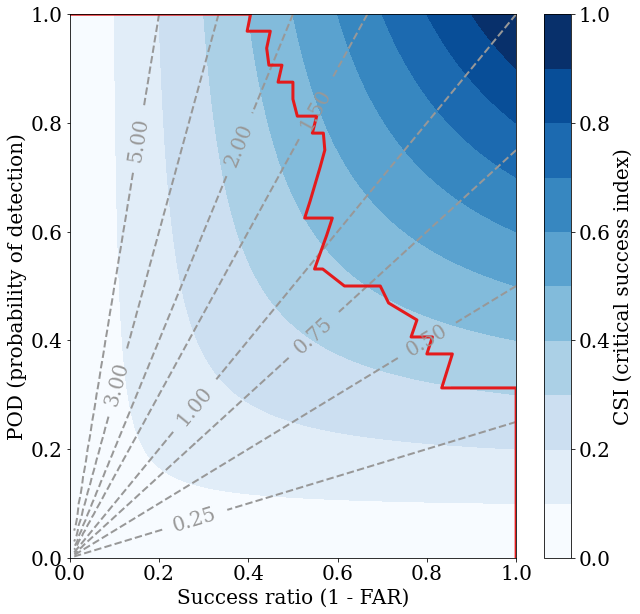

Mean of empty slice.
invalid value encountered in double_scalars
The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
Mean of empty slice.
invalid value encountered in double_scalars


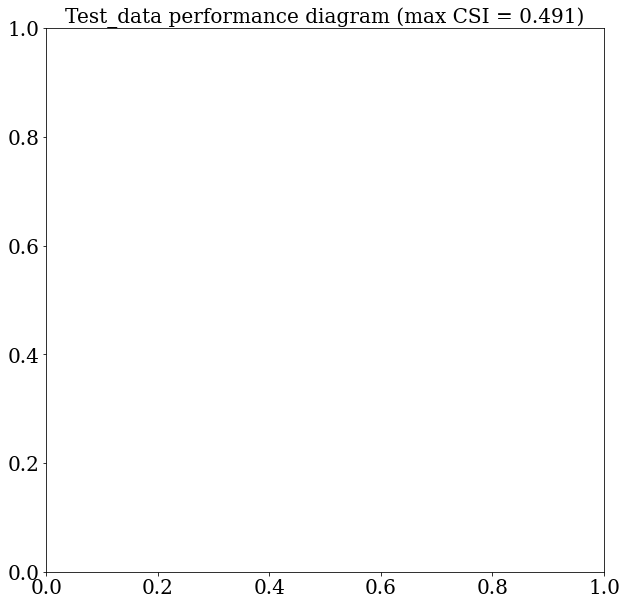

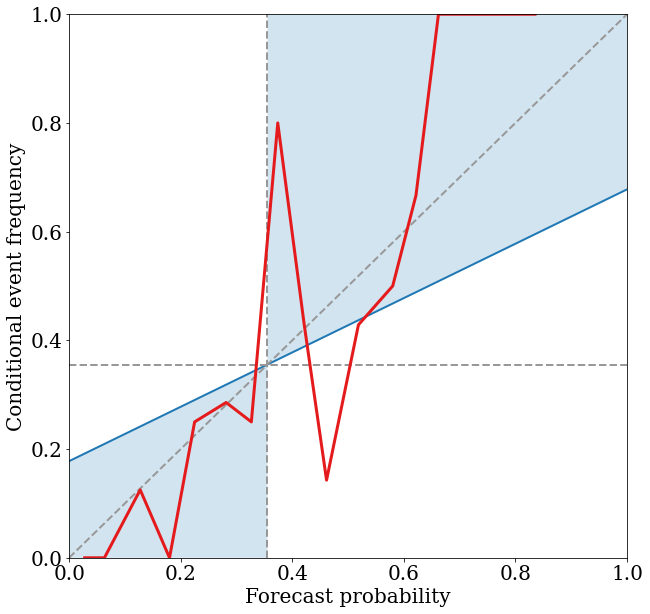

{'max_peirce_score': 0.4536637931034483,
 'area_under_roc_curve': 0.787176724137931,
 'max_csi': 0.4905660377358491,
 'brier_score': 0.17255446636432353,
 'brier_skill_score': 0.24387400967143605}

In [32]:
import sklearn
eval_binary_classifn2(test_target_y['Binary_EF'].values,predsprob[:,1], training_event_frequency, dataset_name='test_data')

In [ ]:
# Training Data

#predictor_cols = ['0.5_Tilt_(m)',	'Peak_Avg.',	'Peak_Width',	'Avg_Meso_Distance_(Km)',	'Avg_Meso_V',	'Binary_Mode',	'Peak_(m/s)',	'PA_(m/s)',	'Tavg_(m/s)',	'peak_time_m/s',	'Increase']
#predictor_cols = ['0.5_Tilt_(m)',	'Peak_Tilt_1.3',	'Peak_Tilt_0.9',	'Peak_Tilt_0.5',	'Peak_Avg.',	'Peak_Width',	'Avg_Tilt_0.5',	'Avg_Tilt_0.9',	'Avg_Tilt_1.3',	'Avg_Meso_Distance_(Km)',	'Avg_Meso_V',	'Binary_Mode',	'Peak_(m/s)',	'PA_(m/s)',	'Tavg_(m/s)',	'tilt1_peak_(m/s',	'tilt2_peak_(m/s)',	'tilt3_peak_(m/s)',	'peak_time_m/s',	'Increase']

#1st iteration
#predictor_cols = ['Avg_Meso_Distance_(Km)',	'Mode',	'Peak_(m/s)', 'Distance(km)', 'tr1meso', 'tr2meso', 'tr3meso', 'tr1dV', 'tr2dV', 'tr3dV']
#2nd iteration
#predictor_cols = ['Avg_Meso_Distance_(Km)',	'Mode',	'Peak_(m/s)', 'tr3meso', 'tr2dV', 'tr3dV']

#3rd iteration
predictor_cols = ['Avg_Meso_Distance_(Km)',	'Mode',	'Peak_(m/s)']

target_col = ['Binary_EF']
X = reduced_data[predictor_cols]
Y = reduced_data[target_col]

X_normal = preprocessing.normalize(X)
X_scaled = preprocessing.scale(X)

training_predictor, test_predictor, training_target, test_target = train_test_split(X_scaled, Y, test_size=0.3, random_state=25, stratify=Y)

# Initiate the model
rf_model_t = RandomForestClassifier(n_estimators=100).fit(training_predictor, training_target.values.ravel())

# Train the Model
#p = logreg_t.fit(X_scaled, Y.values.ravel())

In [ ]:
# Test model with training data
training_event_frequency_t = numpy.mean(
    training_target['Binary_EF'].values)
intensity_predict_t = rf_model_t.predict(training_predictor)
predsprob_t = rf_model_t.predict_proba(training_predictor)

Training_data Max Peirce score (POD - POFD) = 1.000
Training_data AUC (area under ROC curve) = 1.000
Training_data Max CSI (critical success index) = 1.000
Training_data Brier score = 0.014
Training_data Brier skill score (improvement over climatology) = 0.940


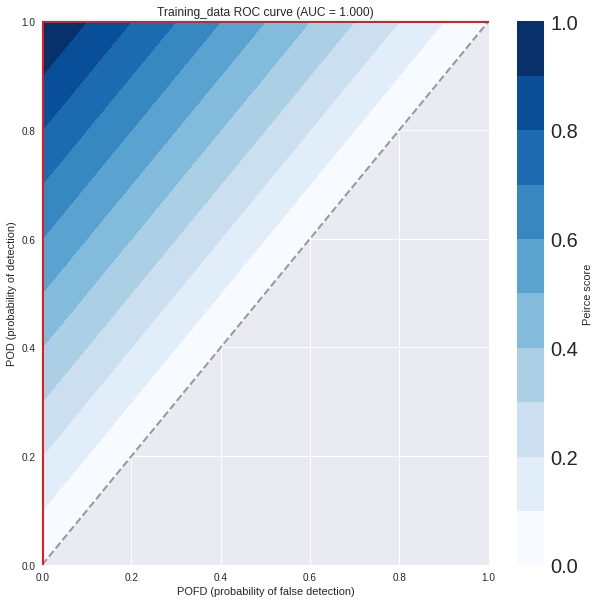

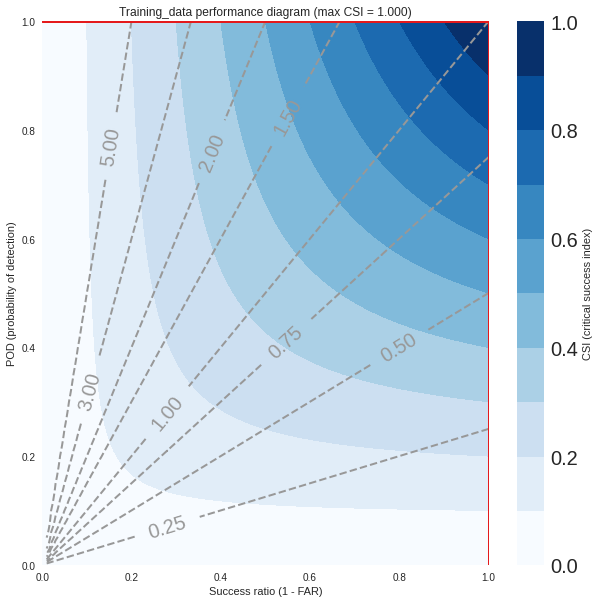

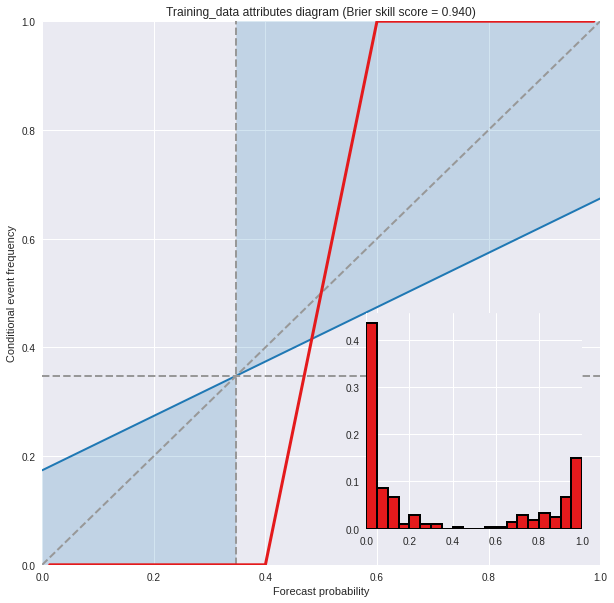

{'area_under_roc_curve': 1.0,
 'brier_score': 0.013664054260632108,
 'brier_skill_score': 0.9397642941343801,
 'max_csi': 1.0,
 'max_peirce_score': 1.0}

In [ ]:
# Evaluate training data
eval_binary_classifn2(training_target['Binary_EF'].values,predsprob_t[:,1], training_event_frequency_t, dataset_name='training_data')

In [ ]:
# Check skill with confusion matrix
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(training_target['Binary_EF'], intensity_predict_t)
cnf_matrix

array([[135,   0],
       [  0,  72]])

In [ ]:
a = cnf_matrix[0,0]
b = cnf_matrix[0,1]
c = cnf_matrix[1,0]
d = cnf_matrix[1,1]
print('number of true positives (forecast = label = "yes"):',a)
print('number of false positives (forecast = "yes" but label = "no"):',b)
print('number of false negatives (forecast = "no" but label = "yes"):',c)
print('number of true negatives (forecast = label = "no"):',d)

number of true positives (forecast = label = "yes"): 135
number of false positives (forecast = "yes" but label = "no"): 0
number of false negatives (forecast = "no" but label = "yes"): 0
number of true negatives (forecast = label = "no"): 72


In [ ]:
# Probability of Detection
POD = a/(a+c)

# Probability of False Detection
POFD = b/(b+d)

# False Alarm Ratio
FAR = b/(a+b)

# Success Ratio
SR = 1-FAR

# Frequency of Correct Nulls
FOCN = d/(c+d)

# Accuracy
Accuracy = (a+d)/(a+b+c+d)

# Critical Success Index
CSI = a/(a+b+c)

# Frequency Bias
FB = (a+b)/(c+d)

In [ ]:
print(POD)
print(POFD)
print(FAR)
print(SR)
print(FOCN)
print(Accuracy)
print(CSI)
print(FB)

1.0
0.0
0.0
1.0
1.0
1.0
1.0
1.875


In [ ]:
#import sklearn
# Other performance metrics

prob0 = []
prob1 = []
for i in range(len(predsprob_t)):
    prob0.append(predsprob_t[i][0])
    prob1.append(predsprob_t[i][1])

#Jaccard Index, want this to be close to one
from sklearn.metrics import jaccard_score
j_index = jaccard_score(y_true=training_target['Binary_EF'],y_pred=intensity_predict_t)
round(j_index,2)
print('j_index:',j_index)

# F1-score
from sklearn.metrics import f1_score
f1 = f1_score(training_target['Binary_EF'], intensity_predict_t)
print('f1 score',f1)

# Brier skill score
##from sklearn.metrics import brier_score_loss
##log_score = brier_score_loss((test_target['fzn_or_liq'].values).reshape(-1,1), predsprob[:][0])
##print('Brier:',log_score)
from sklearn.metrics import brier_score_loss
brier_score = brier_score_loss(training_target['Binary_EF'],prob1)
print('Brier:',brier_score)

# Precision score
from sklearn.metrics import precision_score
precision_score = precision_score(training_target['Binary_EF'], intensity_predict_t)
print('precision score:', precision_score)

#RMSE
print(math.sqrt(sklearn.metrics.mean_squared_error(y_true=training_target['Binary_EF'],y_pred=intensity_predict_t)))

#Accuracy
print(rf_model_t.score(training_predictor,training_target))

#Recall score
from sklearn.metrics import recall_score
print(recall_score(training_target['Binary_EF'], intensity_predict_t))

j_index: 1.0
f1 score 1.0
Brier: 0.01385024154589372
precision score: 1.0
0.0
1.0
1.0


In [ ]:
# Testing Training Sizes
train_sizes = [50, 80, 110, 140 , 170, 210]
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve
train_sizes, train_scores, validation_scores = learning_curve(
estimator = RandomForestClassifier(),
X = X_scaled,
y = Y, train_sizes = train_sizes, cv = 5,
scoring = 'neg_root_mean_squared_error')

In [ ]:
sorted(sklearn.metrics.SCORERS.keys())

In [ ]:
train_scores_mean = -train_scores.mean(axis = 1)
validation_scores_mean = -validation_scores.mean(axis = 1)
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(validation_scores_mean, index = train_sizes))

Mean training scores

 50    -0.0
80    -0.0
110   -0.0
140   -0.0
170   -0.0
210   -0.0
dtype: float64

 --------------------

Mean validation scores

 50     0.385520
80     0.433513
110    0.449265
140    0.408861
170    0.385693
210    0.347145
dtype: float64


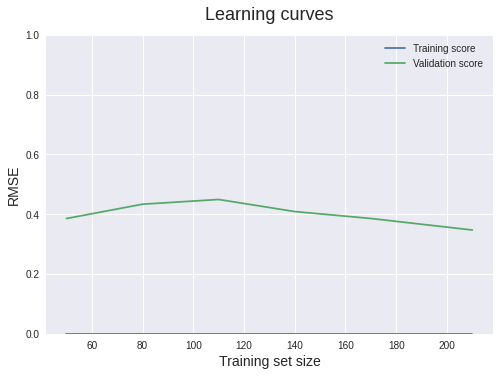

In [ ]:
import matplotlib.pyplot as plt
import matplotlib

plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean, label = 'Training score')
plt.plot(train_sizes, validation_scores_mean, label = 'Validation score')
plt.ylabel('RMSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves', fontsize = 18, y = 1.03)
plt.legend()
plt.ylim(0,1)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Machine_Learning/Images/RF_rmse_LC')

In [ ]:
#Cross-validation
from sklearn.model_selection import cross_validate # STRATIFEID K-FOLD IS USED AUTOMATICALLY WHEN GIVEN AN INTEGER
import numpy as np
#create a new KNN model
log_reg_cv = RandomForestClassifier()
#train model with cv of 5 
cv_scores = cross_validate(log_reg_cv, X_scaled, Y.values.ravel(), cv=5, scoring=('jaccard', 'max_error', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'precision', 'recall', 'roc_auc', 'accuracy', 'f1'), return_estimator=True)
#print each cv score (accuracy) and average them
print(cv_scores)
print('jaccard_scores mean:{}'.format(np.mean(cv_scores['test_jaccard'])))
print('jaccard_scores max:{}'.format(np.max(cv_scores['test_jaccard'])))
print(np.std(cv_scores['test_jaccard']))
print('_neg_brier_score_scores mean:{}'.format(np.mean(cv_scores['test_neg_brier_score'])))
print('_neg_brier_score_scores max:{}'.format(np.max(cv_scores['test_neg_brier_score'])))
print(np.std(cv_scores['test_neg_brier_score']))
print('neg_log_loss_scores mean:{}'.format(np.mean(cv_scores['test_neg_log_loss'])))
print('neg_log_loss_scores max:{}'.format(np.max(cv_scores['test_neg_log_loss'])))
print(np.std(cv_scores['test_neg_log_loss']))
print('neg_mean_abs_error_scores mean:{}'.format(np.mean(cv_scores['test_neg_mean_absolute_error'])))
print('neg_mean_abs_error_scores max:{}'.format(np.max(cv_scores['test_neg_mean_absolute_error'])))
print(np.std(cv_scores['test_neg_mean_absolute_error']))
print('neg_mean_sqr_error_scores mean:{}'.format(np.mean(cv_scores['test_neg_mean_squared_error'])))
print('neg_mean_sqr_error_scores max:{}'.format(np.max(cv_scores['test_neg_mean_squared_error'])))
print(np.std(cv_scores['test_neg_mean_squared_error']))
print('precision_scores mean:{}'.format(np.mean(cv_scores['test_precision'])))
print('precision_scores max:{}'.format(np.max(cv_scores['test_precision'])))
print(np.std(cv_scores['test_precision']))
print('recall_scores mean:{}'.format(np.mean(cv_scores['test_recall'])))
print('recall_scores max:{}'.format(np.max(cv_scores['test_recall'])))
print(np.std(cv_scores['test_recall']))
print('roc_auc_scores mean:{}'.format(np.mean(cv_scores['test_roc_auc'])))
print('roc_auc_scores max:{}'.format(np.max(cv_scores['test_roc_auc'])))
print(np.std(cv_scores['test_roc_auc']))
print('accuracy_scores mean:{}'.format(np.mean(cv_scores['test_accuracy'])))
print('accuracy_scores max:{}'.format(np.max(cv_scores['test_accuracy'])))
print(np.std(cv_scores['test_accuracy']))
print('f1_scores mean:{}'.format(np.mean(cv_scores['test_f1'])))
print('f1_scores max:{}'.format(np.max(cv_scores['test_f1'])))
print(np.std(cv_scores['test_f1']))
print(np.where(cv_scores['test_accuracy']==np.max(cv_scores['test_accuracy'])))

{'fit_time': array([0.14430356, 0.14058757, 0.14104557, 0.14628649, 0.14638186]), 'score_time': array([0.03200603, 0.04190135, 0.02807951, 0.02973819, 0.02609968]), 'estimator': [RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier()], 'test_jaccard': array([0.69230769, 0.57142857, 0.7       , 0.85714286, 0.71428571]), 'test_max_error': array([-1, -1, -1, -1, -1]), 'test_neg_brier_score': array([-0.096615  , -0.12181667, -0.08441695, -0.05941186, -0.11190169]), 'test_neg_log_loss': array([-0.33123275, -0.94870572, -0.31631183, -0.253013  , -0.90514544]), 'test_neg_mean_absolute_error': array([-0.13333333, -0.15      , -0.10169492, -0.05084746, -0.13559322]), 'test_neg_mean_squared_error': array([-0.13333333, -0.15      , -0.10169492, -0.05084746, -0.13559322]), 'test_precision': array([0.7826087 , 1.        , 1.        , 1.        , 0.74074074]), 'test_recall': array([0.85714286, 0.57142857, 0.7       , 0.8571428

In [ ]:
#Create confusion matrix evaluator
from sklearn.metrics import confusion_matrix
def confusion_matrix_scorer(log_reg_cv, X, Y):
    y_pred = log_reg_cv.predict(X)
    cm = confusion_matrix(Y, y_pred)
    return {'tn': cm[0, 0], 'fp': cm[0, 1], 'fn': cm[1, 0], 'tp': cm[1, 1]}

cv_scores = cross_validate(log_reg_cv, X_scaled, Y.values.ravel(), cv=5, scoring=confusion_matrix_scorer, return_estimator=True)

In [ ]:
#Plot CV confusion matrices
a = cv_scores['test_tp']
b = cv_scores['test_fp']
c = cv_scores['test_fn']
d = cv_scores['test_tn']
print('number of true positives (forecast = label = "yes"):',a)
print('number of false positives (forecast = "yes" but label = "no"):',b)
print('number of false negatives (forecast = "no" but label = "yes"):',c)
print('number of true negatives (forecast = label = "no"):',d)

number of true positives (forecast = label = "yes"): [17 12 13 18 21]
number of false positives (forecast = "yes" but label = "no"): [ 5  0  0  0 10]
number of false negatives (forecast = "no" but label = "yes"): [4 9 7 3 0]
number of true negatives (forecast = label = "no"): [34 39 39 38 28]


In [ ]:
#Cross-validation diagnostics, COMBINES ALL CV PREDICTIONS
from sklearn.model_selection import cross_val_predict

cv_predictions = cross_val_predict(log_reg_cv, X_scaled, Y.values.ravel(), cv=5, method='predict')
cnf_matrix = metrics.confusion_matrix(Y.values.ravel(), cv_predictions)
cnf_matrix

array([[180,  13],
       [ 22,  82]])

In [ ]:
#grid search, STRATIIED K-FOLD IS USED WITH AN INTEGER FOR CV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
#create new a knn model
model = RandomForestClassifier()
n_estimators = [1, 2, 4, 8, 16, 32, 64, 100, 200]
max_features = ['sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [5,10,20,30,40,50,60,70,80,90]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features, max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf, bootstrap=bootstrap)
grid_search = RandomizedSearchCV(estimator=model, param_distributions=grid, cv=5, n_iter=1000, scoring=('jaccard', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'precision', 'recall', 'roc_auc', 'accuracy', 'f1'), refit='accuracy')
#grid_search = GridSearchCV(estimator=model, param_grid=grid, cv=5, scoring=('jaccard', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'precision', 'recall', 'roc_auc', 'accuracy', 'f1'), refit='accuracy')
grid_result = grid_search.fit(X_scaled, Y.values.ravel())

In [ ]:
#check gridsearch cv
#check top performing n_neighbors value
print(grid_result.best_params_)
print(grid_result.best_score_)
grid_result.cv_results_

{'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 80, 'bootstrap': False}
0.9024858757062149


{'mean_fit_time': array([0.27447729, 1.02066951, 0.0141458 , 0.00250144, 0.00265808,
        0.00198264, 1.02031708, 0.00230594, 0.10576625, 0.33705149,
        0.53408723, 0.01153841, 0.81508021, 0.00197082, 0.13582349,
        0.0024837 , 0.13214025, 0.8072154 , 0.13615479, 0.27565565,
        0.80748305, 0.52731137, 0.67754388, 0.10950675, 0.99991732,
        0.3340404 , 0.05294309, 0.13203363, 0.80958409, 0.26359434,
        0.2751668 , 1.00465221, 0.10666041, 0.26413779, 0.13543844,
        0.26985602, 0.00197215, 0.00230436, 0.10920358, 0.78783512,
        0.13503046, 0.05440874, 0.33032646, 0.68812175, 0.34008369,
        0.26821432, 0.2681046 , 0.01170473, 0.53186183, 0.01178889,
        1.02749782, 0.05473289, 0.01138344, 0.0684514 , 0.1101819 ,
        0.80200267, 0.01185875, 0.26544113, 0.01546454, 0.26853032,
        0.34057579, 0.69402976, 0.07140274, 0.34913254, 0.68204541,
        0.01445799, 0.05401626, 0.06978369, 0.01171308, 0.68082032,
        0.01217237, 0.80603237,

In [ ]:
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_accuracy']
stds = grid_result.cv_results_['std_test_accuracy']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

#Best: 0.909434 using {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 10}

Best: 0.902486 using {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 80, 'bootstrap': False}
0.882203 (0.036839) with: {'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 50, 'bootstrap': False}
0.875480 (0.034599) with: {'n_estimators': 750, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 40, 'bootstrap': True}
0.878870 (0.040344) with: {'n_estimators': 10, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True}
0.838701 (0.051865) with: {'n_estimators': 1, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'bootstrap': True}
0.885706 (0.044010) with: {'n_estimators': 1, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 20, 'bootstrap': False}
0.858531 (0.029715) with: {'n_estimators': 1, 'min_samples_split': 5, 'min_samp

In [ ]:
#check mean score for the top performing value of n_neighbors
#log_gscv.best_score_
grid_result.best_score_

0.9024858757062149

In [ ]:
#check mean score for the top performing value of n_neighbors
#log_gscv.best_score_
best_loc=np.where(grid_result.cv_results_['mean_test_accuracy']==grid_result.best_score_)[0][0]
print("Accuracy",+grid_result.best_score_)
print("Accuracy SD",+grid_result.cv_results_['std_test_accuracy'][6])
print("Jaccard",+grid_result.cv_results_['mean_test_jaccard'][6])
print("Jaccard SD",+grid_result.cv_results_['std_test_jaccard'][6])
print("Brier Score",+grid_result.cv_results_['mean_test_neg_brier_score'][6])
print("Brier Score SD",+grid_result.cv_results_['std_test_neg_brier_score'][6])
print("Log Loss",+grid_result.cv_results_['mean_test_neg_log_loss'][6])
print("Log Loss SD",+grid_result.cv_results_['std_test_neg_log_loss'][6])
print("Mean ABS Error",+grid_result.cv_results_['mean_test_neg_mean_absolute_error'][6])
print("Mean ABS Error SD",+grid_result.cv_results_['std_test_neg_mean_absolute_error'][6])
print("Mean Sqr Error",+grid_result.cv_results_['mean_test_neg_mean_squared_error'][6])
print("Mean Sqr Error SD",+grid_result.cv_results_['std_test_neg_mean_squared_error'][6])
print("Precision",+grid_result.cv_results_['mean_test_precision'][6])
print("Precision SD",+grid_result.cv_results_['std_test_precision'][6])
print("Recall",+grid_result.cv_results_['mean_test_recall'][6])
print("Recall SD",+grid_result.cv_results_['std_test_recall'][6])
print("ROC_AUC",+grid_result.cv_results_['mean_test_roc_auc'][6])
print("ROC_AUC",+grid_result.cv_results_['std_test_roc_auc'][6])
print("F1",+grid_result.cv_results_['mean_test_f1'][6])
print("F1 SD",+grid_result.cv_results_['std_test_f1'][6])

Accuracy 0.9024858757062149
Accuracy SD 0.04580663303487151
Jaccard 0.6918522167487684
Jaccard SD 0.10323050782888142
Brier Score -0.09712317103925178
Brier Score SD 0.024297145152165963
Log Loss -0.358164398771269
Log Loss SD 0.09292405873618556
Mean ABS Error -0.12118644067796609
Mean ABS Error SD 0.04580663303487151
Mean Sqr Error -0.12118644067796609
Mean Sqr Error SD 0.04580663303487151
Precision 0.9036789297658864
Precision SD 0.1253248259920307
Recall 0.7680952380952382
Recall SD 0.1320310552350668
ROC_AUC 0.9145581903476641
ROC_AUC 0.03170442587808443
F1 0.8135644497346626
F1 SD 0.07053030511397394


In [ ]:
#Diagnostics from grid_search
grid_search_predict = grid_result.predict(X_scaled)
cnf_matrix = metrics.confusion_matrix(Y, grid_search_predict)
cnf_matrix

array([[190,   3],
       [  5,  99]])